In [1]:
import pandas as pd 
import numpy as np 
import sys
import os
import warnings
from pmdarima import auto_arima
import itertools
warnings.filterwarnings("ignore")
from pandas.plotting import autocorrelation_plot
from statsmodels.graphics.tsaplots import plot_acf
from matplotlib import pyplot as plt
from pandas.plotting import lag_plot
import statsmodels.api as sm
import statsmodels.tsa.api as smt
import statsmodels.formula.api as smf
from sklearn.metrics import mean_squared_error
import matplotlib.pyplot as plt
%matplotlib inline
import datetime
import calendar
import seaborn as sns
from statsmodels.tsa.ar_model import AR
from statsmodels.tsa.arima_model import ARMA
from statsmodels.tsa.arima_model import ARIMA
from statsmodels.tsa.statespace.sarimax import SARIMAX
import seaborn as sns
from datetime import datetime
from datetime import timedelta
import datetime as dt
from statsmodels.tsa.stattools import adfuller
from matplotlib import pyplot
from statsmodels.graphics.tsaplots import plot_acf
from statsmodels.graphics.tsaplots import plot_pacf
from statsmodels.tsa.statespace.sarimax import SARIMAX
from statsmodels.graphics.tsaplots import acf, plot_acf, plot_pacf
from statsmodels.tsa.stattools import adfuller
from pmdarima.arima.utils import ndiffs
from statsmodels.tsa.arima_model import ARIMA
import pmdarima as pm


from fbprophet import Prophet 
from os import listdir
from os.path import isfile, join
import matplotlib.pyplot as plt # NOTA: Por alguna razón, al cargar Prophet, 
# sólo podré plotear si primero ejecuto pd.plot
# import chart_studio.plotly as py
import cufflinks as cf
import plotly.express as px

from plotly.offline import download_plotlyjs, init_notebook_mode, plot, iplot
init_notebook_mode(connected=True)

cf.go_offline()

import pandas_profiling
import plotly.graph_objects as go

ModuleNotFoundError: No module named 'fbprophet'

https://online.stat.psu.edu/stat510/lesson/1/1.2

In [ ]:
os.listdir('.')

In [4]:
df = pd.read_csv('Data_covid_proyecto_visualizacion.csv')
df

,Unnamed: 0,Region,Codigo region,Comuna,Codigo comuna,Poblacion,Casos Confirmados,fecha,anio,mes,dia
0,0,Arica y Parinacota,15,Arica,15101,247552.0,6.0,2020-03-30,2020,3,Monday
1,1,Arica y Parinacota,15,Camarones,15102,1233.0,0.0,2020-03-30,2020,3,Monday
2,2,Arica y Parinacota,15,General Lagos,15202,810.0,0.0,2020-03-30,2020,3,Monday
3,3,Arica y Parinacota,15,Putre,15201,2515.0,0.0,2020-03-30,2020,3,Monday
4,5,Tarapacá,1,Alto Hospicio,1107,129999.0,0.0,2020-03-30,2020,3,Monday
...,...,...,...,...,...,...,...,...,...,...,...
56393,59000,Magallanes,12,Punta Arenas,12101,141984.0,25166.0,2021-10-11,2021,10,Monday
56394,59001,Magallanes,12,Rio Verde,12103,211.0,17.0,2021-10-11,2021,10,Monday
56395,59002,Magallanes,12,San Gregorio,12104,681.0,74.0,2021-10-11,2021,10,Monday
56396,59003,Magallanes,12,Timaukel,12303,282.0,42.0,2021-10-11,2021,10,Monday


In [5]:
df_valpo = df[df['Comuna']=='Valparaiso']
df_valpo

,Unnamed: 0,Region,Codigo region,Comuna,Codigo comuna,Poblacion,Casos Confirmados,fecha,anio,mes,dia
78,83,Valparaíso,5,Valparaiso,5101,315732.0,16.0,2020-03-30,2020,3,Monday
424,445,Valparaíso,5,Valparaiso,5101,315732.0,26.0,2020-04-01,2020,4,Wednesday
770,807,Valparaíso,5,Valparaiso,5101,315732.0,23.0,2020-04-03,2020,4,Friday
1116,1169,Valparaíso,5,Valparaiso,5101,315732.0,26.0,2020-04-06,2020,4,Monday
1462,1531,Valparaíso,5,Valparaiso,5101,315732.0,36.0,2020-04-08,2020,4,Wednesday
...,...,...,...,...,...,...,...,...,...,...,...
54746,57279,Valparaíso,5,Valparaiso,5101,315732.0,33678.0,2021-09-27,2021,9,Monday
55092,57641,Valparaíso,5,Valparaiso,5101,315732.0,33715.0,2021-10-01,2021,10,Friday
55438,58003,Valparaíso,5,Valparaiso,5101,315732.0,33734.0,2021-10-04,2021,10,Monday
55784,58365,Valparaíso,5,Valparaiso,5101,315732.0,33777.0,2021-10-08,2021,10,Friday


In [1]:
df_st = df_valpo.groupby('fecha')[['Casos Confirmados']].sum()
df_st

NameError: name 'df_valpo' is not defined

### graficamos serie temporal..

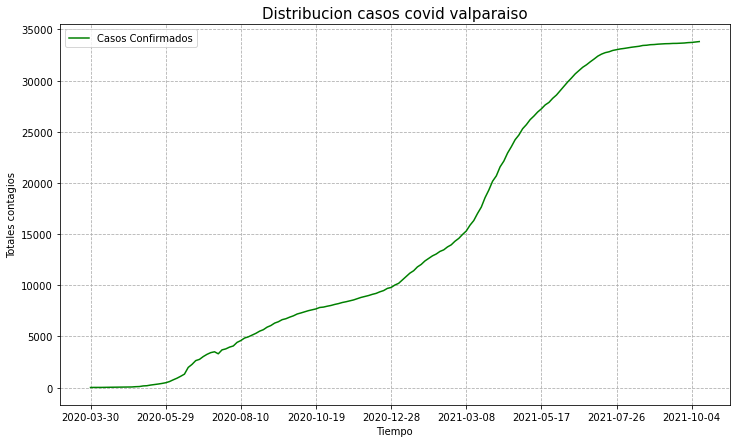

In [17]:

fig, ax = plt.subplots(1, figsize=(12,7))

a = df_st.plot(color='green', ax=ax)

a.set_xlabel('Tiempo')


a.set_ylabel('Totales contagios')


a.grid(linestyle='--')



a.set_title('Distribucion casos covid valparaiso', fontsize=15)
plt.show()



## Serie con tendencia... no es estacionaria..

In [18]:
### media movil de la serie.....

df_st['contagios_MA7'] = df_st['Casos Confirmados'].rolling(7).mean()
df_st

,Casos Confirmados,contagios_MA7
fecha,,
2020-03-30,16.0,NaN
2020-04-01,26.0,NaN
2020-04-03,23.0,NaN
2020-04-06,26.0,NaN
2020-04-08,36.0,NaN
...,...,...
2021-09-27,33678.0,33633.142857
2021-10-01,33715.0,33651.000000
2021-10-04,33734.0,33668.857143


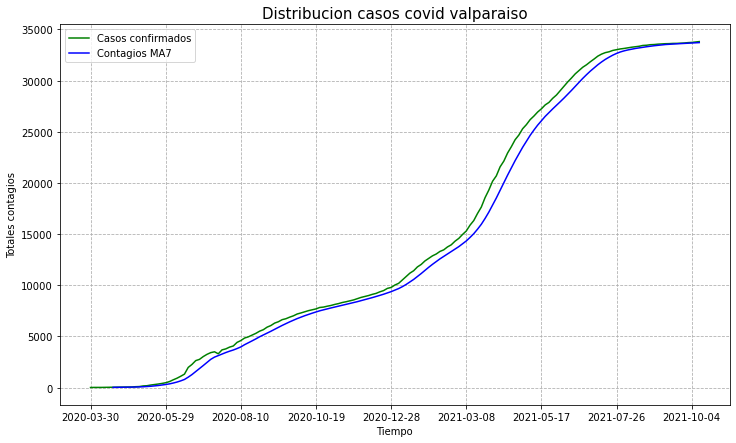

In [26]:

fig, ax = plt.subplots(1, figsize=(12,7))

a1 = df_st['Casos Confirmados'].plot(color='green', ax=ax,label='Casos confirmados')


a2 = df_st['contagios_MA7'].plot(color='blue', ax=ax,label='Contagios MA7')


a1.set_xlabel('Tiempo')


a1.set_ylabel('Totales contagios')


a1.grid(linestyle='--')

plt.legend()

a1.set_title('Distribucion casos covid valparaiso', fontsize=15)

plt.show()



### estacionarizar la serie...

In [27]:
df_st['diff_lag1'] = df_st['Casos Confirmados'].diff(1)
df_st

,Casos Confirmados,contagios_MA7,diff_lag1
fecha,,,
2020-03-30,16.0,NaN,NaN
2020-04-01,26.0,NaN,10.0
2020-04-03,23.0,NaN,-3.0
2020-04-06,26.0,NaN,3.0
2020-04-08,36.0,NaN,10.0
...,...,...,...
2021-09-27,33678.0,33633.142857,20.0
2021-10-01,33715.0,33651.000000,37.0
2021-10-04,33734.0,33668.857143,19.0


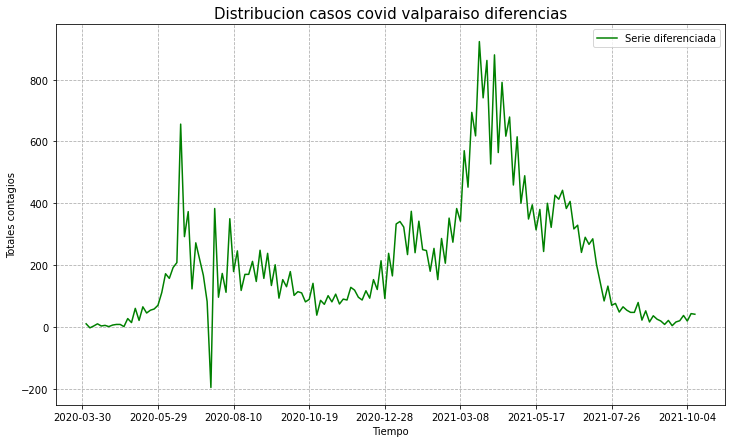

In [28]:

fig, ax = plt.subplots(1, figsize=(12,7))

a1 = df_st['diff_lag1'].plot(color='green', ax=ax,label='Serie diferenciada')


a1.set_xlabel('Tiempo')


a1.set_ylabel('Totales contagios')


a1.grid(linestyle='--')

plt.legend()

a1.set_title('Distribucion casos covid valparaiso diferencias', fontsize=15)

plt.show()



# es estacionaria la serie temporal???

### aplicamos test dickey fuller data original...

In [29]:
X = df_st['Casos Confirmados'].values
result = adfuller(X,autolag='AIC')
print('ADF Statistic: %f' % result[0])
print('p-value: %f' % result[1])
print('Critical Values:')
for key, value in result[4].items():
	print('\t%s: %.3f' % (key, value))

ADF Statistic: -1.085836
p-value: 0.720687
Critical Values:
	1%: -3.475
	5%: -2.881
	10%: -2.577


In [30]:
### serie estacionaria diferenciada.... sera estacionaria la diferenciada?

X2 = df_st['diff_lag1'][1:].values
result2 = adfuller(X2,autolag='AIC')
print('ADF Statistic: %f' % result2[0])
print('p-value: %f' % result2[1])
print('Critical Values:')
for key, value in result2[4].items():
	print('\t%s: %.3f' % (key, value))

ADF Statistic: -1.802431
p-value: 0.379256
Critical Values:
	1%: -3.475
	5%: -2.881
	10%: -2.577


### la serie sigue teniendo tendencia diferenciamos una mas...

In [31]:
df_st['diff_lag2'] = df_st['Casos Confirmados'].diff(2)
df_st

,Casos Confirmados,contagios_MA7,diff_lag1,diff_lag2
fecha,,,,
2020-03-30,16.0,NaN,NaN,NaN
2020-04-01,26.0,NaN,10.0,NaN
2020-04-03,23.0,NaN,-3.0,7.0
2020-04-06,26.0,NaN,3.0,0.0
2020-04-08,36.0,NaN,10.0,13.0
...,...,...,...,...
2021-09-27,33678.0,33633.142857,20.0,36.0
2021-10-01,33715.0,33651.000000,37.0,57.0
2021-10-04,33734.0,33668.857143,19.0,56.0


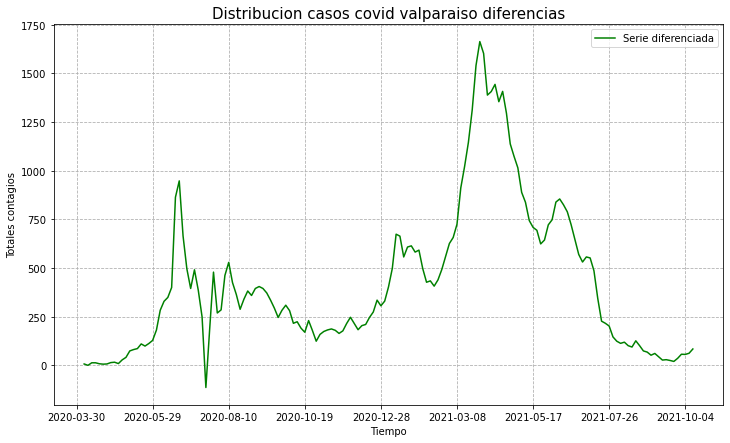

In [32]:

fig, ax = plt.subplots(1, figsize=(12,7))

a1 = df_st['diff_lag2'].plot(color='green', ax=ax,label='Serie diferenciada')


a1.set_xlabel('Tiempo')


a1.set_ylabel('Totales contagios')


a1.grid(linestyle='--')

plt.legend()

a1.set_title('Distribucion casos covid valparaiso diferencias', fontsize=15)

plt.show()



In [33]:
### serie estacionaria diferenciada.... sera estacionaria la diferenciada?

X2 = df_st['diff_lag2'][2:].values
result2 = adfuller(X2,autolag='AIC')
print('ADF Statistic: %f' % result2[0])
print('p-value: %f' % result2[1])
print('Critical Values:')
for key, value in result2[4].items():
	print('\t%s: %.3f' % (key, value))

ADF Statistic: -1.790207
p-value: 0.385334
Critical Values:
	1%: -3.475
	5%: -2.881
	10%: -2.577


In [34]:
df_st['diff_lag3'] = df_st['Casos Confirmados'].diff(3)
df_st

,Casos Confirmados,contagios_MA7,diff_lag1,diff_lag2,diff_lag3
fecha,,,,,
2020-03-30,16.0,NaN,NaN,NaN,NaN
2020-04-01,26.0,NaN,10.0,NaN,NaN
2020-04-03,23.0,NaN,-3.0,7.0,NaN
2020-04-06,26.0,NaN,3.0,0.0,10.0
2020-04-08,36.0,NaN,10.0,13.0,10.0
...,...,...,...,...,...
2021-09-27,33678.0,33633.142857,20.0,36.0,40.0
2021-10-01,33715.0,33651.000000,37.0,57.0,73.0
2021-10-04,33734.0,33668.857143,19.0,56.0,76.0


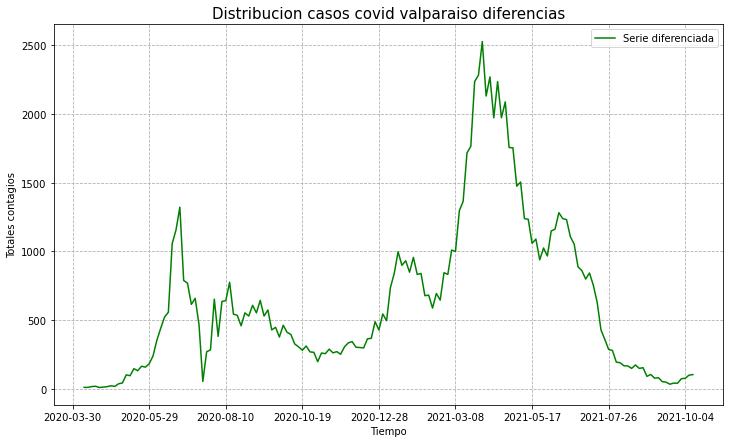

In [35]:

fig, ax = plt.subplots(1, figsize=(12,7))

a1 = df_st['diff_lag3'].plot(color='green', ax=ax,label='Serie diferenciada')


a1.set_xlabel('Tiempo')


a1.set_ylabel('Totales contagios')


a1.grid(linestyle='--')

plt.legend()

a1.set_title('Distribucion casos covid valparaiso diferencias', fontsize=15)

plt.show()



In [36]:
### serie estacionaria diferenciada.... sera estacionaria la diferenciada?

X2 = df_st['diff_lag3'][3:].values
result2 = adfuller(X2,autolag='AIC')
print('ADF Statistic: %f' % result2[0])
print('p-value: %f' % result2[1])
print('Critical Values:')
for key, value in result2[4].items():
	print('\t%s: %.3f' % (key, value))

ADF Statistic: -1.959499
p-value: 0.304609
Critical Values:
	1%: -3.475
	5%: -2.881
	10%: -2.577


In [37]:
df_st['diff_lag5'] = df_st['Casos Confirmados'].diff(5)
df_st

,Casos Confirmados,contagios_MA7,diff_lag1,diff_lag2,diff_lag3,diff_lag5
fecha,,,,,,
2020-03-30,16.0,NaN,NaN,NaN,NaN,NaN
2020-04-01,26.0,NaN,10.0,NaN,NaN,NaN
2020-04-03,23.0,NaN,-3.0,7.0,NaN,NaN
2020-04-06,26.0,NaN,3.0,0.0,10.0,NaN
2020-04-08,36.0,NaN,10.0,13.0,10.0,NaN
...,...,...,...,...,...,...
2021-09-27,33678.0,33633.142857,20.0,36.0,40.0,69.0
2021-10-01,33715.0,33651.000000,37.0,57.0,73.0,98.0
2021-10-04,33734.0,33668.857143,19.0,56.0,76.0,96.0


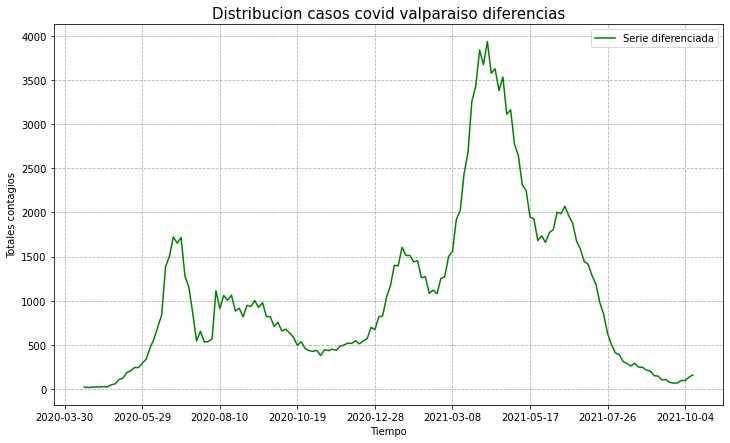

In [38]:

fig, ax = plt.subplots(1, figsize=(12,7))

a1 = df_st['diff_lag5'].plot(color='green', ax=ax,label='Serie diferenciada')


a1.set_xlabel('Tiempo')


a1.set_ylabel('Totales contagios')


a1.grid(linestyle='--')

plt.legend()

a1.set_title('Distribucion casos covid valparaiso diferencias', fontsize=15)

plt.show()



In [39]:
## serie estacionaria diferenciada.... sera estacionaria la diferenciada?

X2 = df_st['diff_lag5'][5:].values
result2 = adfuller(X2,autolag='AIC')
print('ADF Statistic: %f' % result2[0])
print('p-value: %f' % result2[1])
print('Critical Values:')
for key, value in result2[4].items():
	print('\t%s: %.3f' % (key, value))

ADF Statistic: -1.819510
p-value: 0.370819
Critical Values:
	1%: -3.476
	5%: -2.882
	10%: -2.578


In [40]:
df_st['diff_lag10'] = df_st['Casos Confirmados'].diff(10)
df_st

,Casos Confirmados,contagios_MA7,diff_lag1,diff_lag2,diff_lag3,diff_lag5,diff_lag10
fecha,,,,,,,
2020-03-30,16.0,NaN,NaN,NaN,NaN,NaN,NaN
2020-04-01,26.0,NaN,10.0,NaN,NaN,NaN,NaN
2020-04-03,23.0,NaN,-3.0,7.0,NaN,NaN,NaN
2020-04-06,26.0,NaN,3.0,0.0,10.0,NaN,NaN
2020-04-08,36.0,NaN,10.0,13.0,10.0,NaN,NaN
...,...,...,...,...,...,...,...
2021-09-27,33678.0,33633.142857,20.0,36.0,40.0,69.0,217.0
2021-10-01,33715.0,33651.000000,37.0,57.0,73.0,98.0,202.0
2021-10-04,33734.0,33668.857143,19.0,56.0,76.0,96.0,205.0


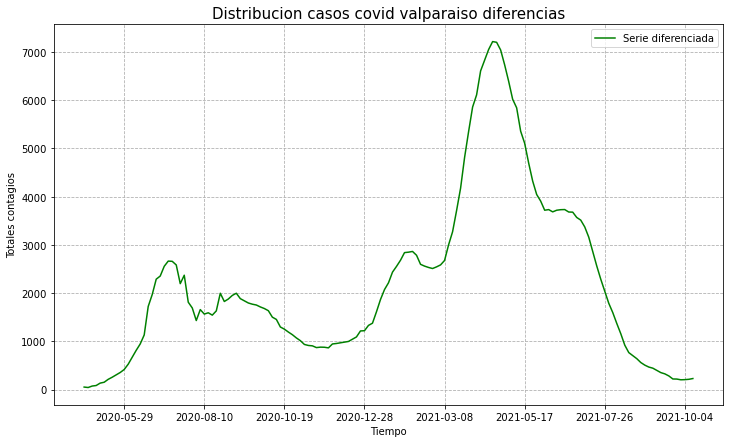

In [41]:
fig, ax = plt.subplots(1, figsize=(12,7))

a1 = df_st['diff_lag10'].plot(color='green', ax=ax,label='Serie diferenciada')


a1.set_xlabel('Tiempo')


a1.set_ylabel('Totales contagios')


a1.grid(linestyle='--')

plt.legend()

a1.set_title('Distribucion casos covid valparaiso diferencias', fontsize=15)

plt.show()



In [42]:
## serie estacionaria diferenciada.... sera estacionaria la diferenciada?

X2 = df_st['diff_lag10'][10:].values
result2 = adfuller(X2,autolag='AIC')
print('ADF Statistic: %f' % result2[0])
print('p-value: %f' % result2[1])
print('Critical Values:')
for key, value in result2[4].items():
	print('\t%s: %.3f' % (key, value))

ADF Statistic: -2.277030
p-value: 0.179483
Critical Values:
	1%: -3.478
	5%: -2.882
	10%: -2.578


In [43]:
df_st['diff_lag30'] = df_st['Casos Confirmados'].diff(30)
df_st

,Casos Confirmados,contagios_MA7,diff_lag1,diff_lag2,diff_lag3,diff_lag5,diff_lag10,diff_lag30
fecha,,,,,,,,
2020-03-30,16.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN
2020-04-01,26.0,NaN,10.0,NaN,NaN,NaN,NaN,NaN
2020-04-03,23.0,NaN,-3.0,7.0,NaN,NaN,NaN,NaN
2020-04-06,26.0,NaN,3.0,0.0,10.0,NaN,NaN,NaN
2020-04-08,36.0,NaN,10.0,13.0,10.0,NaN,NaN,NaN
...,...,...,...,...,...,...,...,...
2021-09-27,33678.0,33633.142857,20.0,36.0,40.0,69.0,217.0,3420.0
2021-10-01,33715.0,33651.000000,37.0,57.0,73.0,98.0,202.0,3051.0
2021-10-04,33734.0,33668.857143,19.0,56.0,76.0,96.0,205.0,2753.0


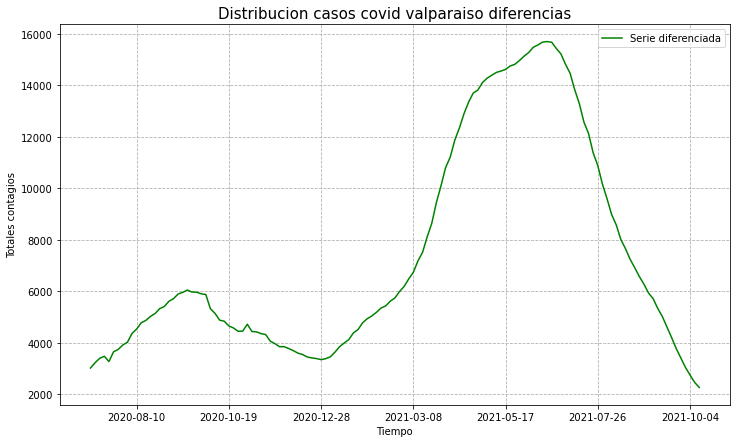

In [44]:
fig, ax = plt.subplots(1, figsize=(12,7))

a1 = df_st['diff_lag30'].plot(color='green', ax=ax,label='Serie diferenciada')


a1.set_xlabel('Tiempo')


a1.set_ylabel('Totales contagios')


a1.grid(linestyle='--')

plt.legend()

a1.set_title('Distribucion casos covid valparaiso diferencias', fontsize=15)

plt.show()



In [45]:
## serie estacionaria diferenciada.... sera estacionaria la diferenciada?

X2 = df_st['diff_lag30'][30:].values
result2 = adfuller(X2,autolag='AIC')
print('ADF Statistic: %f' % result2[0])
print('p-value: %f' % result2[1])
print('Critical Values:')
for key, value in result2[4].items():
	print('\t%s: %.3f' % (key, value))

ADF Statistic: -2.220843
p-value: 0.198768
Critical Values:
	1%: -3.485
	5%: -2.885
	10%: -2.579


In [46]:
df_st['diff_lag60'] = df_st['Casos Confirmados'].diff(60)
df_st

,Casos Confirmados,contagios_MA7,diff_lag1,diff_lag2,diff_lag3,diff_lag5,diff_lag10,diff_lag30,diff_lag60
fecha,,,,,,,,,
2020-03-30,16.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
2020-04-01,26.0,NaN,10.0,NaN,NaN,NaN,NaN,NaN,NaN
2020-04-03,23.0,NaN,-3.0,7.0,NaN,NaN,NaN,NaN,NaN
2020-04-06,26.0,NaN,3.0,0.0,10.0,NaN,NaN,NaN,NaN
2020-04-08,36.0,NaN,10.0,13.0,10.0,NaN,NaN,NaN,NaN
...,...,...,...,...,...,...,...,...,...
2021-09-27,33678.0,33633.142857,20.0,36.0,40.0,69.0,217.0,3420.0,19094.0
2021-10-01,33715.0,33651.000000,37.0,57.0,73.0,98.0,202.0,3051.0,18748.0
2021-10-04,33734.0,33668.857143,19.0,56.0,76.0,96.0,205.0,2753.0,18425.0


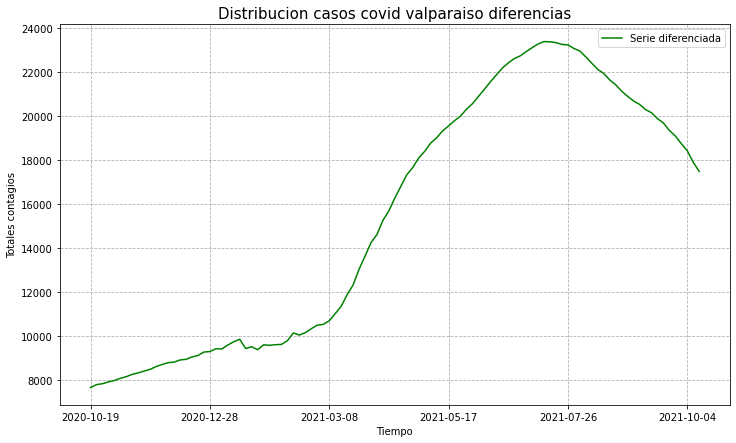

In [47]:
fig, ax = plt.subplots(1, figsize=(12,7))

a1 = df_st['diff_lag60'].plot(color='green', ax=ax,label='Serie diferenciada')


a1.set_xlabel('Tiempo')


a1.set_ylabel('Totales contagios')


a1.grid(linestyle='--')

plt.legend()

a1.set_title('Distribucion casos covid valparaiso diferencias', fontsize=15)

plt.show()


In [48]:
## serie estacionaria diferenciada.... sera estacionaria la diferenciada?

X2 = df_st['diff_lag60'][60:].values
result2 = adfuller(X2,autolag='AIC')
print('ADF Statistic: %f' % result2[0])
print('p-value: %f' % result2[1])
print('Critical Values:')
for key, value in result2[4].items():
	print('\t%s: %.3f' % (key, value))

ADF Statistic: -2.480878
p-value: 0.120197
Critical Values:
	1%: -3.499
	5%: -2.892
	10%: -2.583


In [49]:
df_st['diff_lag90'] = df_st['Casos Confirmados'].diff(90)
df_st

,Casos Confirmados,contagios_MA7,diff_lag1,diff_lag2,diff_lag3,diff_lag5,diff_lag10,diff_lag30,diff_lag60,diff_lag90
fecha,,,,,,,,,,
2020-03-30,16.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
2020-04-01,26.0,NaN,10.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN
2020-04-03,23.0,NaN,-3.0,7.0,NaN,NaN,NaN,NaN,NaN,NaN
2020-04-06,26.0,NaN,3.0,0.0,10.0,NaN,NaN,NaN,NaN,NaN
2020-04-08,36.0,NaN,10.0,13.0,10.0,NaN,NaN,NaN,NaN,NaN
...,...,...,...,...,...,...,...,...,...,...
2021-09-27,33678.0,33633.142857,20.0,36.0,40.0,69.0,217.0,3420.0,19094.0,25283.0
2021-10-01,33715.0,33651.000000,37.0,57.0,73.0,98.0,202.0,3051.0,18748.0,25230.0
2021-10-04,33734.0,33668.857143,19.0,56.0,76.0,96.0,205.0,2753.0,18425.0,25162.0


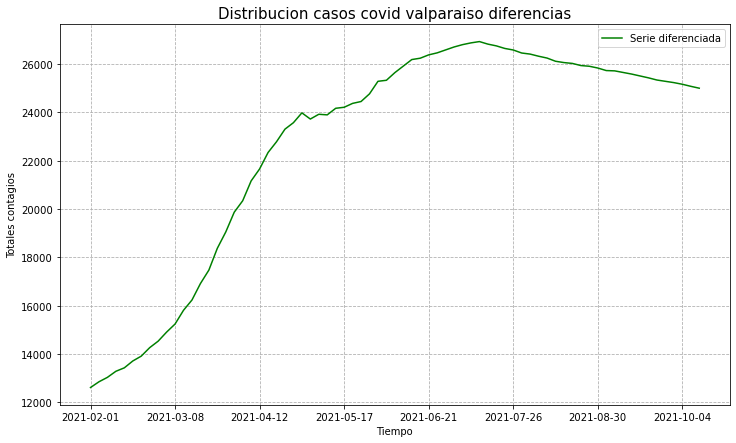

In [50]:
fig, ax = plt.subplots(1, figsize=(12,7))

a1 = df_st['diff_lag90'].plot(color='green', ax=ax,label='Serie diferenciada')


a1.set_xlabel('Tiempo')


a1.set_ylabel('Totales contagios')


a1.grid(linestyle='--')

plt.legend()

a1.set_title('Distribucion casos covid valparaiso diferencias', fontsize=15)

plt.show()

In [51]:
## serie estacionaria diferenciada.... sera estacionaria la diferenciada?

X2 = df_st['diff_lag90'][90:].values
result2 = adfuller(X2,autolag='AIC')
print('ADF Statistic: %f' % result2[0])
print('p-value: %f' % result2[1])
print('Critical Values:')
for key, value in result2[4].items():
	print('\t%s: %.3f' % (key, value))

ADF Statistic: -3.088332
p-value: 0.027429
Critical Values:
	1%: -3.527
	5%: -2.904
	10%: -2.589


In [52]:
ndiffs(df_st['Casos Confirmados'], test='adf')

2

In [54]:
ndiffs(df_st['diff_lag90'][90:], test='adf')

2

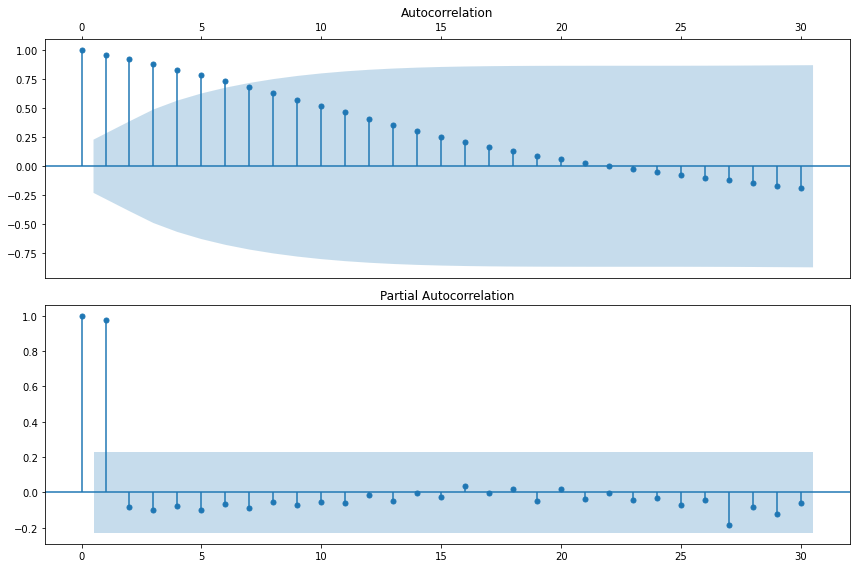

In [55]:
fig = plt.figure(figsize = (12, 8))

ax1 = fig.add_subplot(211)
sm.graphics.tsa.plot_acf(df_st['diff_lag90'][90:], lags=30, ax=ax1)
ax1.xaxis.set_ticks_position('top')

ax2 = fig.add_subplot(212)
sm.graphics.tsa.plot_pacf(df_st['diff_lag90'][90:], lags=30, ax=ax2)
ax2.xaxis.set_ticks_position('bottom')
fig.tight_layout()

### DESCOMPOSICION DE LA SERIE TEMPORAL...

<Figure size 864x648 with 0 Axes>

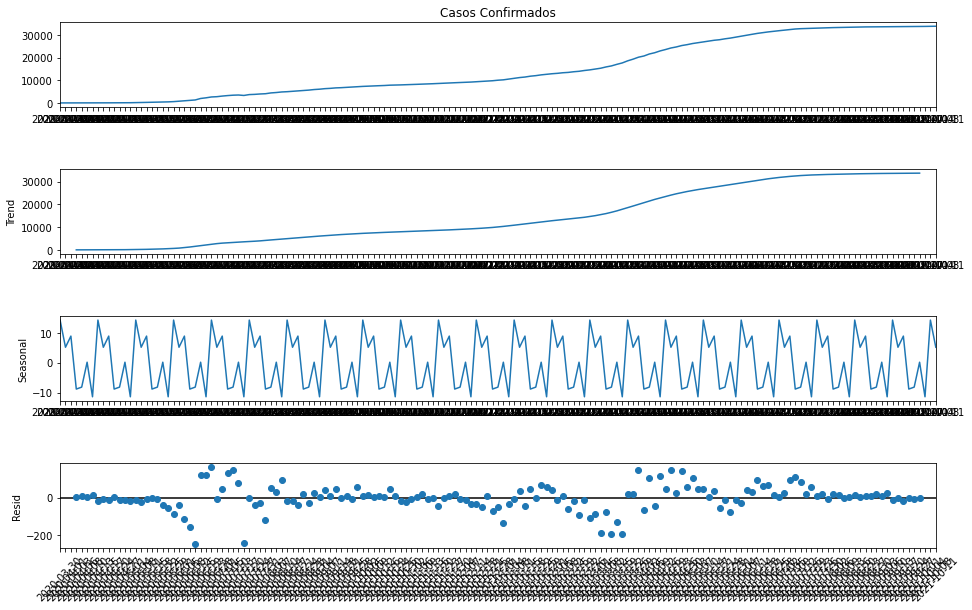

In [68]:
plt.figure(figsize=(12,9))

# Ejemplo de descomposición de serie de tiempo
descomposicion = sm.tsa.seasonal_decompose(df_st['Casos Confirmados'],
                                                  model='additive',freq=7)  
fig = descomposicion.plot()

plt.xticks(rotation=45)

fig.set_size_inches(16, 9)

### modelos arimas...

In [69]:
auto_ar = auto_arima(df_st['Casos Confirmados'], trace=True)
auto_ar

Performing stepwise search to minimize aic
 ARIMA(2,2,2)(0,0,0)[0]             : AIC=1885.714, Time=0.14 sec
 ARIMA(0,2,0)(0,0,0)[0]             : AIC=2003.334, Time=0.01 sec
 ARIMA(1,2,0)(0,0,0)[0]             : AIC=1889.245, Time=0.02 sec
 ARIMA(0,2,1)(0,0,0)[0]             : AIC=1935.896, Time=0.02 sec
 ARIMA(1,2,2)(0,0,0)[0]             : AIC=1883.720, Time=0.06 sec
 ARIMA(0,2,2)(0,0,0)[0]             : AIC=1910.924, Time=0.04 sec
 ARIMA(1,2,1)(0,0,0)[0]             : AIC=1884.268, Time=0.04 sec
 ARIMA(1,2,3)(0,0,0)[0]             : AIC=1885.698, Time=0.09 sec
 ARIMA(0,2,3)(0,0,0)[0]             : AIC=1912.048, Time=0.07 sec
 ARIMA(2,2,1)(0,0,0)[0]             : AIC=1884.325, Time=0.10 sec
 ARIMA(2,2,3)(0,0,0)[0]             : AIC=1886.127, Time=0.13 sec
 ARIMA(1,2,2)(0,0,0)[0] intercept   : AIC=1885.717, Time=0.09 sec

Best model:  ARIMA(1,2,2)(0,0,0)[0]          
Total fit time: 0.826 seconds


ARIMA(order=(1, 2, 2), scoring_args={}, suppress_warnings=True,
      with_intercept=False)

In [72]:
# Construct the model
mod2 = sm.tsa.SARIMAX(df_st['Casos Confirmados'], order=(2,2, 0), trend='c')
# Estimate the parameters
res2 = mod2.fit()

print(res2.summary())


                               SARIMAX Results                                
Dep. Variable:      Casos Confirmados   No. Observations:                  163
Model:               SARIMAX(2, 2, 0)   Log Likelihood                -940.765
Date:                Sat, 16 Oct 2021   AIC                           1889.530
Time:                        18:58:42   BIC                           1901.855
Sample:                             0   HQIC                          1894.534
                                - 163                                         
Covariance Type:                  opg                                         
                 coef    std err          z      P>|z|      [0.025      0.975]
------------------------------------------------------------------------------
intercept      0.3784      7.491      0.051      0.960     -14.303      15.060
ar.L1         -0.6056      0.045    -13.322      0.000      -0.695      -0.516
ar.L2          0.1501      0.042      3.613      0.0

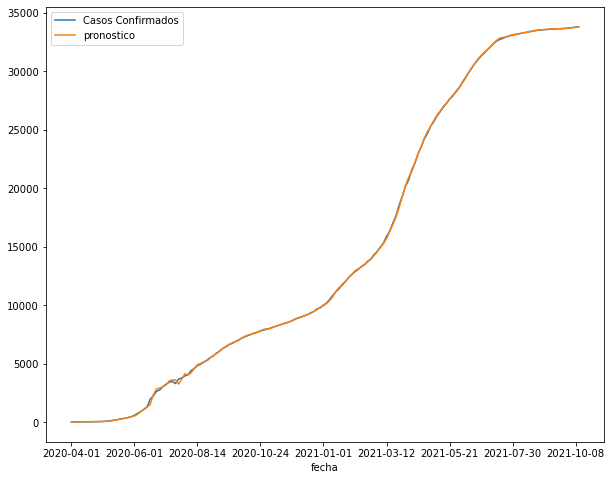

In [73]:
df_st['pronostico'] = res2.fittedvalues
plot = df_st[['Casos Confirmados', 'pronostico']][1:].plot(figsize=(10, 8)) 

In [74]:
fcast = res2.get_forecast(7).summary_frame()
fcast

Casos Confirmados,mean,mean_se,mean_ci_lower,mean_ci_upper
163,33864.191673,83.263716,33700.997788,34027.385559
164,33907.317690,142.875457,33627.286940,34187.348440
165,33953.457794,239.309618,33484.419562,34422.496025
166,33997.690970,334.859152,33341.379093,34654.002847
167,34043.909716,451.793673,33158.410390,34929.409043
168,34089.018282,572.162185,32967.601006,35210.435559
169,34135.475567,707.271928,32749.248060,35521.703073


In [81]:
residuos = (np.array(res2.resid))
residuos

array([ 1.57400026e+01,  1.63392435e+00, -1.33059502e+01, -3.69442248e+00,
        1.22061236e+01, -4.03998967e+00, -3.66799995e+00, -2.11667006e+00,
        1.89913947e+00,  5.24976237e+00,  8.22694521e-02, -7.67859713e+00,
        2.13826187e+01,  3.41691036e+00,  3.38469258e+01, -9.57124237e+00,
        1.31004462e+01,  1.21199237e+01, -1.00936259e+01,  1.20734398e+01,
        1.26930477e+01,  4.72880163e+01,  8.36487190e+01,  1.54074732e+01,
        1.63827010e+01,  3.90677100e+01,  4.52057540e+02, -9.54863332e+01,
       -2.07043982e+02, -1.46695418e+02, -1.49270414e+01,  7.43729850e+01,
       -1.06836578e+02, -1.08913161e+02, -3.22046922e+02,  4.23031785e+02,
        1.04968775e+02, -1.84076988e+02,  2.83255136e+01,  1.89125258e+02,
       -1.80983570e+01, -7.26512140e+01, -6.21403964e+01, -3.59467704e+01,
        5.03223158e+01,  3.38169842e+01, -3.99446546e+01,  5.49560876e+01,
       -2.04605251e+01,  1.03561614e+01, -4.16695444e+01, -8.51442719e+00,
       -5.21963174e+01, -

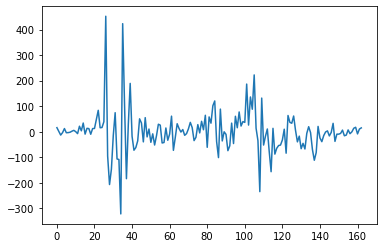

In [82]:
plt.plot(residuos)

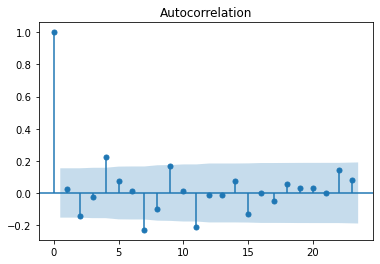

In [83]:
plot_acf(residuos)
pyplot.show()

## TEORIA SERIES TEMPORALES...


#### Univariate Time Series


     A univariate time series is a sequence of measurements of the same variable collected over time. Most often, the measurements are made at regular time intervals.

One difference from standard linear regression is that the data are not necessarily independent and not necessarily identically distributed. One defining characteristic of a time series is that it is a list of observations where the ordering matters. Ordering is very important because there is dependency and changing the order could change the meaning of the data.

## Basic Objectives of the Analysis

The basic objective usually is to determine a model that describes the pattern of the time series. Uses for such a model are:

    To describe the important features of the time series pattern.
    To explain how the past affects the future or how two time series can “interact”.
    To forecast future values of the series.
    To possibly serve as a control standard for a variable that measures the quality of product in some manufacturing situations.


### Types of Models

There are two basic types of “time domain” models.

    Models that relate the present value of a series to past values and past prediction errors - these are called ARIMA models (for Autoregressive Integrated Moving Average). We’ll spend substantial time on these.
    Ordinary regression models that use time indices as x-variables. These can be helpful for an initial description of the data and form the basis of several simple forecasting methods.


### Important Characteristics to Consider First

Some important questions to first consider when first looking at a time series are:

    Is there a trend, meaning that, on average, the measurements tend to increase (or decrease) over time?
    Is there seasonality, meaning that there is a regularly repeating pattern of highs and lows related to calendar time such as seasons, quarters, months, days of the week, and so on?
    Are there outliers? In regression, outliers are far away from your line. With time series data, your outliers are far away from your other data.
    Is there a long-run cycle or period unrelated to seasonality factors?
    Is there constant variance over time, or is the variance non-constant?
    Are there any abrupt changes to either the level of the series or the variance?


### EJEMPLOS...

The following plot is a time series plot of the annual number of earthquakes in the world with seismic magnitude over 7.0, for 99 consecutive years. By a time series plot, we simply mean that the variable is plotted against time.

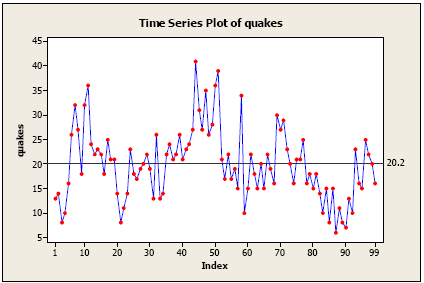

### Some features of the plot:

    There is no consistent trend (upward or downward) over the entire time span. The series appears to slowly wander up and down. The horizontal line drawn at quakes = 20.2 indicates the mean of the series. Notice that the series tends to stay on the same side of the mean (above or below) for a while and then wanders to the other side.
    Almost by definition, there is no seasonality as the data are annual data.
    There are no obvious outliers.
    It’s difficult to judge whether the variance is constant or not.


One of the simplest ARIMA type models is a model in which we use a linear model to predict the value at the present time using the value at the previous time. This is called an AR(1) model, standing for autoregressive model of order 1. The order of the model indicates how many previous times we use to predict the present time.

A start in evaluating whether an AR(1) might work is to plot values of the series against lag 1 values of the series. Let
denote the value of the series at any particular time , so  denotes the value of the series one time before time . That is,  is the lag 1 value of . As a short example, here are the first five values in the earthquake series along with their lag 1 values:

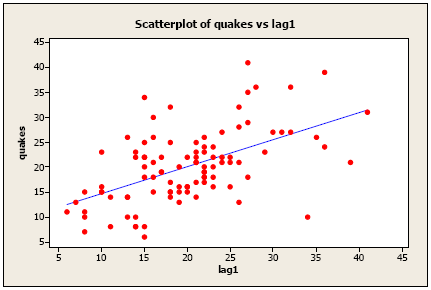

In [89]:
df_st['lag1'] = df_st['Casos Confirmados'].shift(1)
df_st

,Casos Confirmados,contagios_MA7,diff_lag1,diff_lag2,diff_lag3,diff_lag5,diff_lag10,diff_lag30,diff_lag60,diff_lag90,pronostico,lag1
fecha,,,,,,,,,,,,
2020-03-30,16.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,0.259997,NaN
2020-04-01,26.0,NaN,10.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,24.366076,16.0
2020-04-03,23.0,NaN,-3.0,7.0,NaN,NaN,NaN,NaN,NaN,NaN,36.305950,26.0
2020-04-06,26.0,NaN,3.0,0.0,10.0,NaN,NaN,NaN,NaN,NaN,29.694422,23.0
2020-04-08,36.0,NaN,10.0,13.0,10.0,NaN,NaN,NaN,NaN,NaN,23.793876,26.0
...,...,...,...,...,...,...,...,...,...,...,...,...
2021-09-27,33678.0,33633.142857,20.0,36.0,40.0,69.0,217.0,3420.0,19094.0,25283.0,33664.560128,33658.0
2021-10-01,33715.0,33651.000000,37.0,57.0,73.0,98.0,202.0,3051.0,18748.0,25230.0,33697.757217,33678.0
2021-10-04,33734.0,33668.857143,19.0,56.0,76.0,96.0,205.0,2753.0,18425.0,25162.0,33742.684154,33715.0


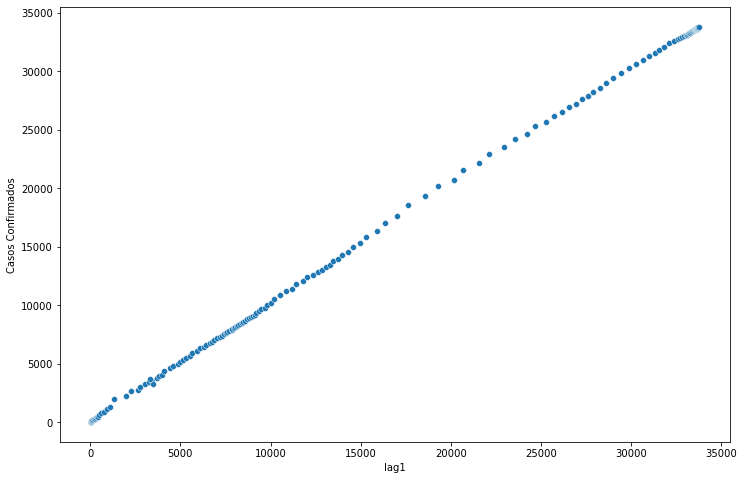

In [91]:
plt.figure(figsize=(12,8))

sns.scatterplot(x='lag1',y ='Casos Confirmados', data=df_st)

plt.show()

### Although it’s only a moderately strong relationship, there is a positive linear association so an AR(1) model might be a useful model.

This is essentially the ordinary simple linear regression equation, but there is one difference. Although it’s not usually true, in ordinary least squares regression we assume that the x-variable is not random but instead is something we can control. That’s not the case here, but in our first encounter with time series we’ll overlook that and use ordinary regression methods. We’ll do things the “right” way later in the course.

### Residual Analysis

In traditional regression, a plot of residuals versus fits is a useful diagnostic tool. The ideal for this plot is a horizontal band of points. Following is a plot of residuals versus predicted values for our estimated model. It doesn’t show any serious problems. There might be one possible outlier at a fitted value of about 28.

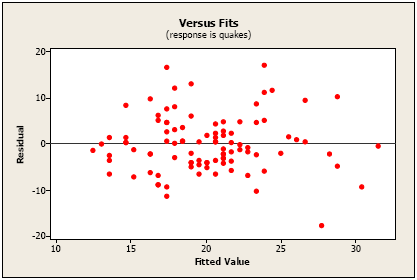

### Example 1-2 Section

The following plot shows a time series of quarterly production of beer in Australia for 18 years.

Some important features are:

    There is an upward trend, possibly a curved one.
    There is seasonality – a regularly repeating pattern of highs and lows related to quarters of the year.
    There are no obvious outliers.
    There might be increasing variation as we move across time, although that’s uncertain.


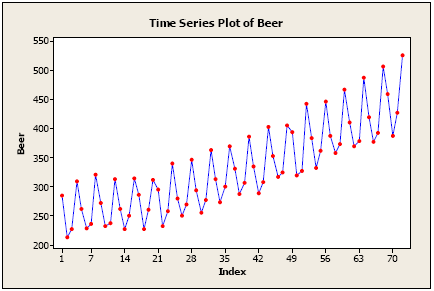

When data are gathered over time, we typically are concerned with whether a value at the present time can be predicted from values at past times. We saw this in the earthquake data of example 1 when we used an AR(1) structure to model the data. For residuals, however, the desirable result is that the correlation is 0 between residuals separated by any given time span. In other words, residuals should be unrelated to each other.

## Sample Autocorrelation Function (ACF) 

The ACF can be used to identify the possible structure of time series data. That can be tricky going as there often isn’t a single clear-cut interpretation of a sample autocorrelation function. We’ll get started on that in Lesson 1.2 this week. The ACF of the residuals for a model is also useful. The ideal for a sample ACF of residuals is that there aren’t any significant correlations for any lag.

Following is the ACF of the residuals for Example 1, the earthquake example, where we used an AR(1) model. The "lag" (time span between observations) is shown along the horizontal, and the autocorrelation is on the vertical. The red lines indicated bounds for statistical significance. This is a good ACF for residuals. Nothing is significant; that’s what we want for residuals.

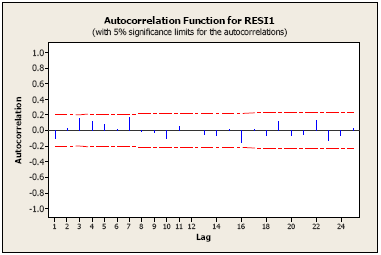

In [92]:
def fun(f,x):
    
    auto = f**x
    
    return auto

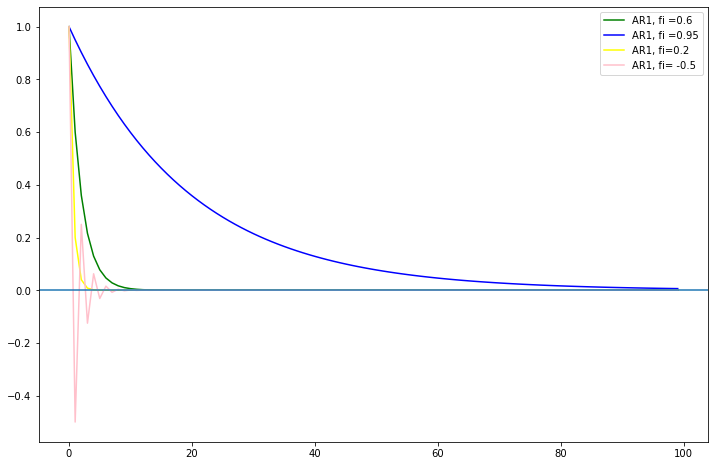

In [99]:
r = [fun(0.6,i)  for i in range(100)]
r2 = [fun(0.95,i)  for i in range(100)]
r3 = [fun(0.2,i)  for i in range(100)]
r4 = [fun(-0.5,i)  for i in range(100)]

plt.figure(figsize=(12,8))

plt.plot(range(len(r)),r, color='green',label='AR1, fi =0.6')
plt.plot(range(len(r)),r2, color='blue',label='AR1, fi =0.95')
plt.plot(range(len(r)),r3, color='yellow',label='AR1, fi=0.2')
plt.plot(range(len(r)),r4, color='pink',label='AR1, fi= -0.5')
plt.axhline(0)
plt.legend()
plt.show()

Pattern of ACF for AR(1) Model

The ACF property defines a distinct pattern for the autocorrelations. For a positive value of
, the ACF exponentially decreases to 0 as the lag  increases. For negative

, the ACF also exponentially decays to 0 as the lag increases, but the algebraic signs for the autocorrelations alternate between positive and negative.

Following is the ACF of an AR(1) with
= 0.6, for the first 12 lags.

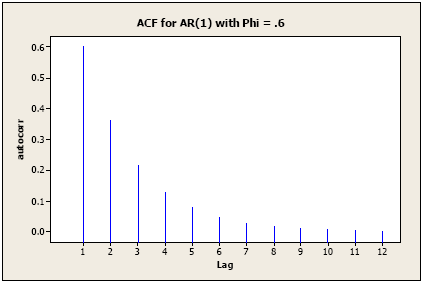

The ACF of an AR(1) with = −0.7 follows.

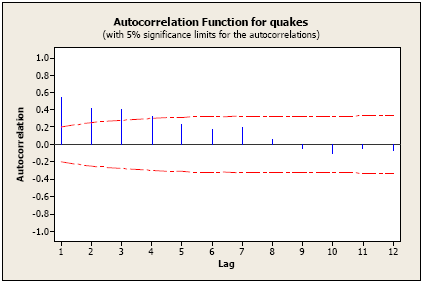

### Example 1-3

In Example 1 of Lesson 1.1, we used an AR(1) model for annual earthquakes in the world with seismic magnitude greater than 7. Here’s the sample ACF of the series:

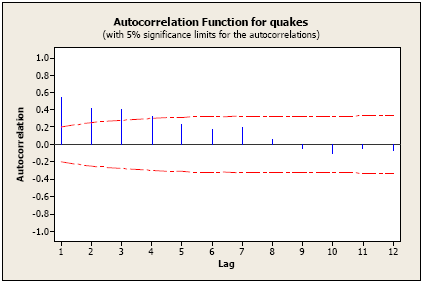

### Example 1-4 Section

Here’s a time series of the daily cardiovascular mortality rate in Los Angeles County, 1970-1979

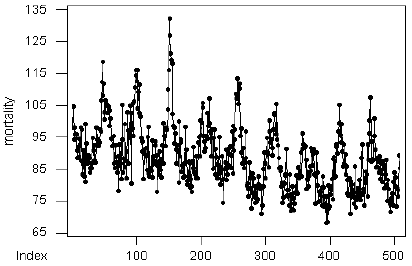

There is a slight downward trend, so the series may not be stationary. To create a (possibly) stationary series, we’ll examine the first differences . This is a common time series method for creating a de-trended series and thus potentially a stationary series. Think about a straight line – there are constant differences in average for each change of 1-unit in

.

The time series plot of the first differences is the following:

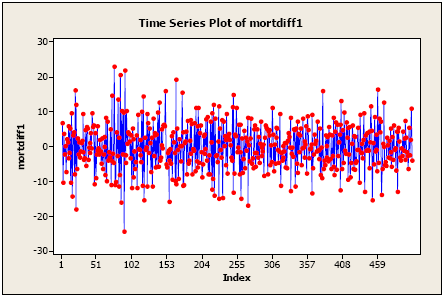

The following plot is the sample estimate of the autocorrelation function of 1st differences:

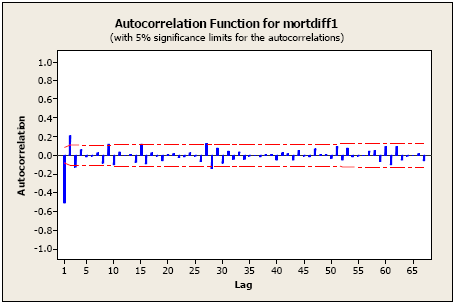

This looks like the pattern of an AR(1) with a negative lag 1 autocorrelation.

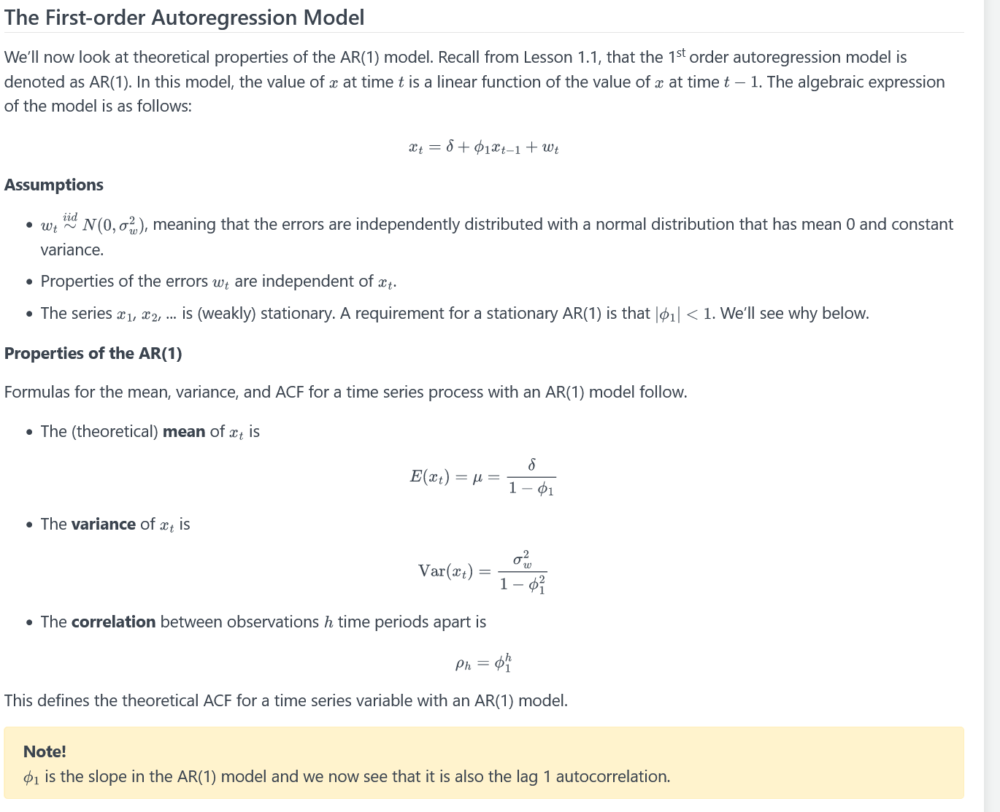

## Lesson 2: MA Models, Partial Autocorrelation, Notational Conventions


### Objectives

After successfully completing this lesson, you should be able to:

    Identify and interpret an MA(q) model
    Distinguish MA terms from an ACF
    Interpret a PACF
    Distinguish AR terms and MA terms from simultaneously exploring an ACF and PACF
    Recognize and write AR, MA, and ARMA polynomials



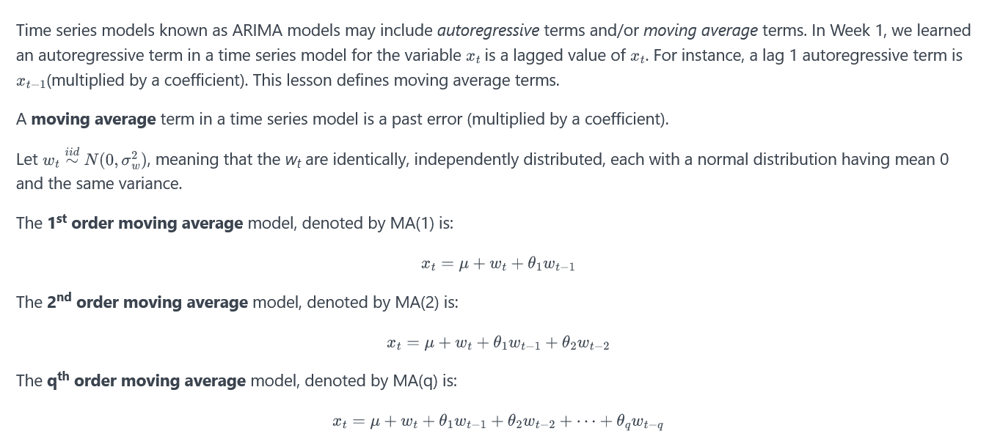

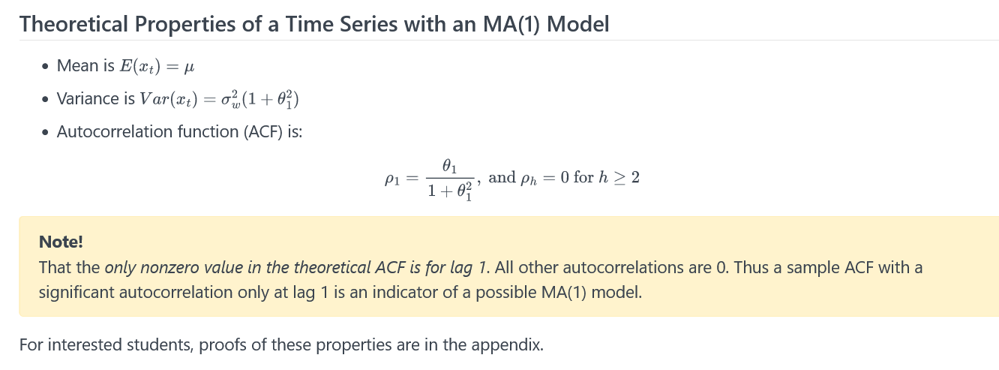

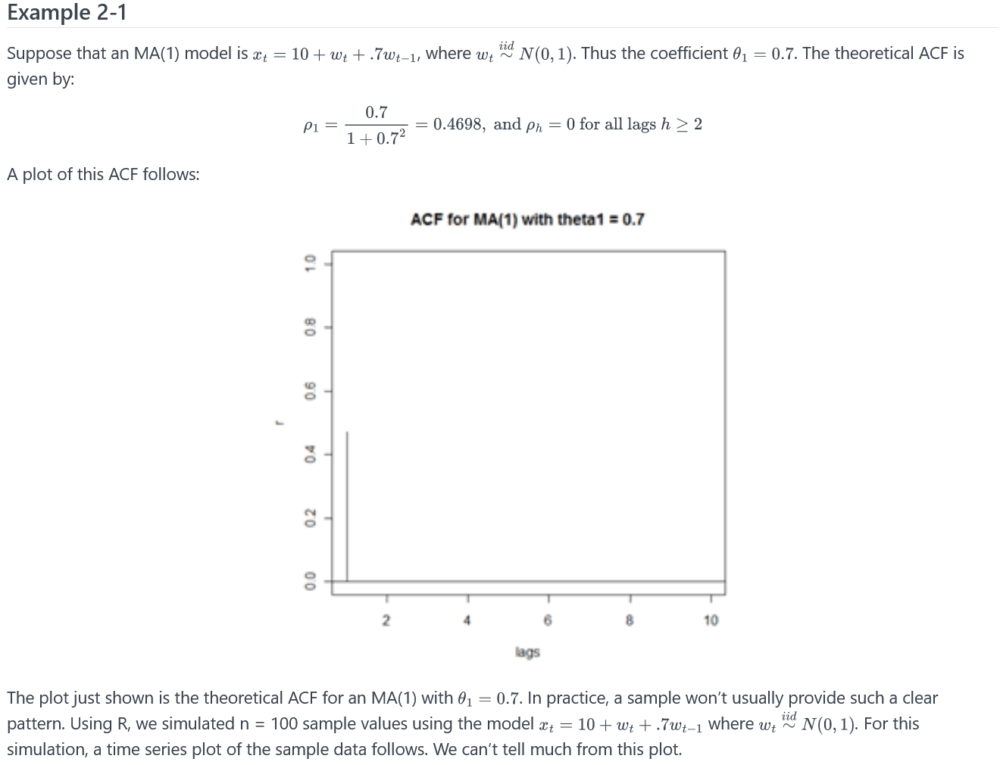

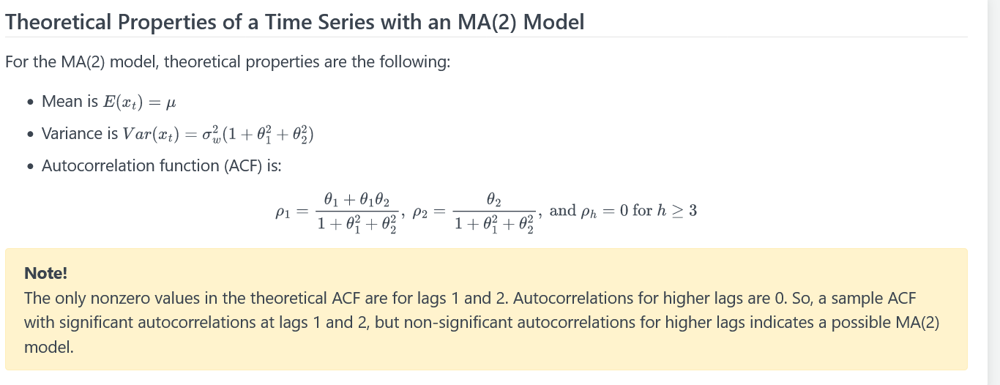

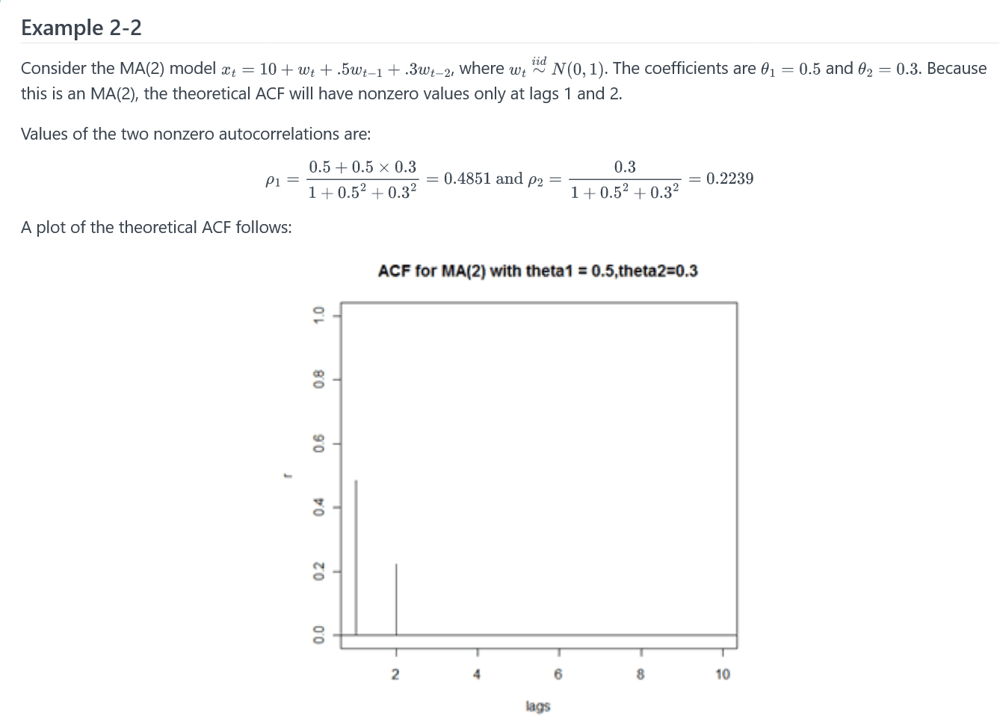

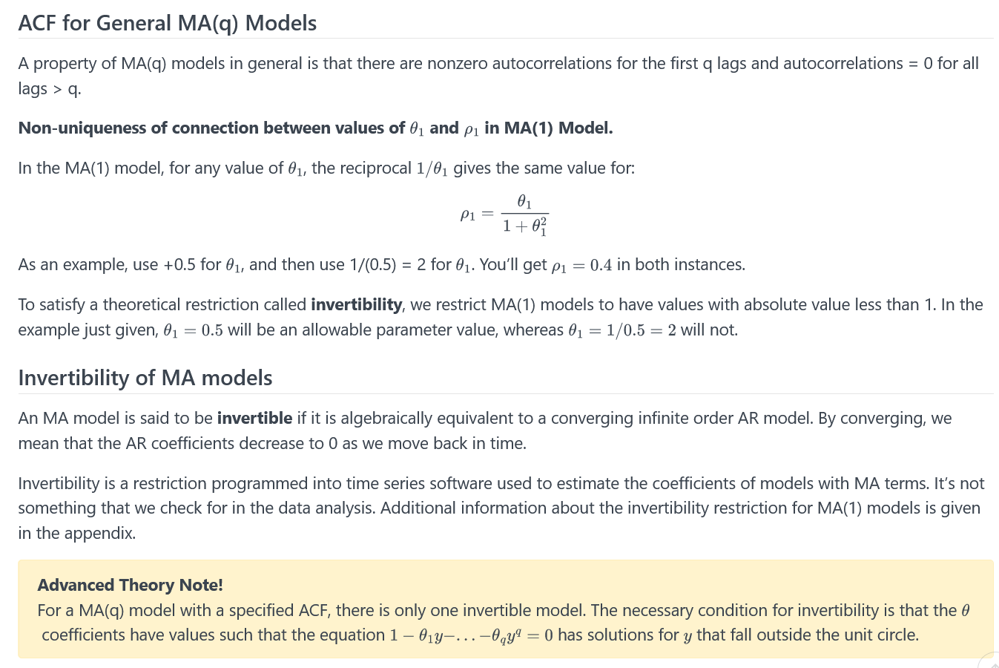

### SIMULACION DE MODELOS...

### MODELO MA(1)

In [122]:
np.random.seed(1)
x = np.random.normal(0,1,1000)

df_ma = pd.DataFrame(x,columns=['xt1'])
df_ma['xt-1'] = df_ma['xt1'].shift(1)
df_ma['ma1'] = 10 - 1*df_ma['xt1']- 0.75*df_ma['xt-1']
df_ma.dropna(inplace=True)
df_ma

,xt1,xt-1,ma1
1,-0.611756,1.624345,9.393497
2,-0.528172,-0.611756,10.986989
3,-1.072969,-0.528172,11.469097
4,0.865408,-1.072969,9.939319
5,-2.301539,0.865408,11.652483
...,...,...,...
995,-0.116444,1.291189,9.148052
996,-2.277298,-0.116444,12.364631
997,-0.069625,-2.277298,11.777598
998,0.353870,-0.069625,9.698348


<AxesSubplot:>

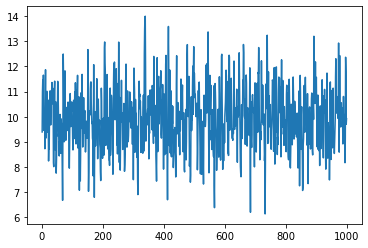

In [123]:
df_ma['ma1'].plot()

In [124]:
X = df_ma['ma1'][1:].values
result = adfuller(X,autolag='AIC')
print('ADF Statistic: %f' % result[0])
print('p-value: %f' % result[1])
print('Critical Values:')
for key, value in result[4].items():
	print('\t%s: %.3f' % (key, value))

ADF Statistic: -12.592001
p-value: 0.000000
Critical Values:
	1%: -3.437
	5%: -2.864
	10%: -2.568


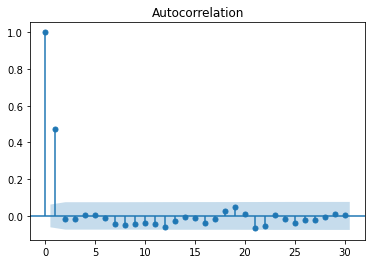

In [127]:
plot_acf(df_ma['ma1'])
pyplot.show()

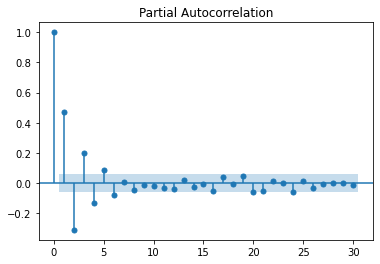

In [128]:
plot_pacf(df_ma['ma1'])
pyplot.show()

## 2.2 Partial Autocorrelation Function (PACF)

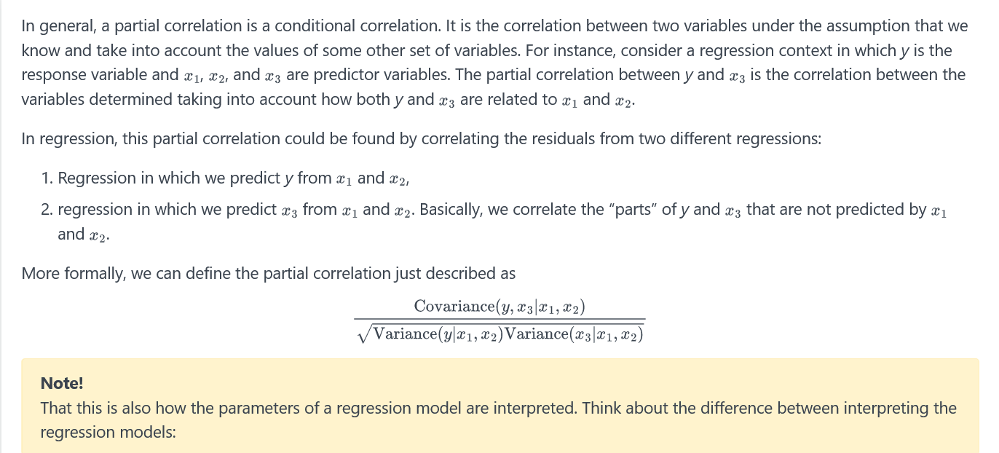

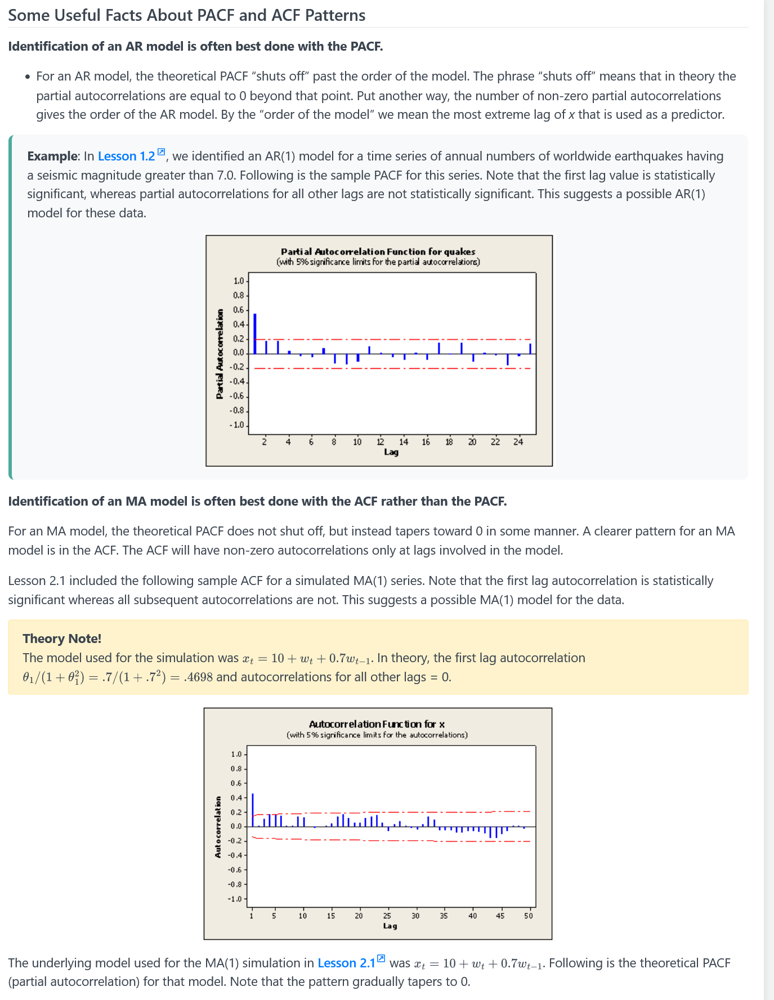

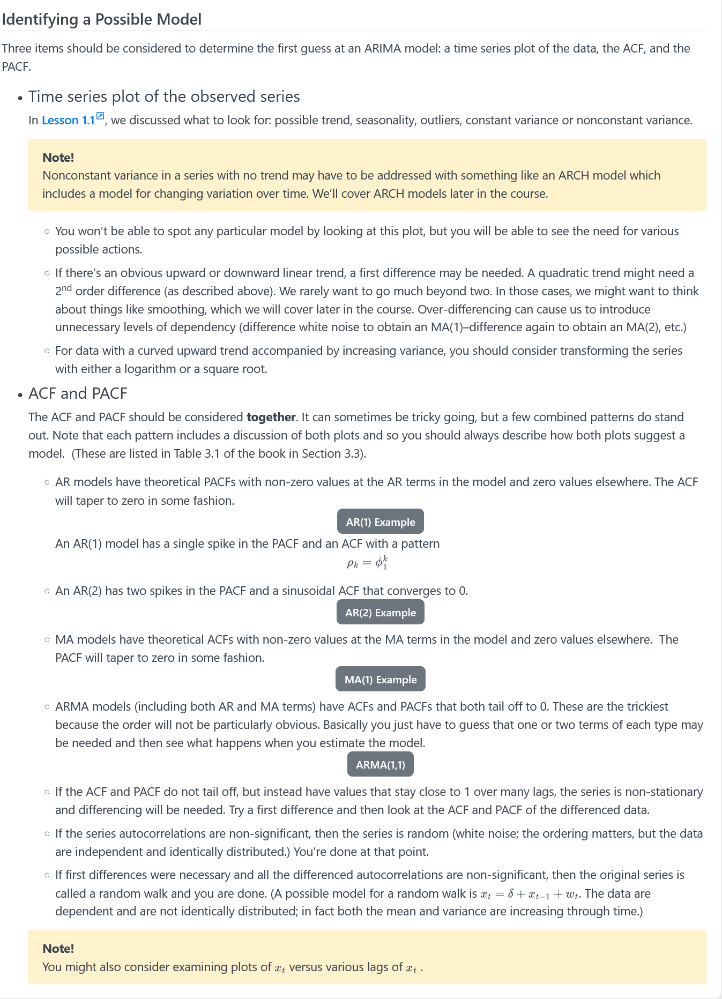

### ACF Y PACF MODELO AR1

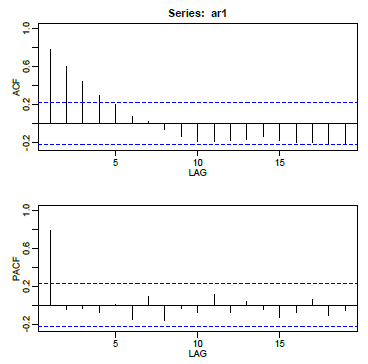

### ACF Y PACF MODELO AR2

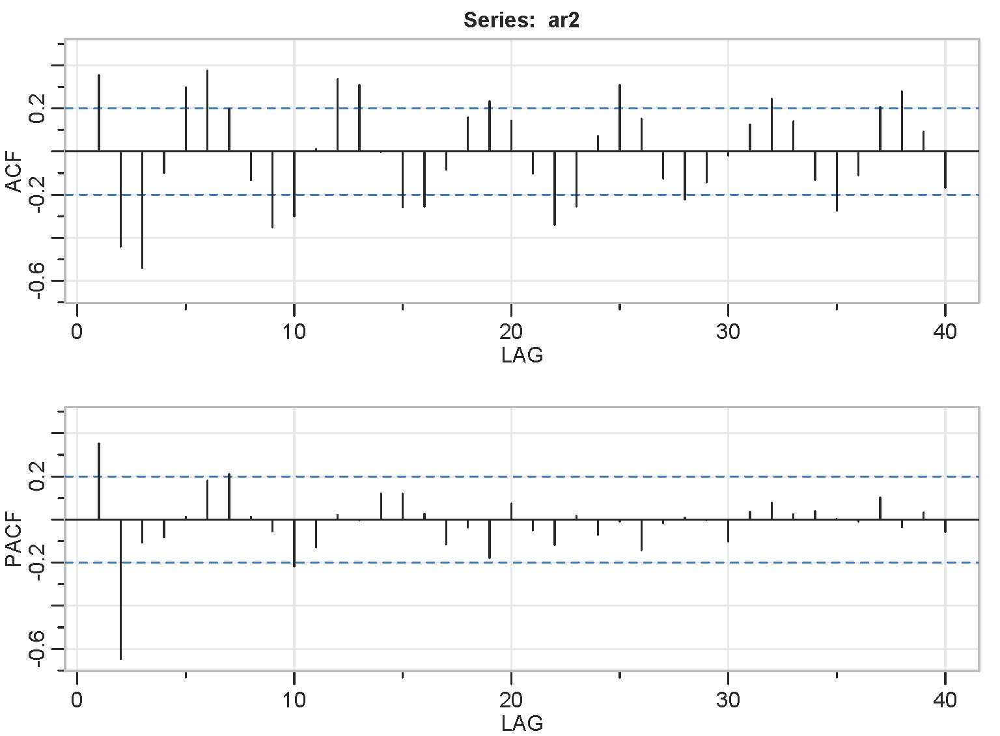

### ACF Y PACF MODELO MA1

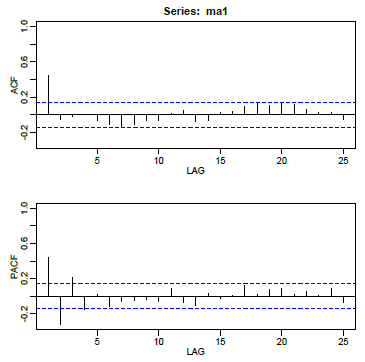

### ACF Y PACF MODELO ARMA11

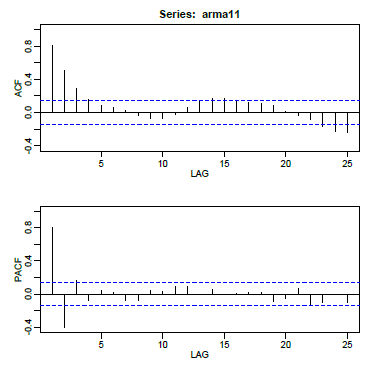

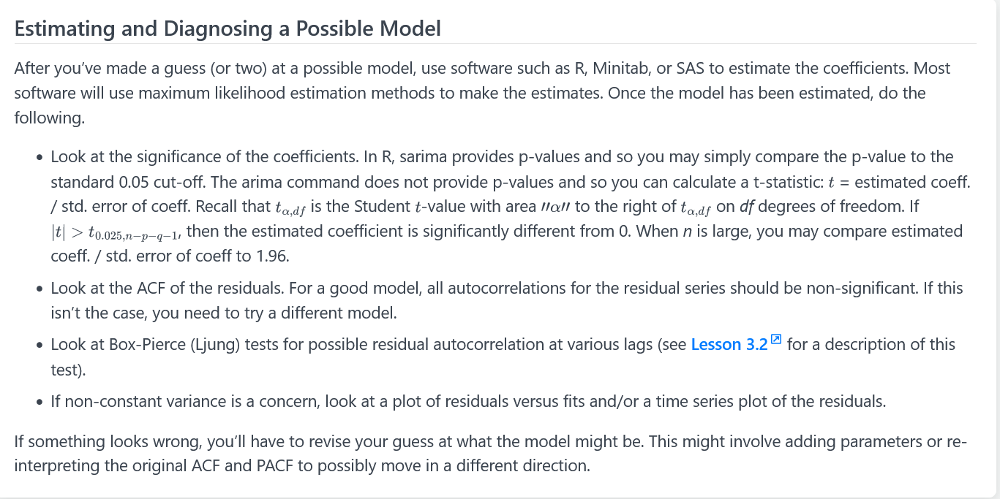

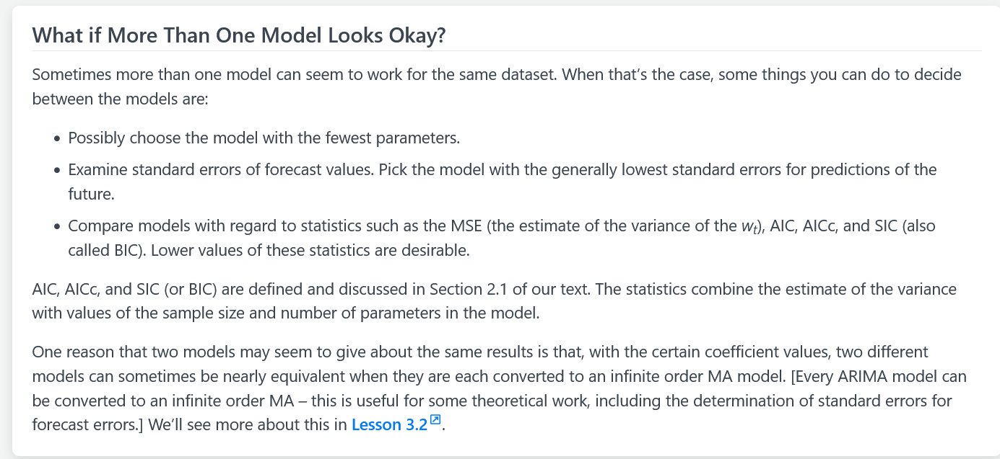

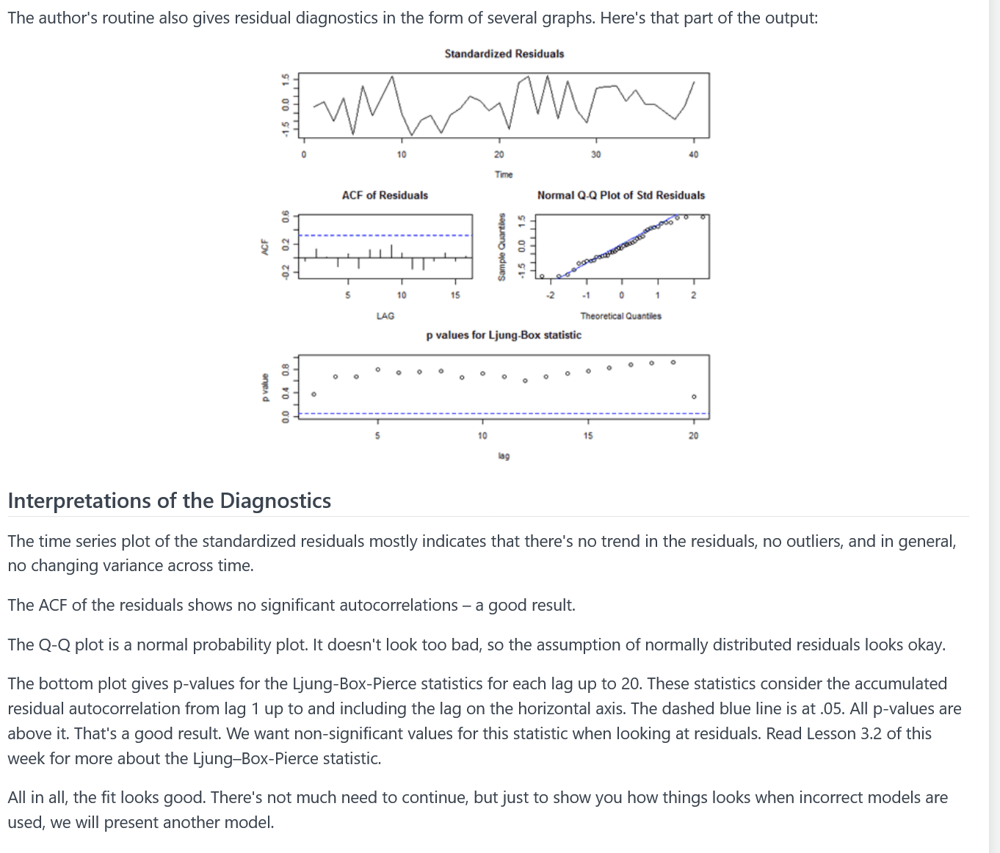

### EJERCICIOS...

In [3]:
df=pd.read_csv('daily-website-visitors.csv',sep=',')

df.rename(columns = {'Day.Of.Week':'day_of_week'
                    ,'Page.Loads':'page_loads'
                    ,'Unique.Visits':'unique_visits'
                    ,'First.Time.Visits':'first_visits'
                    ,'Returning.Visits':'returning_visits'}, inplace = True)

df=df.replace(',','',regex=True)

df['page_loads']=df['page_loads'].astype(int)
df['unique_visits']=df['unique_visits'].astype(int)
df['first_visits']=df['first_visits'].astype(int)
df['returning_visits']=df['returning_visits'].astype(int)

df['Date'] = pd.to_datetime(df['Date'])
df.set_index('Date',inplace=True)
df

FileNotFoundError: [Errno 2] No such file or directory: 'daily-website-visitors.csv'

In [4]:
df = df[['page_loads']]
df

,page_loads
Date,
2014-09-14,2146
2014-09-15,3621
2014-09-16,3698
2014-09-17,3667
2014-09-18,3316
...,...
2020-08-15,2221
2020-08-16,2724
2020-08-17,3456


In [5]:
df.isnull().sum()

page_loads    0
dtype: int64

<AxesSubplot:xlabel='Date'>

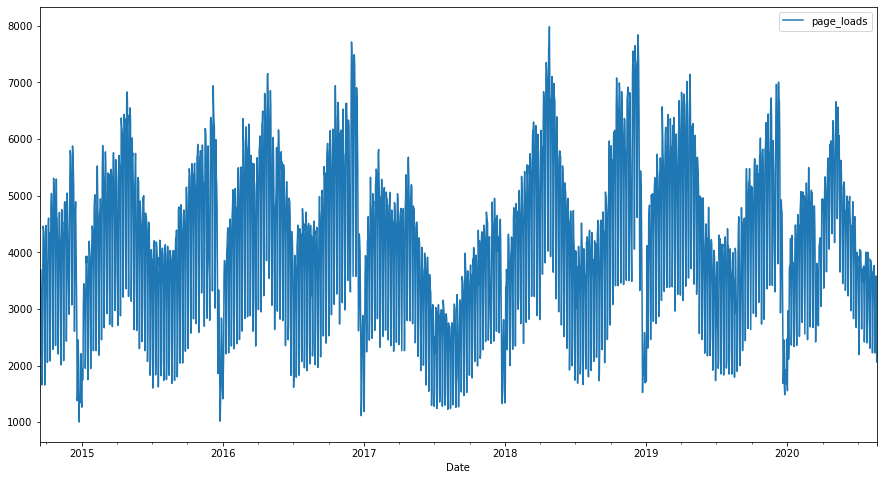

In [6]:
fif, ax = plt.subplots(1 , figsize=(15,8))
df.plot(ax=ax)

In [7]:
px.line(df,x=df.index,y=['page_loads'],
       labels={'value':'Visits'}
       ,title='Page Loads & visitors over Time')

In [8]:
### es estacionaria la serie?

In [9]:
## serie estacionaria diferenciada.... sera estacionaria la diferenciada?

X2 = df['page_loads'].values
result2 = adfuller(X2,autolag='AIC')
print('ADF Statistic: %f' % result2[0])
print('p-value: %f' % result2[1])
print('Critical Values:')
for key, value in result2[4].items():
	print('\t%s: %.3f' % (key, value))

ADF Statistic: -4.283821
p-value: 0.000474
Critical Values:
	1%: -3.433
	5%: -2.863
	10%: -2.567


In [10]:
ndiffs(df['page_loads'], test='adf')

0

<Figure size 864x648 with 0 Axes>

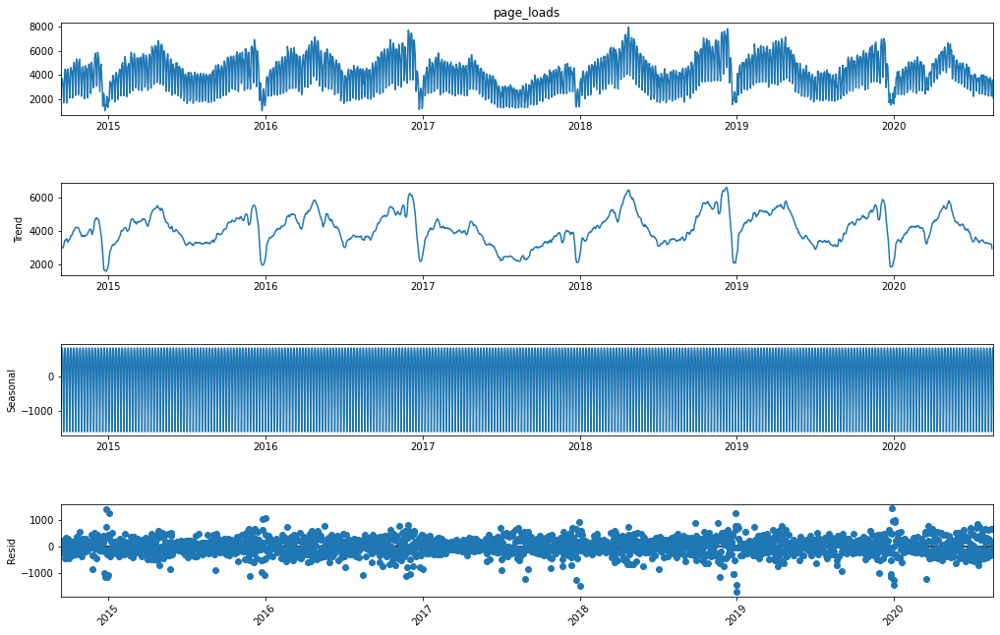

In [11]:
plt.figure(figsize=(12,9))

# Ejemplo de descomposición de serie de tiempo
descomposicion = sm.tsa.seasonal_decompose(df['page_loads'],
                                                  model='additive',freq=7)  
fig = descomposicion.plot()

plt.xticks(rotation=45)

fig.set_size_inches(16, 10)

### Graficando acf y pacf..

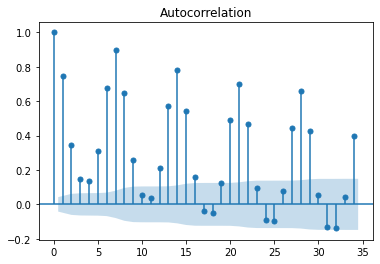

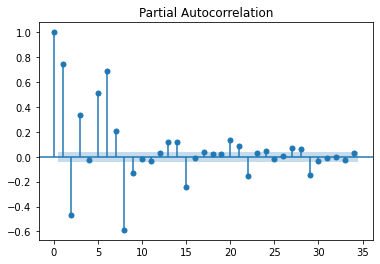

In [12]:
plot_acf(df['page_loads'])
plot_pacf(df['page_loads'])
pyplot.show()

In [14]:
auto_mod = auto_arima(df['page_loads'], trace=True)
auto_mod

Performing stepwise search to minimize aic
 ARIMA(2,0,2)(0,0,0)[0] intercept   : AIC=34769.691, Time=1.85 sec
 ARIMA(0,0,0)(0,0,0)[0] intercept   : AIC=37394.682, Time=0.03 sec
 ARIMA(1,0,0)(0,0,0)[0] intercept   : AIC=35636.779, Time=0.08 sec
 ARIMA(0,0,1)(0,0,0)[0] intercept   : AIC=35427.113, Time=0.52 sec
 ARIMA(0,0,0)(0,0,0)[0]             : AIC=42444.548, Time=0.02 sec
 ARIMA(1,0,2)(0,0,0)[0] intercept   : AIC=34962.902, Time=0.75 sec
 ARIMA(2,0,1)(0,0,0)[0] intercept   : AIC=34797.678, Time=1.39 sec
 ARIMA(3,0,2)(0,0,0)[0] intercept   : AIC=34816.720, Time=1.44 sec
 ARIMA(2,0,3)(0,0,0)[0] intercept   : AIC=35303.433, Time=1.50 sec
 ARIMA(1,0,1)(0,0,0)[0] intercept   : AIC=34871.882, Time=0.22 sec
 ARIMA(1,0,3)(0,0,0)[0] intercept   : AIC=34706.136, Time=1.13 sec
 ARIMA(0,0,3)(0,0,0)[0] intercept   : AIC=34739.905, Time=1.16 sec
 ARIMA(1,0,4)(0,0,0)[0] intercept   : AIC=34710.218, Time=1.39 sec
 ARIMA(0,0,2)(0,0,0)[0] intercept   : AIC=34766.028, Time=0.77 sec
 ARIMA(0,0,4)(0,0,0

ARIMA(order=(1, 0, 5), scoring_args={}, suppress_warnings=True,
      with_intercept=False)

In [15]:
# Construct the model
mod2 = sm.tsa.SARIMAX(df['page_loads'], order=(1,0, 5), trend='c')
# Estimate the parameters
res2 = mod2.fit()

print(res2.summary())

                               SARIMAX Results                                
Dep. Variable:             page_loads   No. Observations:                 2167
Model:               SARIMAX(1, 0, 5)   Log Likelihood              -17044.689
Date:                Sun, 17 Oct 2021   AIC                          34105.378
Time:                        18:54:19   BIC                          34150.827
Sample:                    09-14-2014   HQIC                         34121.998
                         - 08-19-2020                                         
Covariance Type:                  opg                                         
                 coef    std err          z      P>|z|      [0.025      0.975]
------------------------------------------------------------------------------
intercept   1015.9974     78.629     12.921      0.000     861.887    1170.108
ar.L1          0.7585      0.018     41.505      0.000       0.723       0.794
ma.L1          0.3216      0.021     15.669      0.0

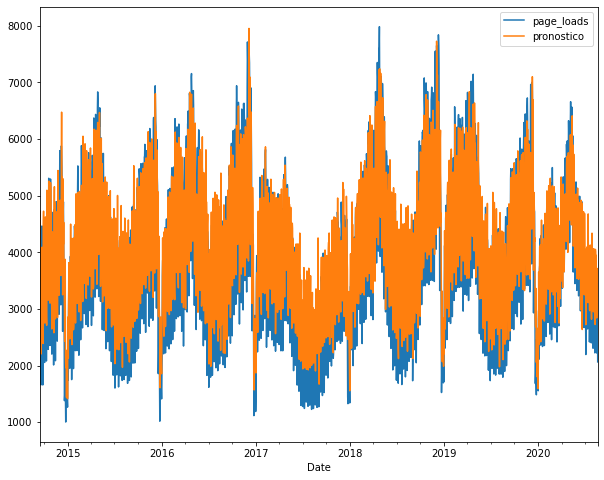

In [16]:
df['pronostico'] = res2.fittedvalues
plot = df[['page_loads', 'pronostico']][1:].plot(figsize=(10, 8)) 

In [17]:
from sklearn.metrics import r2_score
pred = df['pronostico']
real = df['page_loads']
rmse = (np.sqrt(mean_squared_error(real, pred)))
r2 = r2_score(real, pred)

print('Testing performance')
print('RMSE: {:.2f}'.format(rmse))
print('R2: {:.2f}'.format(r2))

Testing performance
RMSE: 631.48
R2: 0.78


In [18]:
fcast = res2.get_forecast(30).summary_frame()
fcast

page_loads,mean,mean_se,mean_ci_lower,mean_ci_upper
2020-08-20,1863.263212,629.546600,629.374551,3097.151874
2020-08-21,3210.483331,926.664466,1394.254351,5026.712311
2020-08-22,4056.038430,930.541897,2232.209826,5879.867034
2020-08-23,3468.317954,975.253535,1556.856150,5379.779758
2020-08-24,2769.722729,975.923811,856.947207,4682.498250
2020-08-25,3116.792618,1062.180668,1034.956764,5198.628472
2020-08-26,3380.040182,1108.767739,1206.895345,5553.185018
2020-08-27,3579.709706,1134.702925,1355.732839,5803.686573
2020-08-28,3731.156195,1149.358298,1478.455325,5983.857064
2020-08-29,3846.026197,1157.705480,1576.965152,6115.087242


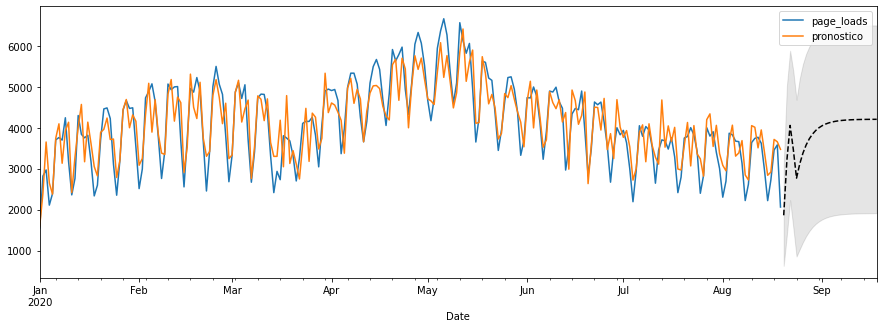

In [19]:
fig, ax = plt.subplots(figsize=(15, 5))

# Plot the data (here we are subsetting it to get a better look at the forecasts)
df.loc['2020-01-01':].plot(ax=ax)
fcast['mean'].plot(ax=ax, style='k--')
ax.fill_between(fcast.index, fcast['mean_ci_lower'], fcast['mean_ci_upper'], color='k', alpha=0.1);

In [20]:
df

,page_loads,pronostico
Date,,
2014-09-14,2146,4206.780305
2014-09-15,3621,3030.991835
2014-09-16,3698,4733.529968
2014-09-17,3667,3083.496857
2014-09-18,3316,3762.359003
...,...,...
2020-08-15,2221,2839.029264
2020-08-16,2724,2917.769581
2020-08-17,3456,3714.705381


In [21]:
residuals = real-pred
residuals

Date
2014-09-14   -2060.780305
2014-09-15     590.008165
2014-09-16   -1035.529968
2014-09-17     583.503143
2014-09-18    -446.359003
                 ...     
2020-08-15    -618.029264
2020-08-16    -193.769581
2020-08-17    -258.705381
2020-08-18     -76.628947
2020-08-19   -1408.878645
Length: 2167, dtype: float64

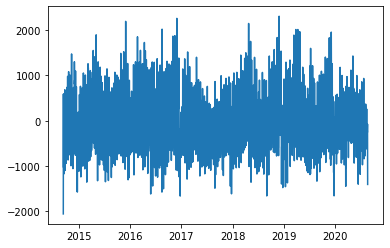

In [22]:
plt.plot(residuals)

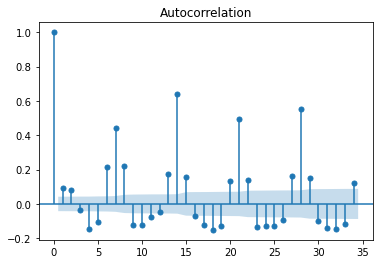

In [23]:
plot_acf(residuals)
pyplot.show()

In [24]:
df['residuals'] = residuals
df

,page_loads,pronostico,residuals
Date,,,
2014-09-14,2146,4206.780305,-2060.780305
2014-09-15,3621,3030.991835,590.008165
2014-09-16,3698,4733.529968,-1035.529968
2014-09-17,3667,3083.496857,583.503143
2014-09-18,3316,3762.359003,-446.359003
...,...,...,...
2020-08-15,2221,2839.029264,-618.029264
2020-08-16,2724,2917.769581,-193.769581
2020-08-17,3456,3714.705381,-258.705381


<AxesSubplot:xlabel='pronostico', ylabel='residuals'>

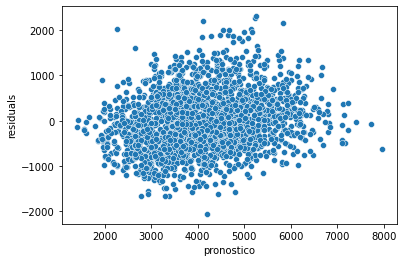

In [25]:
sns.scatterplot(x='pronostico',y='residuals', data=df)

## MODELO SARIMA...

In [26]:
# Construct the model
mod3 = sm.tsa.SARIMAX(df['page_loads'], order=(1,0, 0), seasonal_order=(1, 1, 1, 7), trend=None)
# Estimate the parameters
res3 = mod3.fit()

print(res3.summary())

                                      SARIMAX Results                                      
Dep. Variable:                          page_loads   No. Observations:                 2167
Model:             SARIMAX(1, 0, 0)x(1, 1, [1], 7)   Log Likelihood              -15608.763
Date:                             Sun, 17 Oct 2021   AIC                          31225.527
Time:                                     18:54:21   BIC                          31248.238
Sample:                                 09-14-2014   HQIC                         31233.833
                                      - 08-19-2020                                         
Covariance Type:                               opg                                         
                 coef    std err          z      P>|z|      [0.025      0.975]
------------------------------------------------------------------------------
ar.L1          0.8966      0.007    128.298      0.000       0.883       0.910
ar.S.L7        0.3191      

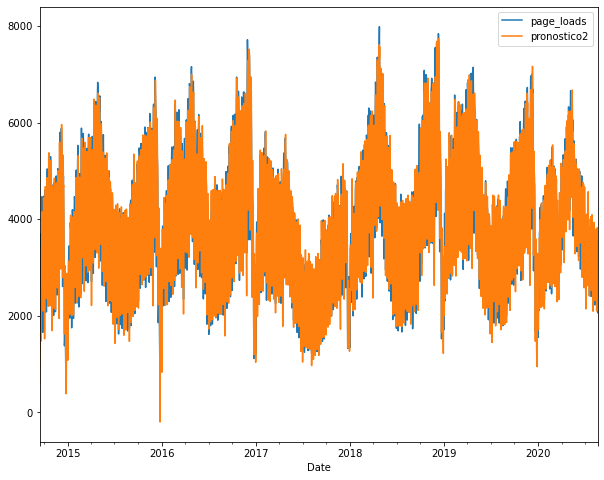

In [27]:
df['pronostico2'] = res3.fittedvalues
plot = df[['page_loads', 'pronostico2']][1:].plot(figsize=(10, 8)) 

In [28]:
from sklearn.metrics import r2_score
pred2 = df['pronostico2']
real = df['page_loads']
rmse = (np.sqrt(mean_squared_error(real, pred2)))
r2 = r2_score(real, pred2)

print('Testing performance')
print('RMSE: {:.2f}'.format(rmse))
print('R2: {:.2f}'.format(r2))

Testing performance
RMSE: 352.05
R2: 0.93


In [265]:
fcast2 = res3.get_forecast(15).summary_frame()
fcast2

NameError: name 'res3' is not defined

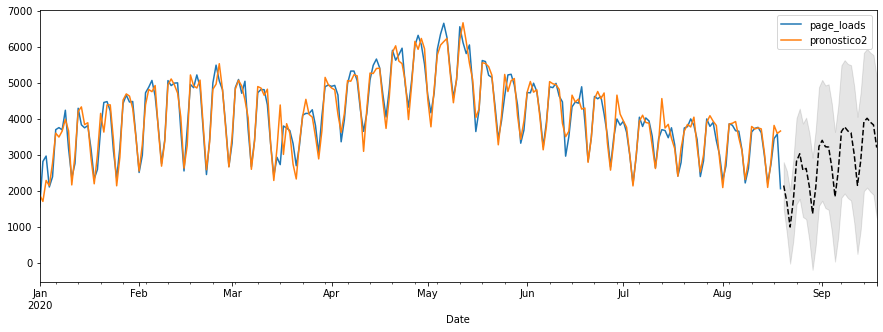

In [30]:
fig, ax = plt.subplots(figsize=(15, 5))

# Plot the data (here we are subsetting it to get a better look at the forecasts)
df.loc['2020-01-01':,['page_loads','pronostico2']].plot(ax=ax)
fcast2['mean'].plot(ax=ax, style='k--')
ax.fill_between(fcast2.index, fcast2['mean_ci_lower'], fcast2['mean_ci_upper'], color='k', alpha=0.1);

In [31]:
resi2 = real-pred2
resi2

Date
2014-09-14    2146.000000
2014-09-15    3023.624027
2014-09-16    2507.305724
2014-09-17    2160.098470
2014-09-18    1657.817172
                 ...     
2020-08-15     122.217569
2020-08-16     -82.664336
2020-08-17    -364.780743
2020-08-18     -17.237609
2020-08-19   -1602.118273
Length: 2167, dtype: float64

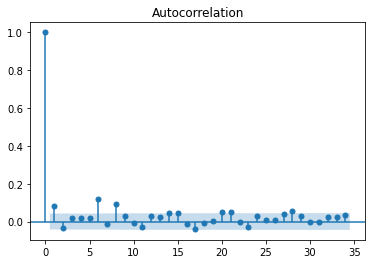

In [32]:
plot_acf(resi2)
pyplot.show()

In [33]:
df['residuals2']=resi2

<AxesSubplot:xlabel='pronostico', ylabel='residuals2'>

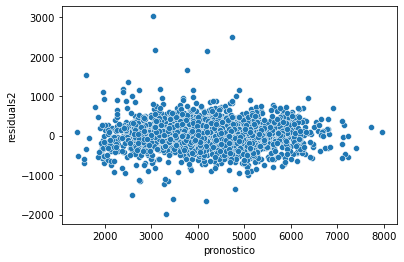

In [34]:
sns.scatterplot(x='pronostico',y='residuals2', data=df)

https://online.stat.psu.edu/stat510/lesson/6/6.1

http://bebi103.caltech.edu.s3-website-us-east-1.amazonaws.com/2015/tutorials/t7a_time_series.html

##  Seasonal ARIMA models resumen

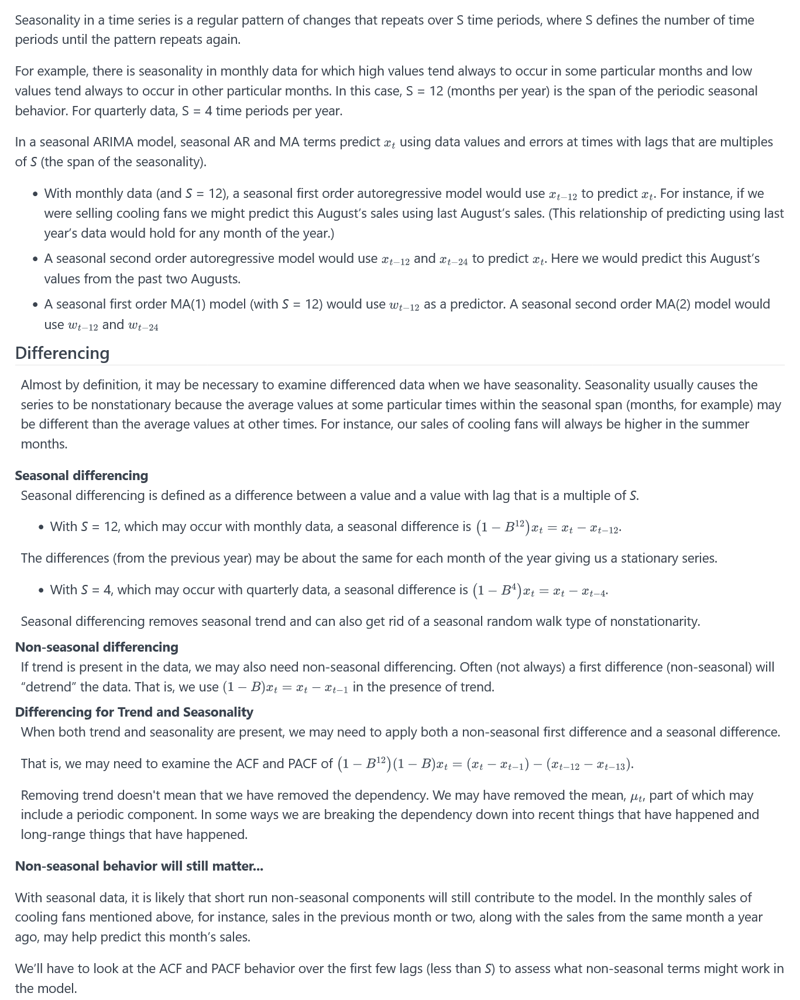

### The Periodogram

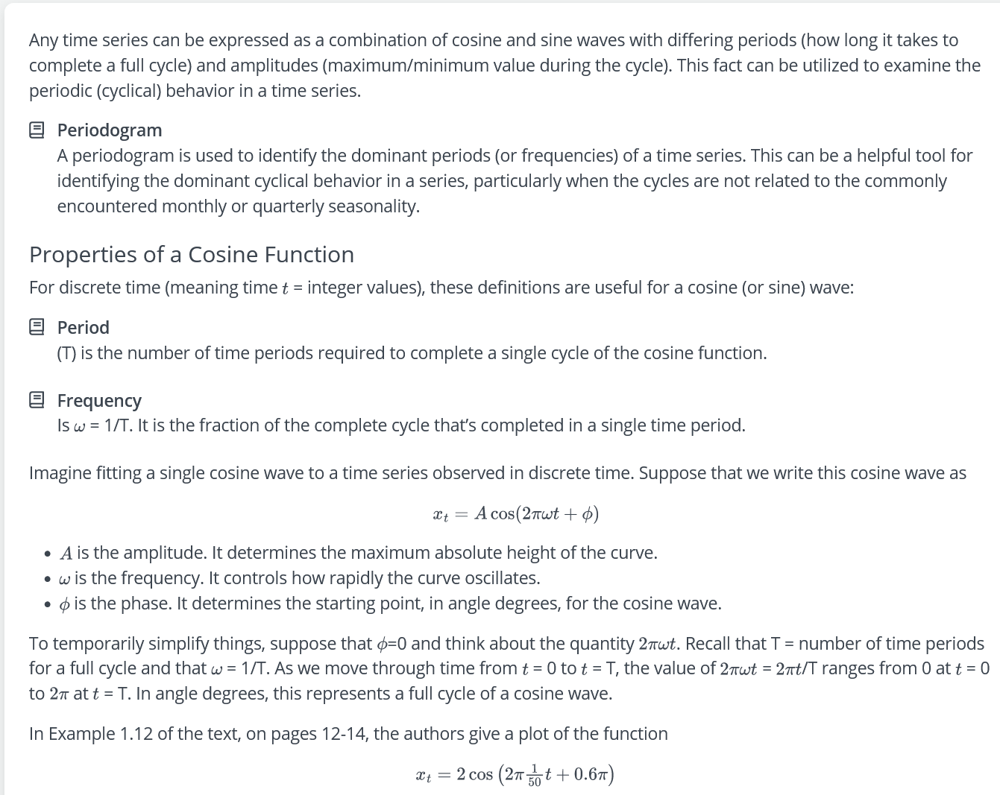

In [5]:
def fun_coseno(t,T,alfa):
    
    xt = 2*np.cos(2*np.pi*(1/T)*t + alfa*np.pi)
    
    return xt

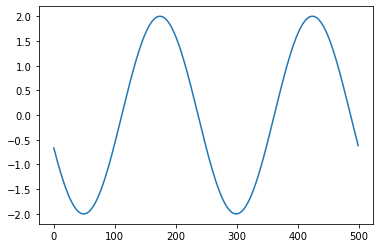

In [25]:
T=250

alfa= 0.6

y = [fun_coseno(t,T,alfa) for t in range(1,501)]

plt.plot(range(len(y)), y)

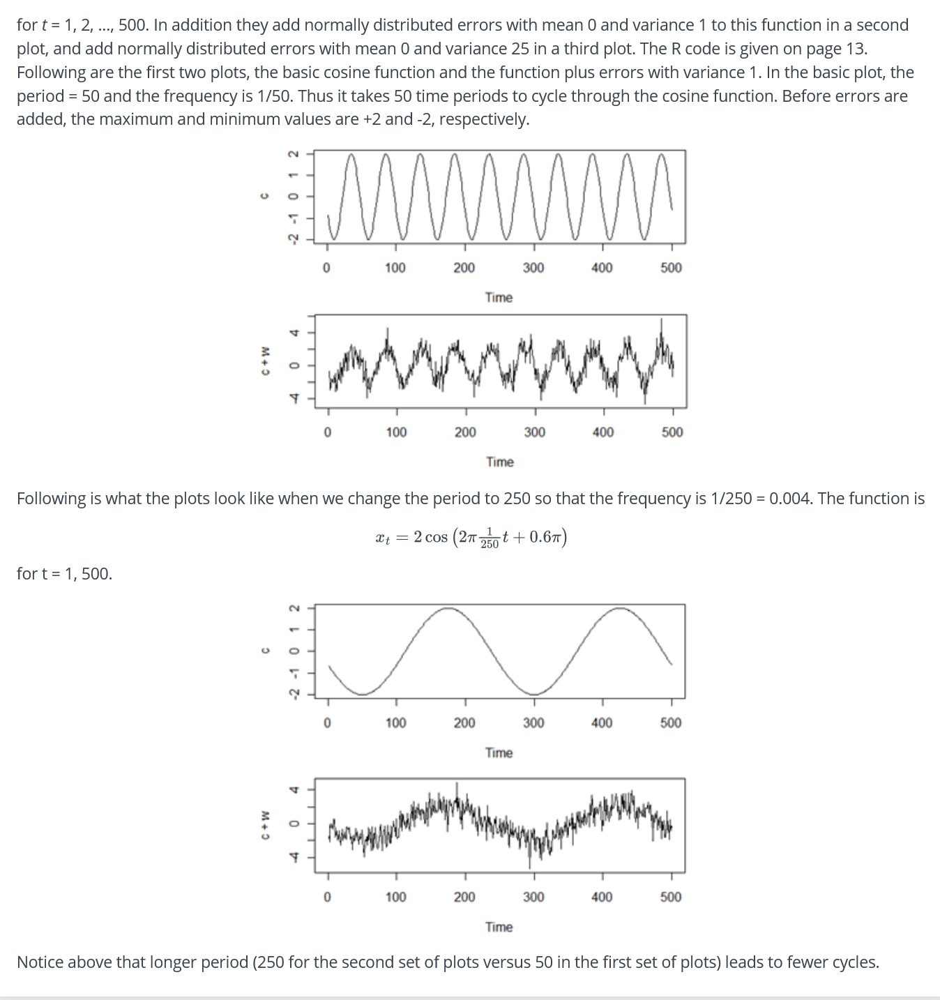

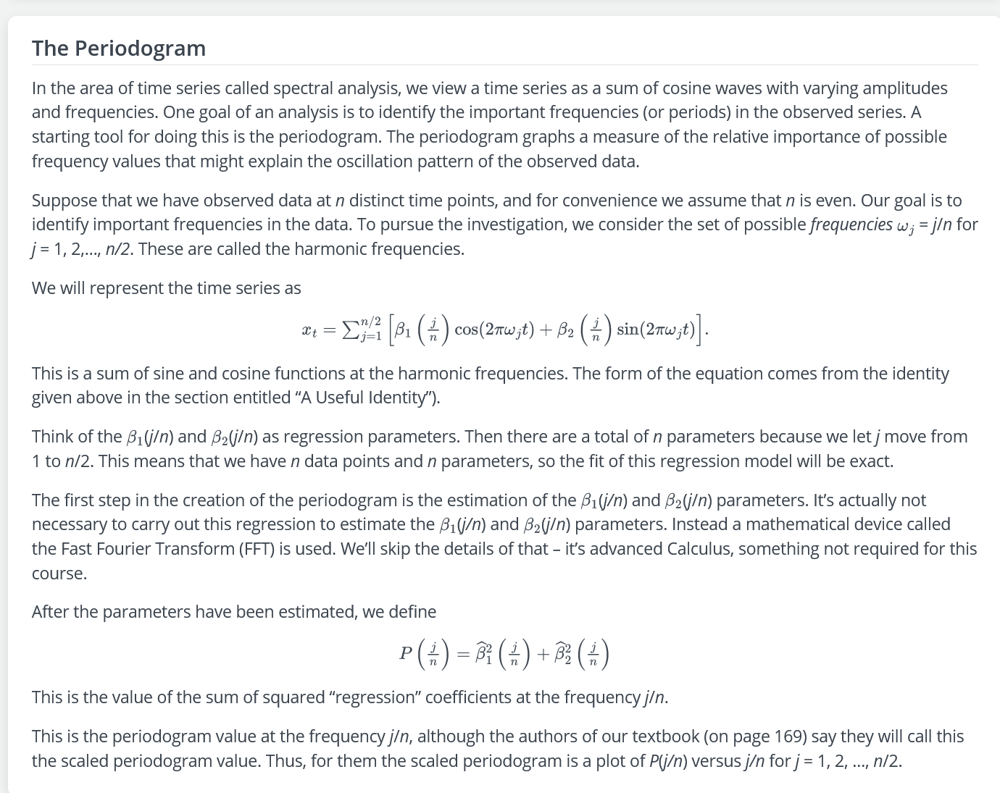

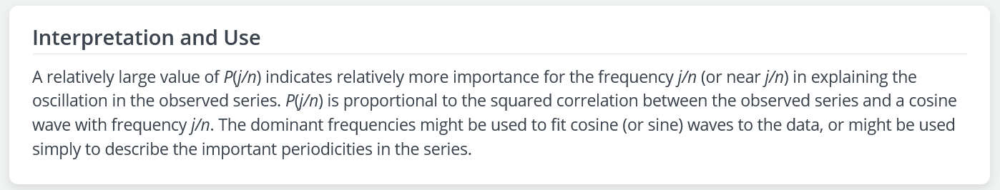

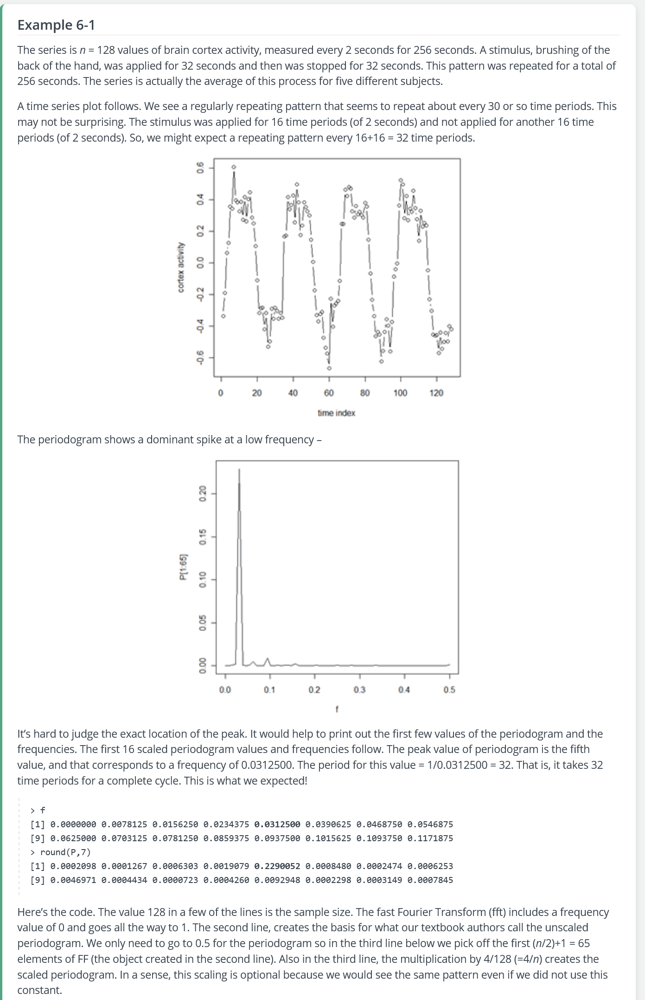

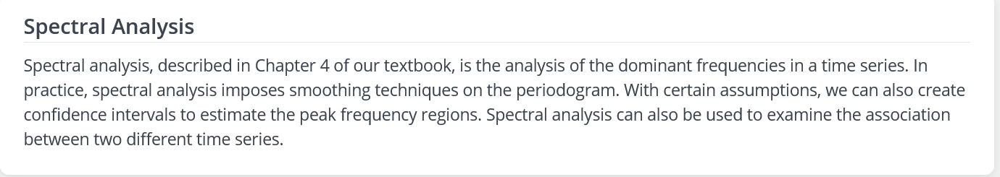

In [27]:
!pip install --upgrade quantecon

  Using cached quantecon-0.5.2-py3-none-any.whl (269 kB)


In [19]:
import numpy as np
import matplotlib.pyplot as plt
%matplotlib inline
from quantecon import ARMA, periodogram, ar_periodogram

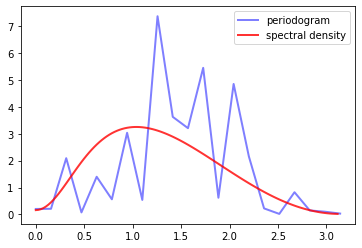

In [20]:
n = 40                          # Data size
ϕ, θ = 0.5, (0, -0.8)           # AR and MA parameters
lp = ARMA(ϕ, θ)
X = lp.simulation(ts_length=n)

fig, ax = plt.subplots()
x, y = periodogram(X)
ax.plot(x, y, 'b-', lw=2, alpha=0.5, label='periodogram')
x_sd, y_sd = lp.spectral_density(two_pi=False, res=120)
ax.plot(x_sd, y_sd, 'r-', lw=2, alpha=0.8, label='spectral density')
ax.legend()
plt.show()

In [21]:
lp

ARMA(phi=0.5, theta=(0, -0.8), sigma=1)

In [30]:
X

array([-0.49886303,  0.29361852,  1.49841678,  2.05318404, -0.89119294,
       -2.26407169,  0.1401346 ,  1.19174685,  0.90750294,  0.03457745,
       -1.42190873, -2.32745396, -0.01797976, -1.72886409, -1.61536629,
        1.89683432,  0.89038182, -0.50489888,  0.04102214,  1.14913002,
       -0.66381333,  0.42822731,  0.81395811, -0.81980947,  0.69046258,
        0.79569922, -0.58958283,  0.01496126, -0.1461525 ,  0.72368898,
        0.37271068, -1.71630862,  0.68556037,  0.40798651, -2.59843994,
       -2.06615511,  1.69356511,  2.96087271,  0.27971047, -0.8034536 ])

In [4]:
os.listdir('.')

['.ipynb_checkpoints',
 '4-Modelos con fbprophet - copia.ipynb',
 '4-Modelos con fbprophet.ipynb',
 'ACFandPACF - copia.ipynb',
 'ACFandPACF.ipynb',
 'APPLE - copia.csv',
 'APPLE.csv',
 'Clase1.ipynb',
 'Clase1f_after.ipynb',
 'Clase1_after.ipynb',
 'Clase2.ipynb',
 'daily-minimum-temperatures-in-me - copia.csv',
 'daily-minimum-temperatures-in-me.csv',
 'Electric_Production.csv',
 'Examen02_AnalisisDeDatos_munoz_cataldo_diaz_vasquez-1.ipynb',
 'monthly-beer-production-in-austr.csv',
 'my-first-time-series-comp-added-prophet.ipynb',
 'paper_STL.pdf',
 'PriceByDays - copia.csv',
 'REPASO RESUMENES CLASES.ipynb',
 'RESUMEN CURSO PYTHON VARIOS CODIGOS.ipynb',
 'RESUMEN LIBRO I A PYTHON.ipynb',
 'RESUMEN SERIES TEMPORALES MASTER.ipynb',
 'short-fast-nn-lgb - copia.ipynb',
 'short-fast-nn-lgb.ipynb',
 'SOLUCION EXAMEN 2 ANALSIS DE DATOS - copia.ipynb',
 'SOLUCION EXAMEN 2 ANALSIS DE DATOS.ipynb',
 'SOLUCION_EXAMEN_2_ANALISIS_DE_DATOS.ipynb',
 'TAREA1 ANALISIS DE DATOS.ipynb',
 'TheCombinati

### PERIODOGRAMA


In [161]:
data = pd.read_csv('daily-minimum-temperatures-in-me.csv')
data['Date'] = pd.to_datetime(data['Date'], infer_datetime_format=True)
data.set_index('Date', inplace=True)
data

,Daily minimum temperatures
Date,
1981-01-01,20.7
1981-01-02,17.9
1981-01-03,18.8
1981-01-04,14.6
1981-01-05,15.8
...,...
1990-12-27,14
1990-12-28,13.6
1990-12-29,13.5


In [162]:
data.dtypes

Daily minimum temperatures    object
dtype: object

In [163]:
data['Daily minimum temperatures'] = pd.to_numeric(data['Daily minimum temperatures'], errors ='coerce' )
data

,Daily minimum temperatures
Date,
1981-01-01,20.7
1981-01-02,17.9
1981-01-03,18.8
1981-01-04,14.6
1981-01-05,15.8
...,...
1990-12-27,14.0
1990-12-28,13.6
1990-12-29,13.5


In [164]:
data['Daily minimum temperatures'].dtypes

dtype('float64')

In [165]:
data.shape

(3650, 1)

In [166]:
data2 = data[~(data['Daily minimum temperatures'].isna())]
data2

,Daily minimum temperatures
Date,
1981-01-01,20.7
1981-01-02,17.9
1981-01-03,18.8
1981-01-04,14.6
1981-01-05,15.8
...,...
1990-12-27,14.0
1990-12-28,13.6
1990-12-29,13.5


In [167]:
z = data2['Daily minimum temperatures'].values
z

array([20.7, 17.9, 18.8, ..., 13.5, 15.7, 13. ])

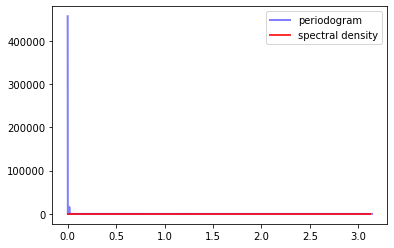

In [173]:
fig, ax = plt.subplots()
x, y = periodogram(z)
ax.plot(x, y, 'b-', lw=2, alpha=0.5, label='periodogram')
x_sd, y_sd = lp.spectral_density(two_pi=False, res=120)
ax.plot(x_sd, y_sd, 'r-', lw=2, alpha=0.8, label='spectral density')
ax.legend()
plt.show()

In [169]:
y

array([4.56389450e+05, 1.75231355e+02, 1.53662690e+01, ...,
       2.08387534e+00, 2.78143495e-01, 3.48846914e-01])

In [170]:
x

array([0.00000000e+00, 1.72283666e-03, 3.44567332e-03, ...,
       3.13728556e+00, 3.13900840e+00, 3.14073124e+00])

In [171]:
df_periodograma = pd.DataFrame(zip(x,y), columns=['freq','pf'])
df_periodograma = df_periodograma.sort_values(by='pf', ascending=False)
df_periodograma

,freq,pf
0,0.000000,456389.450313
10,0.017228,16089.043999
20,0.034457,296.842619
1,0.001723,175.231355
4,0.006891,152.370883
...,...,...
668,1.150855,0.013709
1481,2.551521,0.013608
1303,2.244856,0.008353
1794,3.090769,0.006945


In [172]:
1/0.017228

58.04504295333179

## otra forma de calcular el periodograma.. scipy.signal.periodogram

In [94]:
from scipy import signal

### Compute and plot the power spectral density.

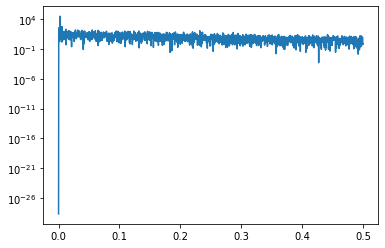

In [106]:
f, Pxx_den = signal.periodogram(z,1)

plt.semilogy(f, Pxx_den)

plt.show()

In [107]:
np.mean(Pxx_den[0:])

32.97624982862626

If we average the last half of the spectral density, to exclude the peak, we can recover the noise power on the signal.

In [108]:
np.mean(Pxx_den[20:])

14.55189274378266

Now compute and plot the power spectrum.

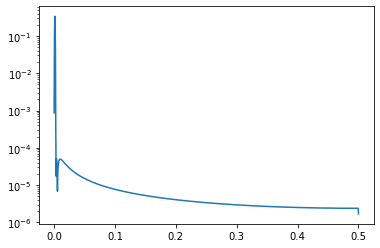

In [110]:
f, Pxx_spec = signal.periodogram(x, 1, 'flattop', scaling='spectrum')

plt.figure()

plt.semilogy(f, np.sqrt(Pxx_spec))

plt.show()

The peak height in the power spectrum is an estimate of the RMS amplitude.

In [111]:
np.sqrt(Pxx_spec.max())

0.3380466480637562

In [142]:
def fun_sincos(t):
    
    yt = 2*np.cos(2*np.pi*t*(4/96)) + 3*np.cos(2*np.pi*(14/96)*t + 0.3)
    
    return yt

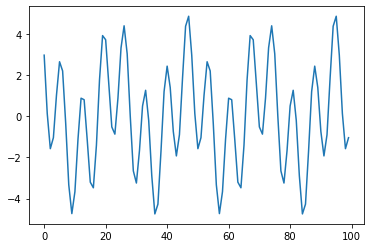

In [143]:

yt = [fun_sincos(t) for t in range(1,101)]

k = range(len(yt))

plt.plot(k,yt)

In [144]:
yt = np.array(yt)
yt

array([ 2.97321184,  0.13392117, -1.57290599, -1.0387567 ,  1.02252476,
        2.65346776,  2.20813289, -0.33477929, -3.33006311, -4.72986214,
       -3.66590593, -1.11343938,  0.88161044,  0.80684298, -1.13651443,
       -3.20078875, -3.47484783, -1.3996817 ,  1.77070336,  3.92531732,
        3.72278899,  1.61747684, -0.5162202 , -0.86600947,  0.89049146,
        3.33018044,  4.40133311,  3.0387567 ,  0.01275142, -2.65346776,
       -3.24340907, -1.66522071,  0.50163599,  1.26576053, -0.19779738,
       -2.88656062, -4.74531375, -4.2709446 , -1.69191269,  1.20078875,
        2.43957165,  1.3996817 , -0.73542718, -1.92531732, -0.89436186,
        1.84662477,  4.3799235 ,  4.86600947,  2.97321184,  0.13392117,
       -1.57290599, -1.0387567 ,  1.02252476,  2.65346776,  2.20813289,
       -0.33477929, -3.33006311, -4.72986214, -3.66590593, -1.11343938,
        0.88161044,  0.80684298, -1.13651443, -3.20078875, -3.47484783,
       -1.3996817 ,  1.77070336,  3.92531732,  3.72278899,  1.61

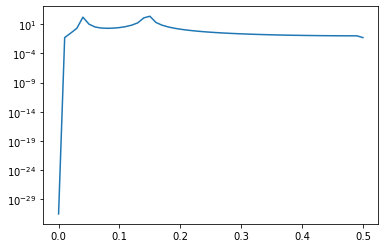

In [145]:
f, Pxx_den = signal.periodogram(yt,1)

plt.semilogy(f, Pxx_den)

plt.show()

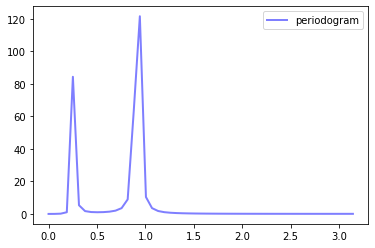

In [146]:
fig, ax = plt.subplots()
x, y = periodogram(yt)
ax.plot(x, y, 'b-', lw=2, alpha=0.5, label='periodogram')
#x_sd, y_sd = lp.spectral_density(two_pi=False, res=120)
#ax.plot(x_sd, y_sd, 'r-', lw=2, alpha=0.8, label='spectral density')
ax.legend()
plt.show()

In [128]:
y

array([2.45490853e-03, 2.66817167e-02, 1.60221498e-01, 1.04171533e+00,
       8.43402652e+01, 5.33619671e+00, 1.73362342e+00, 1.15724449e+00,
       1.03605653e+00, 1.11282061e+00, 1.38533068e+00, 2.00740044e+00,
       3.55206480e+00, 8.93366239e+00, 6.34236990e+01, 1.21570516e+02,
       1.04005649e+01, 3.56526595e+00, 1.79133503e+00, 1.08233133e+00,
       7.29630876e-01, 5.29015350e-01, 4.04041149e-01, 3.20886339e-01,
       2.62725016e-01, 2.20423607e-01, 1.88677258e-01, 1.64233710e-01,
       1.45008874e-01, 1.29617030e-01, 1.17107563e-01, 1.06810644e-01,
       9.82432346e-02, 9.10498899e-02, 8.49643868e-02, 7.97842047e-02,
       7.53531662e-02, 7.15493864e-02, 6.82767570e-02, 6.54588297e-02,
       6.30343593e-02, 6.09540157e-02, 5.91779311e-02, 5.76738528e-02,
       5.64157449e-02, 5.53827231e-02, 5.45582456e-02, 5.39294999e-02,
       5.34869472e-02, 5.32239935e-02, 5.31367677e-02])

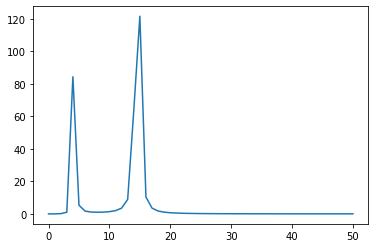

In [134]:
plt.plot(range(len(y)),y)

In [158]:
df_periodograma = pd.DataFrame(zip(x,y), columns=['freq','pf'])
df_periodograma = df_periodograma.sort_values(by='pf', ascending=False)
df_periodograma

,freq,pf
15,0.942478,121.570516
4,0.251327,84.340265
14,0.879646,63.423699
16,1.005310,10.400565
13,0.816814,8.933662
5,0.314159,5.336197
17,1.068142,3.565266
12,0.753982,3.552065
11,0.691150,2.007400
18,1.130973,1.791335


In [159]:
p1 = 1/0.942478
p1

1.061032724371285

In [160]:
p2 = 1/0.251327
p2

3.9788801044058135

### EJEMPLO 2.. USANDO SCYPY


In [188]:
df = pd.read_csv('data_forecast.csv', sep=';')
df

,fecha,kg_neto,precio_product_x_kilo
0,2018-01-29,15335.0,882.052690
1,2018-02-05,23269.0,753.316486
2,2018-02-12,18308.0,858.988529
3,2018-02-19,20876.0,897.955691
4,2018-02-26,23488.0,890.580576
...,...,...,...
175,2021-06-07,36733.0,826.888765
176,2021-06-14,40658.0,822.861844
177,2021-06-21,48227.0,858.012856
178,2021-06-28,52487.0,856.418092


In [189]:
df.dtypes

fecha                     object
kg_neto                  float64
precio_product_x_kilo    float64
dtype: object

In [190]:
df['fecha'] = pd.to_datetime(df['fecha'], infer_datetime_format=True)
df

,fecha,kg_neto,precio_product_x_kilo
0,2018-01-29,15335.0,882.052690
1,2018-02-05,23269.0,753.316486
2,2018-02-12,18308.0,858.988529
3,2018-02-19,20876.0,897.955691
4,2018-02-26,23488.0,890.580576
...,...,...,...
175,2021-06-07,36733.0,826.888765
176,2021-06-14,40658.0,822.861844
177,2021-06-21,48227.0,858.012856
178,2021-06-28,52487.0,856.418092


In [191]:
df.set_index('fecha', inplace=True)

In [192]:
df

,kg_neto,precio_product_x_kilo
fecha,,
2018-01-29,15335.0,882.052690
2018-02-05,23269.0,753.316486
2018-02-12,18308.0,858.988529
2018-02-19,20876.0,897.955691
2018-02-26,23488.0,890.580576
...,...,...
2021-06-07,36733.0,826.888765
2021-06-14,40658.0,822.861844
2021-06-21,48227.0,858.012856


<AxesSubplot:xlabel='fecha'>

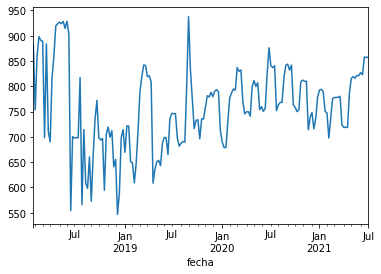

In [193]:
df['precio_product_x_kilo'].plot()

<AxesSubplot:xlabel='fecha'>

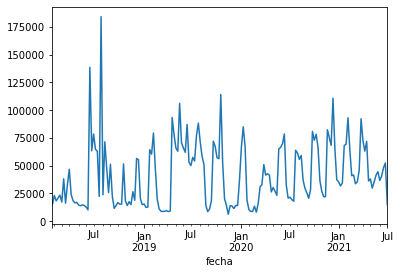

In [194]:
df['kg_neto'].plot()

In [195]:
s1 = df['precio_product_x_kilo'].values
s1

array([882.05268993, 753.31648616, 858.98852898, 897.95569075,
       890.58057649, 888.90520231, 698.51683863, 883.55005853,
       711.28545338, 689.97201154, 816.87211331, 859.40532528,
       919.11369022, 923.30499912, 926.60073008, 923.63708581,
       928.03148324, 914.19137542, 928.43899391, 902.75729106,
       554.58527253, 700.45850083, 697.44075648, 698.52812076,
       698.50054787, 817.30762344, 566.10282084, 714.41543963,
       608.69702804, 598.07087454, 660.53003568, 572.77099168,
       663.87641883, 735.43851147, 772.09418302, 698.57000774,
       693.9070632 , 696.92040155, 594.65088643, 705.17565574,
       719.48581836, 699.37354263, 712.32276406, 641.00963819,
       655.56459305, 547.00048664, 587.91625014, 698.57548327,
       714.20284441, 669.52010568, 721.43744975, 721.40868815,
       651.13613451, 648.61534959, 609.10783573, 647.95871184,
       713.76774003, 788.94793057, 818.67405519, 841.96062093,
       841.21007002, 818.91680869, 820.73429785, 808.31

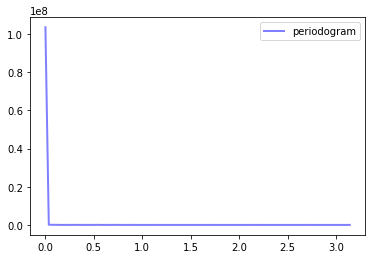

In [196]:


fig, ax = plt.subplots()
x, y = periodogram(s1)
ax.plot(x, y, 'b-', lw=2, alpha=0.5, label='periodogram')
#x_sd, y_sd = lp.spectral_density(two_pi=False, res=120)
#ax.plot(x_sd, y_sd, 'r-', lw=2, alpha=0.8, label='spectral density')
ax.legend()
plt.show()

In [197]:
df_periodograma = pd.DataFrame(zip(x,y), columns=['freq','pf'])
df_periodograma = df_periodograma.sort_values(by='pf', ascending=False)
df_periodograma

,freq,pf
0,0.000000,1.035338e+08
1,0.034907,1.043177e+05
3,0.104720,6.056503e+04
2,0.069813,5.004281e+04
21,0.733038,3.335044e+04
...,...,...
75,2.617994,1.723687e+02
39,1.361357,1.384912e+02
17,0.593412,1.049409e+02
76,2.652900,6.869057e+01


In [198]:
1/0.034907

28.647549202165756

In [199]:
s2 = df['kg_neto'].values
s2

array([ 15335.,  23269.,  18308.,  20876.,  23488.,  17300.,  38187.,
        16231.,  32853.,  46806.,  24077.,  18553.,  16458.,  17023.,
        14520.,  13973.,  14739.,  14192.,  12803.,  10219., 138573.,
        63436.,  78574.,  64792.,  62972.,  22339., 184244.,  23770.,
        71505.,  47831.,  25787.,  51318.,  22730.,  11556.,  14218.,
        16792.,  15333.,  15440.,  51668.,  18301.,  14138.,  17583.,
        14949.,  26562.,  18873.,  56531.,  55242.,  20382.,  14917.,
        15519.,  12438.,  12753.,  64474.,  60400.,  79418.,  47666.,
        20279.,  11236.,   9024.,   8761.,   8997.,   9389.,   8710.,
         9275.,  93436.,  78173.,  65964.,  63019., 106139.,  70606.,
        66057.,  62089.,  87168.,  53142.,  50094.,  57520.,  54270.,
        77182.,  88366.,  71444.,  58328.,  51126.,  14449.,   8685.,
        10929.,  18628.,  72071.,  67384.,  57146.,  56315., 114156.,
        52874.,  20309.,  14330.,   6223.,  14061.,  13679.,  11394.,
        14262.,  141

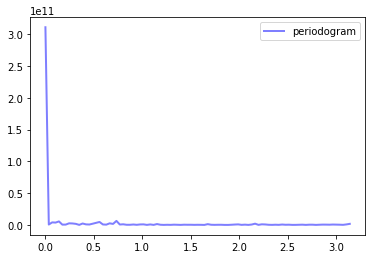

In [200]:
fig, ax = plt.subplots()
x, y = periodogram(s2)
ax.plot(x, y, 'b-', lw=2, alpha=0.5, label='periodogram')
#x_sd, y_sd = lp.spectral_density(two_pi=False, res=120)
#ax.plot(x_sd, y_sd, 'r-', lw=2, alpha=0.8, label='spectral density')
ax.legend()
plt.show()

In [201]:
df_periodograma = pd.DataFrame(zip(x,y), columns=['freq','pf'])
df_periodograma = df_periodograma.sort_values(by='pf', ascending=False)
df_periodograma

,freq,pf
0,0.000000,3.112493e+11
21,0.733038,6.301703e+09
4,0.139626,5.511166e+09
16,0.558505,4.639148e+09
2,0.069813,3.989332e+09
...,...,...
35,1.221730,4.383863e+07
60,2.094395,3.957561e+07
53,1.850049,2.742574e+07
54,1.884956,1.425564e+07


In [202]:
1/0.733038

1.3641857584463561

### usando libreria signal...

In [211]:
from scipy import signal

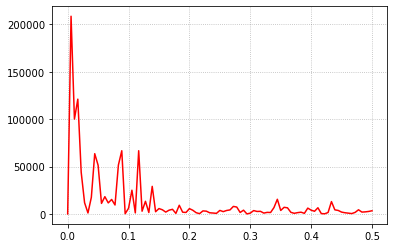

In [212]:
freq, pdensity = signal.periodogram(s1)

fig, ax = plt.subplots()
ax.plot(freq, pdensity, color='r')
ax.grid(color='k', alpha=0.3, linestyle=':')
plt.show()
plt.close(fig)

In [213]:
df_periodograma = pd.DataFrame(zip(freq,pdensity), columns=['freq','pf'])
df_periodograma = df_periodograma.sort_values(by='pf', ascending=False)
df_periodograma

,freq,pf
1,0.005556,2.086355e+05
3,0.016667,1.211301e+05
2,0.011111,1.000856e+05
21,0.116667,6.670089e+04
16,0.088889,6.668201e+04
...,...,...
39,0.216667,2.769824e+02
17,0.094444,2.098818e+02
76,0.422222,1.373811e+02
53,0.294444,4.098308e+00


In [214]:
1/0.005556

179.98560115190784

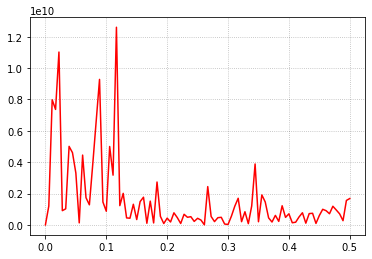

In [215]:
freq, pdensity = signal.periodogram(s2)

fig, ax = plt.subplots()
ax.plot(freq, pdensity, color='r')
ax.grid(color='k', alpha=0.3, linestyle=':')
plt.show()
plt.close(fig)

In [216]:
df_periodograma = pd.DataFrame(zip(freq,pdensity), columns=['freq','pf'])
df_periodograma = df_periodograma.sort_values(by='pf', ascending=False)
df_periodograma

,freq,pf
21,0.116667,1.260341e+10
4,0.022222,1.102233e+10
16,0.088889,9.278296e+09
2,0.011111,7.978664e+09
3,0.016667,7.362751e+09
...,...,...
60,0.333333,7.915121e+07
53,0.294444,5.485148e+07
54,0.300000,2.851128e+07
47,0.261111,6.192339e+06


In [217]:
1/0.116667

8.571404081702623

## Lesson 8: Regression with ARIMA errors, Cross correlation functions, and Relationships between 2 Time Series

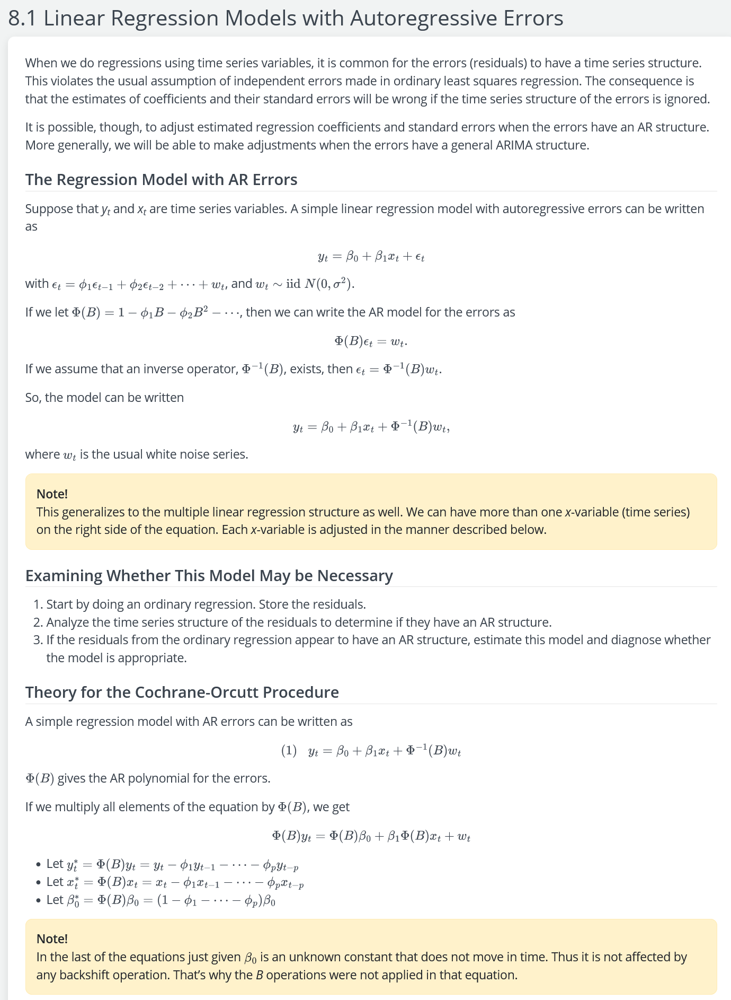

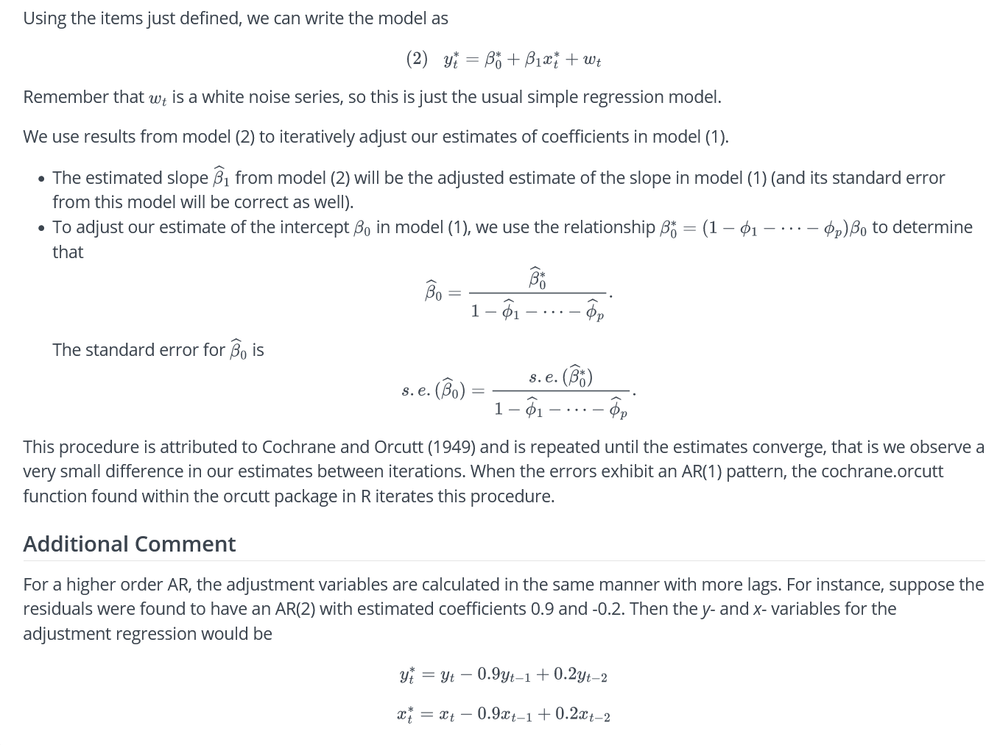

In [219]:
df

,kg_neto,precio_product_x_kilo
fecha,,
2018-01-29,15335.0,882.052690
2018-02-05,23269.0,753.316486
2018-02-12,18308.0,858.988529
2018-02-19,20876.0,897.955691
2018-02-26,23488.0,890.580576
...,...,...
2021-06-07,36733.0,826.888765
2021-06-14,40658.0,822.861844
2021-06-21,48227.0,858.012856


<AxesSubplot:xlabel='kg_neto', ylabel='precio_product_x_kilo'>

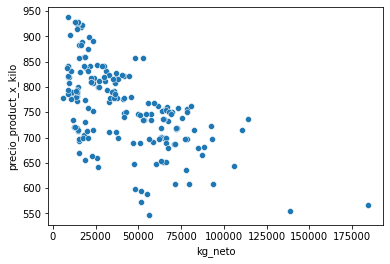

In [220]:
sns.scatterplot(x='kg_neto',y ='precio_product_x_kilo',data=df)

In [221]:
import statsmodels.api as sm


In [224]:
X = sm.add_constant(df['kg_neto'])
y = df[['precio_product_x_kilo']]


In [225]:
model = sm.OLS(y, X)
results = model.fit()
print(results.summary())



                              OLS Regression Results                             
Dep. Variable:     precio_product_x_kilo   R-squared:                       0.345
Model:                               OLS   Adj. R-squared:                  0.342
Method:                    Least Squares   F-statistic:                     93.94
Date:                   Sat, 15 Jan 2022   Prob (F-statistic):           4.19e-18
Time:                           19:00:41   Log-Likelihood:                -1006.7
No. Observations:                    180   AIC:                             2017.
Df Residuals:                        178   BIC:                             2024.
Df Model:                              1                                         
Covariance Type:               nonrobust                                         
                 coef    std err          t      P>|t|      [0.025      0.975]
------------------------------------------------------------------------------
const        827.3709 

In [228]:
resid = pd.DataFrame(results.resid, columns=['residuals'])
resid

,residuals
fecha,
2018-01-29,80.112574
2018-02-05,-35.466278
2018-02-12,61.978689
2018-02-19,105.204494
2018-02-26,102.160991
...,...
2021-06-07,60.434031
2021-06-14,62.916135
2021-06-21,110.619201


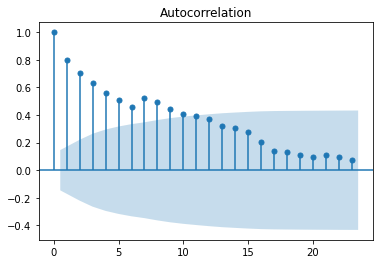

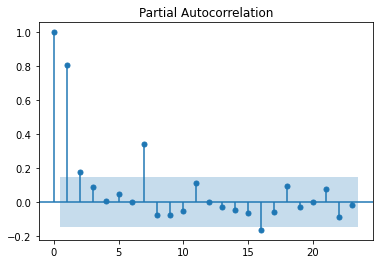

In [229]:
plot_acf(resid['residuals'])
plot_pacf(resid['residuals'])
pyplot.show()

In [230]:
# Construct the model
mod = sm.tsa.SARIMAX(resid['residuals'], order=(1,0, 0), trend=None)
# Estimate the parameters
res = mod.fit()

print(res.summary())

                               SARIMAX Results                                
Dep. Variable:              residuals   No. Observations:                  180
Model:               SARIMAX(1, 0, 0)   Log Likelihood                -912.692
Date:                Sat, 15 Jan 2022   AIC                           1829.383
Time:                        19:13:10   BIC                           1835.769
Sample:                    01-29-2018   HQIC                          1831.973
                         - 07-05-2021                                         
Covariance Type:                  opg                                         
                 coef    std err          z      P>|z|      [0.025      0.975]
------------------------------------------------------------------------------
ar.L1          0.8069      0.045     18.014      0.000       0.719       0.895
sigma2      1476.3333    111.457     13.246      0.000    1257.881    1694.785
Ljung-Box (L1) (Q):                   3.68   Jarque-

In [233]:
df

,kg_neto,precio_product_x_kilo
fecha,,
2018-01-29,15335.0,882.052690
2018-02-05,23269.0,753.316486
2018-02-12,18308.0,858.988529
2018-02-19,20876.0,897.955691
2018-02-26,23488.0,890.580576
...,...,...
2021-06-07,36733.0,826.888765
2021-06-14,40658.0,822.861844
2021-06-21,48227.0,858.012856


In [236]:
df_vec = df.copy()
df_vec['lag_x1'] = df_vec['kg_neto'].shift(1)
df_vec['lag_y' ] = df_vec['precio_product_x_kilo'].shift(1)
df_vec['x1_reg_ajust'] = df_vec['kg_neto'] - 0.8069*df_vec['lag_x1']
df_vec['y_reg_ajust'] = df_vec['precio_product_x_kilo'] - 0.8069*df_vec['lag_y']
df_vec.fillna(0,inplace=True)
df_vec

,kg_neto,precio_product_x_kilo,lag_x1,lag_y,x1_reg_ajust,y_reg_ajust
fecha,,,,,,
2018-01-29,15335.0,882.052690,0.0,0.000000,0.0000,0.000000
2018-02-05,23269.0,753.316486,15335.0,882.052690,10895.1885,41.588171
2018-02-12,18308.0,858.988529,23269.0,753.316486,-467.7561,251.137456
2018-02-19,20876.0,897.955691,18308.0,858.988529,6103.2748,204.837847
2018-02-26,23488.0,890.580576,20876.0,897.955691,6643.1556,166.020130
...,...,...,...,...,...,...
2021-06-07,36733.0,826.888765,44625.0,821.014320,725.0875,164.412310
2021-06-14,40658.0,822.861844,36733.0,826.888765,11018.1423,155.645300
2021-06-21,48227.0,858.012856,40658.0,822.861844,15420.0598,194.045634


In [237]:
X2 = sm.add_constant(df_vec['x1_reg_ajust'])
y2 = df_vec[['y_reg_ajust']]


In [238]:
X2 = sm.add_constant(df_vec['x1_reg_ajust'])
y2 = df_vec[['y_reg_ajust']]

model = sm.OLS(y2, X2)
results = model.fit()
print(results.summary())



                            OLS Regression Results                            
Dep. Variable:            y_reg_ajust   R-squared:                       0.544
Model:                            OLS   Adj. R-squared:                  0.541
Method:                 Least Squares   F-statistic:                     212.4
Date:                Sat, 15 Jan 2022   Prob (F-statistic):           3.55e-32
Time:                        19:44:40   Log-Likelihood:                -919.63
No. Observations:                 180   AIC:                             1843.
Df Residuals:                     178   BIC:                             1850.
Df Model:                           1                                         
Covariance Type:            nonrobust                                         
                   coef    std err          t      P>|t|      [0.025      0.975]
--------------------------------------------------------------------------------
const          158.4722      3.133     50.580   

In [239]:
def fun_reg_vect(x):
    
    yt = (158.4722)/(1-0.8063) - 0.0016*x
    
    return yt

In [240]:
resid2 = pd.DataFrame(results.resid, columns=['residuals2'])
resid2

,residuals2
fecha,
2018-01-29,-158.472189
2018-02-05,-99.102732
2018-02-12,91.901875
2018-02-19,56.326392
2018-02-26,18.389777
...,...
2021-06-07,7.123487
2021-06-14,15.155062
2021-06-21,60.739462


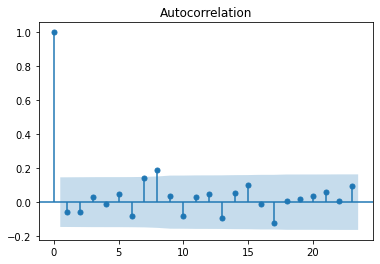

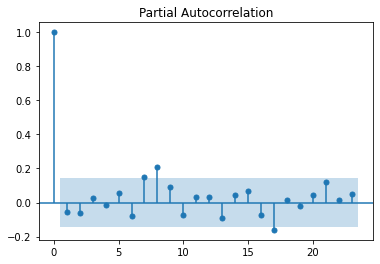

In [241]:
plot_acf(resid2['residuals2'])
plot_pacf(resid2['residuals2'])
pyplot.show()

In [242]:
df.describe()

,kg_neto,precio_product_x_kilo
count,180.000000,180.000000
mean,41583.200000,758.411403
std,28539.760631,80.527385
min,6223.000000,547.000487
25%,17230.750000,699.251481
50%,35517.000000,755.329193
75%,63216.250000,816.097229
max,184244.000000,937.524352


In [244]:
fun_reg_vect(5517.000000)

809.3049631388747

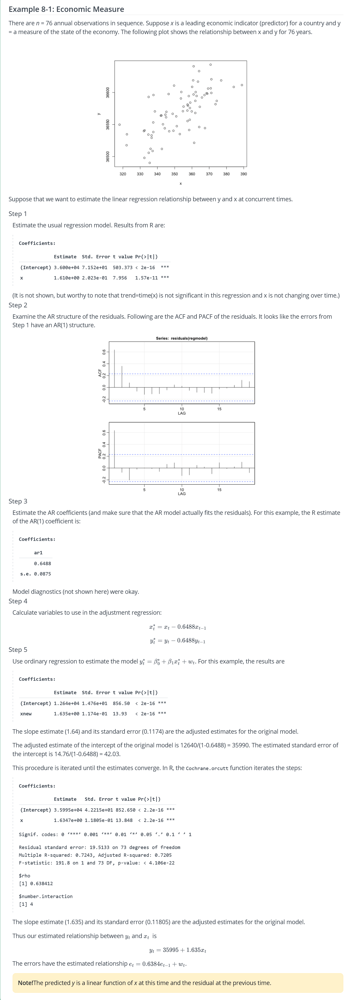

In [246]:
import statsmodels.api as sm

#calculate cross correlation
ccc = sm.tsa.stattools.ccf(df_vec['kg_neto'] , df_vec['precio_product_x_kilo'] , adjusted=False)
ccc

array([-0.587737  , -0.23808732, -0.13142753,  0.04688097,  0.20206754,
        0.24282278,  0.16693924,  0.21403739,  0.11032004,  0.06183982,
        0.08681628,  0.07443094,  0.12889061,  0.21863948,  0.1132988 ,
        0.11599212,  0.09117405,  0.04389709,  0.03394848,  0.08448905,
        0.0299871 ,  0.04633465, -0.04201302, -0.10019425, -0.07265287,
       -0.14723739, -0.10410204, -0.02007235,  0.06067836,  0.07810308,
        0.08534023,  0.06823433, -0.05399212, -0.11207017, -0.1740119 ,
       -0.18317207, -0.16012764, -0.13034185, -0.03411898,  0.04960451,
        0.05197413,  0.01177367, -0.0495972 , -0.10788195, -0.22809618,
       -0.19578527, -0.18261334, -0.11159252, -0.08967166, -0.01940873,
        0.04183256,  0.07669036,  0.08939108,  0.13245075,  0.14461454,
        0.08913189,  0.09252377,  0.06631666,  0.02329827,  0.05358545,
        0.08911174,  0.14767062,  0.15707588,  0.17574538,  0.17578716,
        0.1994962 ,  0.11974713,  0.10108823,  0.08376097,  0.01

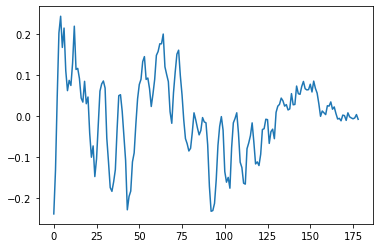

In [248]:
plt.plot(ccc[1:])

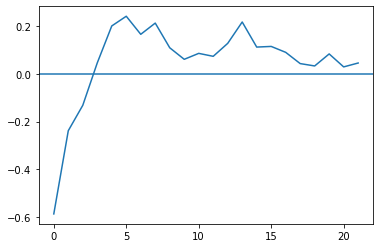

In [250]:
plt.plot(sm.tsa.stattools.ccf(df_vec['kg_neto'], df_vec['precio_product_x_kilo'], unbiased=False)[:22])
plt.axhline(0)

## 8.2 Cross Correlation Functions and Lagged Regressions

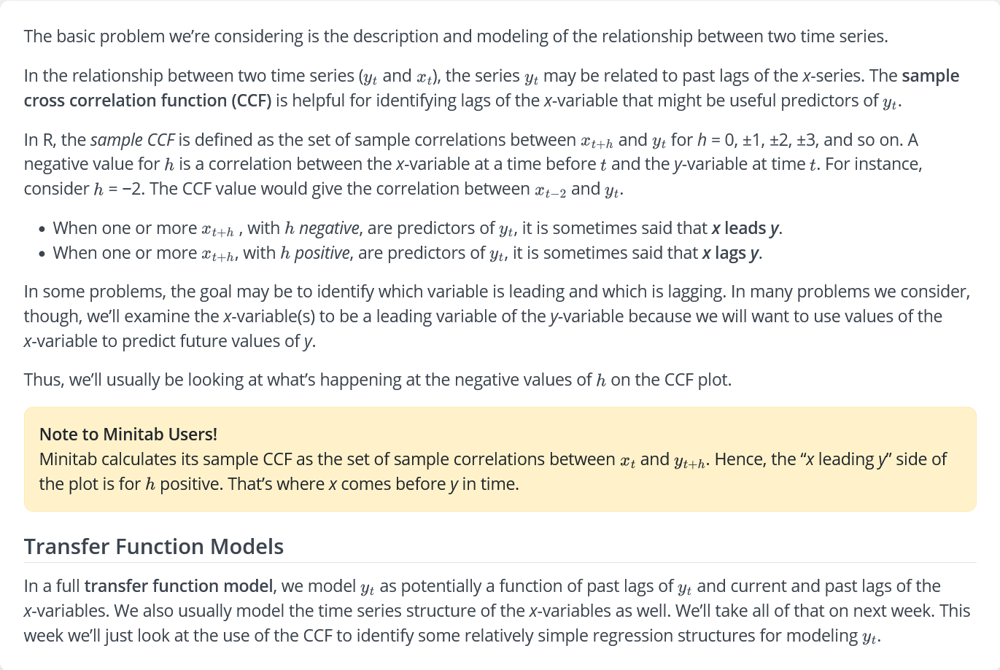

Cross correlation is a way to measure the degree of similarity between a time series and a lagged version of another time series.

This type of correlation is useful to calculate because it can tell us if the values of one time series are predictive of the future values of another time series. In other words, it can tell us if one time series is a leading indicator for another time series.

This type of correlation is used in many different fields, including:

Business: Marketing spend is often considered to be a leading indicator for future revenue of businesses. For example, if a business spends an abnormally high amount of money on marketing during one quarter, then total revenue is expected to be high x quarters later.

Economics: The consumer confidence index (CCI) is considered to be a leading indicator for the gross domestic product (GDP) of a country. For example, if CCI is high during a given month, the GDP is likely to be higher x months later.

### The following example shows how to calculate the cross correlation between two time series in Python.
Example: How to Calculate Cross Correlation in Python

Suppose we have the following time series in Python that show the total marketing spend (in thousands) for a certain company along with the the total revenue (in thousands) during 12 consecutive months:

In [251]:
import numpy as np

#define data 
marketing = np.array([3, 4, 5, 5, 7, 9, 13, 15, 12, 10, 8, 8])
revenue = np.array([21, 19, 22, 24, 25, 29, 30, 34, 37, 40, 35, 30]) 


We can calculate the cross correlation for every lag between the two time series by using the ccf() function from the statsmodels package as follows:

In [252]:
import statsmodels.api as sm

#calculate cross correlation
sm.tsa.stattools.ccf(marketing, revenue, adjusted=False)



array([ 0.77109358,  0.46238654,  0.19352232, -0.06066296, -0.28159595,
       -0.44531104, -0.49159463, -0.35783655, -0.15697476, -0.03430078,
        0.01587722,  0.0070399 ])

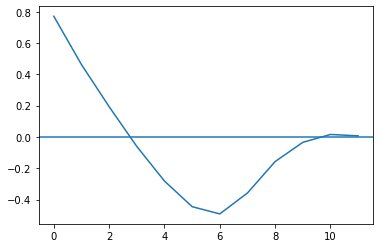

In [253]:
plt.plot(sm.tsa.stattools.ccf(marketing, revenue, unbiased=False)[:22])
plt.axhline(0)

### Here’s how to interpret this output:

    The cross correlation at lag 0 is 0.771.
    The cross correlation at lag 1 is 0.462.
    The cross correlation at lag 2 is 0.194.
    The cross correlation at lag 3 is -0.061.

And so on.

**Notice that the correlation between the two time series becomes less and less positive as the number of lags increases. This tells us that marketing spend during a given month is quite predictive of revenue one or two months later, but not predictive of revenue beyond more than two months.**

This intuitively makes sense – we would expect that high marketing spend during a given month is predictive of increased revenue during the next two months, but not necessarily predictive of revenue several months into the future.

https://www.statsmodels.org/dev/examples/notebooks/generated/ols.html

https://towardsdatascience.com/computing-cross-correlation-between-geophysical-time-series-488642be7bf0

https://www.kaggle.com/howoojang/first-kaggle-notebook-following-ts-tutorial
    
https://online.stat.psu.edu/stat510/lesson/8/8.2

https://www.statsmodels.org/dev/examples/notebooks/generated/ols.html

http://bebi103.caltech.edu.s3-website-us-east-1.amazonaws.com/2015/tutorials/t7a_time_series.html

https://www.it-swarm-es.com/es/python/como-encontrar-el-periodo-de-la-senal-autocorrelacion-frente-transformada-rapida-de-fourier-frente-densidad-espectral-de-potencia/812978283/

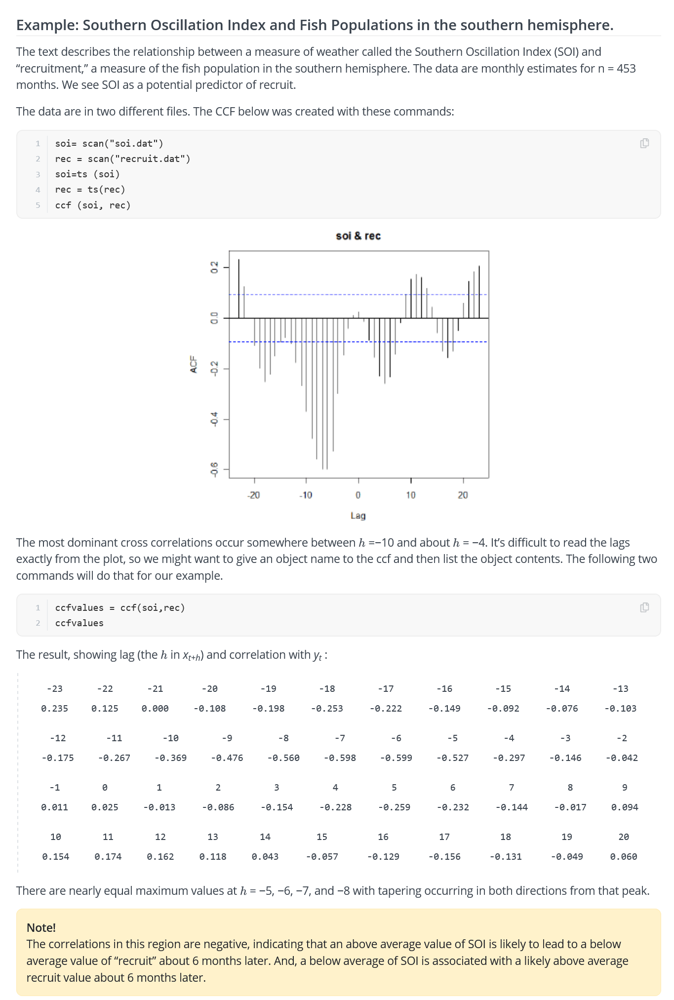

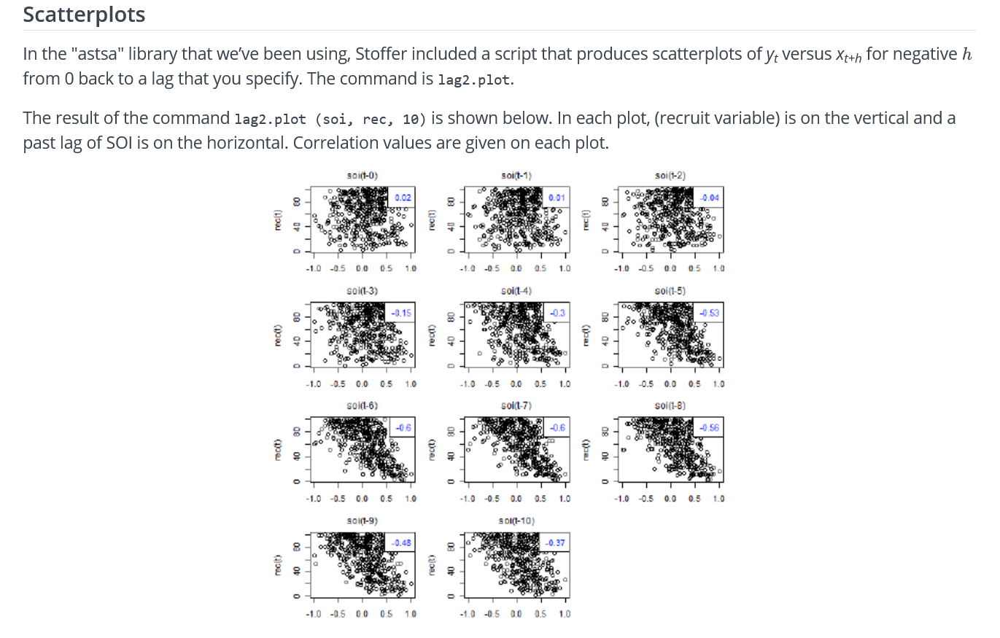

In [255]:
df_vec['lag2_x1'] = df_vec['kg_neto'].shift(2)
df_vec['lag3_x1'] = df_vec['kg_neto'].shift(3)
df_vec['lag4_x1'] = df_vec['kg_neto'].shift(4)
df_vec['lag5_x1'] = df_vec['kg_neto'].shift(5)
df_vec['lag6_x1'] = df_vec['kg_neto'].shift(6)
df_vec

,kg_neto,precio_product_x_kilo,lag_x1,lag_y,x1_reg_ajust,y_reg_ajust,lag2_x1,lag3_x1,lag4_x1,lag5_x1,lag6_x1
fecha,,,,,,,,,,,
2018-01-29,15335.0,882.052690,0.0,0.000000,0.0000,0.000000,NaN,NaN,NaN,NaN,NaN
2018-02-05,23269.0,753.316486,15335.0,882.052690,10895.1885,41.588171,NaN,NaN,NaN,NaN,NaN
2018-02-12,18308.0,858.988529,23269.0,753.316486,-467.7561,251.137456,15335.0,NaN,NaN,NaN,NaN
2018-02-19,20876.0,897.955691,18308.0,858.988529,6103.2748,204.837847,23269.0,15335.0,NaN,NaN,NaN
2018-02-26,23488.0,890.580576,20876.0,897.955691,6643.1556,166.020130,18308.0,23269.0,15335.0,NaN,NaN
...,...,...,...,...,...,...,...,...,...,...,...
2021-06-07,36733.0,826.888765,44625.0,821.014320,725.0875,164.412310,41437.0,35408.0,29805.0,38079.0,36246.0
2021-06-14,40658.0,822.861844,36733.0,826.888765,11018.1423,155.645300,44625.0,41437.0,35408.0,29805.0,38079.0
2021-06-21,48227.0,858.012856,40658.0,822.861844,15420.0598,194.045634,36733.0,44625.0,41437.0,35408.0,29805.0


In [256]:
df_corr =df_vec[['precio_product_x_kilo','kg_neto','lag_x1','lag2_x1','lag3_x1','lag4_x1','lag5_x1','lag6_x1']]
df_corr

,precio_product_x_kilo,kg_neto,lag_x1,lag2_x1,lag3_x1,lag4_x1,lag5_x1,lag6_x1
fecha,,,,,,,,
2018-01-29,882.052690,15335.0,0.0,NaN,NaN,NaN,NaN,NaN
2018-02-05,753.316486,23269.0,15335.0,NaN,NaN,NaN,NaN,NaN
2018-02-12,858.988529,18308.0,23269.0,15335.0,NaN,NaN,NaN,NaN
2018-02-19,897.955691,20876.0,18308.0,23269.0,15335.0,NaN,NaN,NaN
2018-02-26,890.580576,23488.0,20876.0,18308.0,23269.0,15335.0,NaN,NaN
...,...,...,...,...,...,...,...,...
2021-06-07,826.888765,36733.0,44625.0,41437.0,35408.0,29805.0,38079.0,36246.0
2021-06-14,822.861844,40658.0,36733.0,44625.0,41437.0,35408.0,29805.0,38079.0
2021-06-21,858.012856,48227.0,40658.0,36733.0,44625.0,41437.0,35408.0,29805.0


<AxesSubplot:>

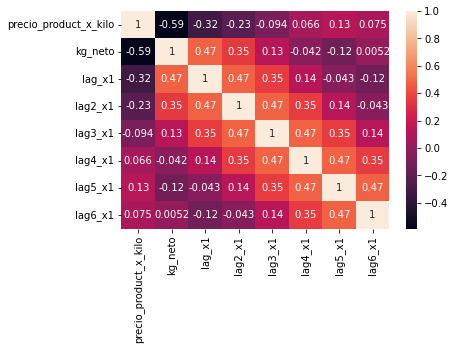

In [257]:
z_corr = df_corr.corr()



sns.heatmap(z_corr, annot=True)

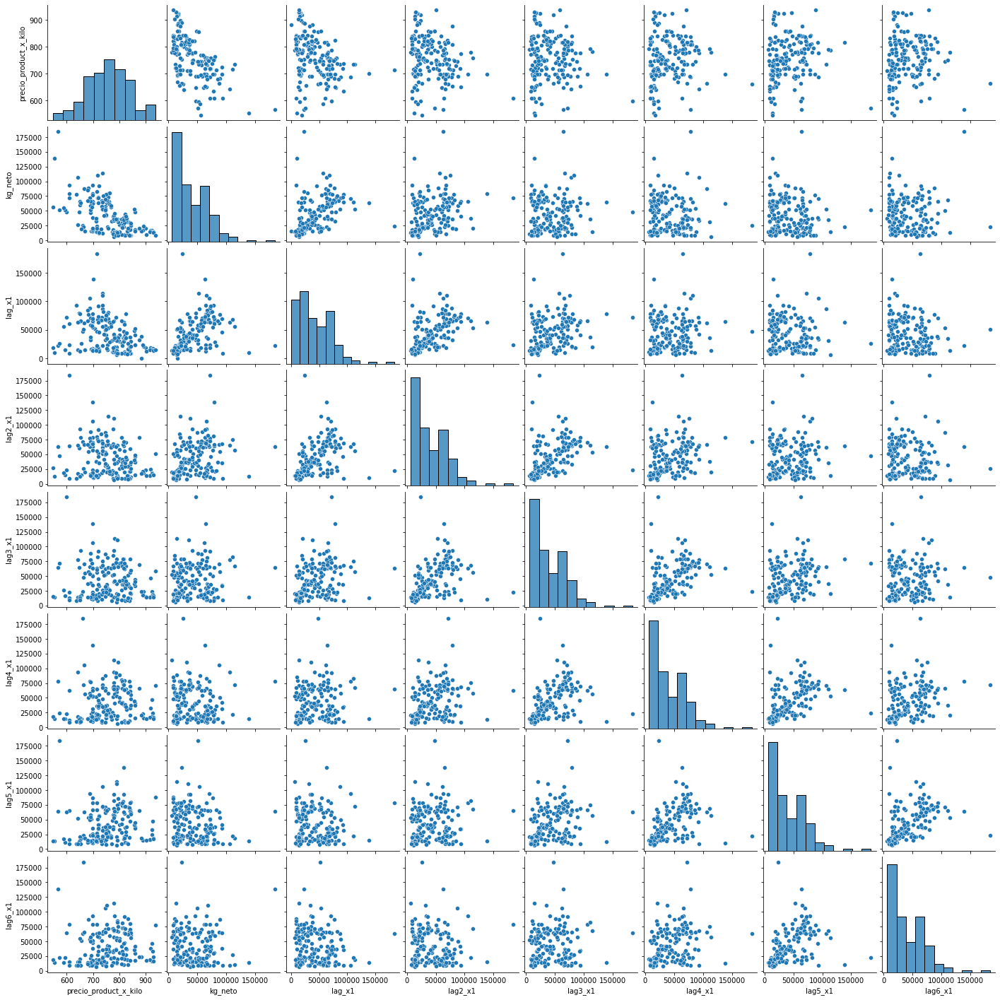

In [262]:
sns.pairplot(data=df_corr)

In [264]:
X2 = sm.add_constant(df_vec[['kg_neto','lag_x1']].fillna(0))
y2 = df_vec[['precio_product_x_kilo']]

model = sm.OLS(y2, X2)
results = model.fit()
print(results.summary())



                              OLS Regression Results                             
Dep. Variable:     precio_product_x_kilo   R-squared:                       0.348
Model:                               OLS   Adj. R-squared:                  0.340
Method:                    Least Squares   F-statistic:                     47.19
Date:                   Mon, 17 Jan 2022   Prob (F-statistic):           3.75e-17
Time:                           13:14:22   Log-Likelihood:                -1006.4
No. Observations:                    180   AIC:                             2019.
Df Residuals:                        177   BIC:                             2028.
Df Model:                              2                                         
Covariance Type:               nonrobust                                         
                 coef    std err          t      P>|t|      [0.025      0.975]
------------------------------------------------------------------------------
const        830.7220 

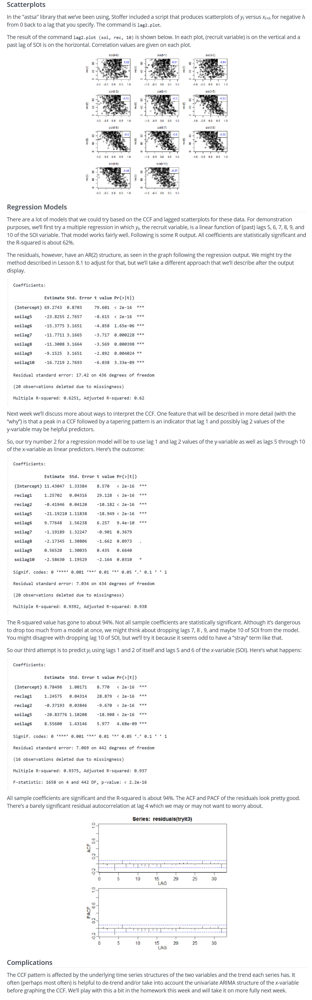

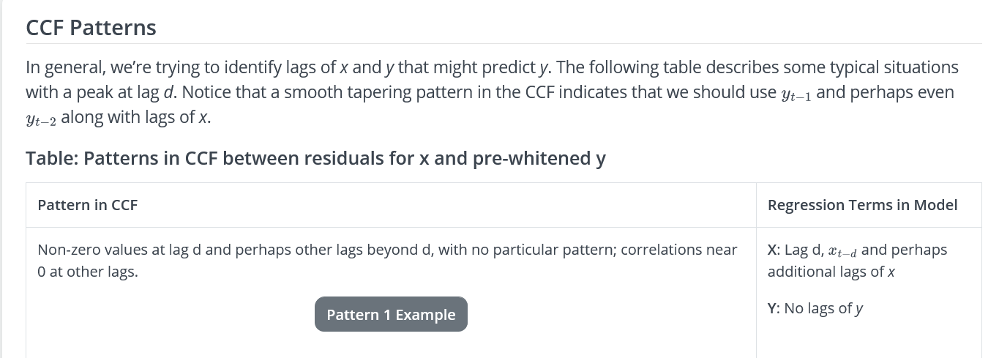

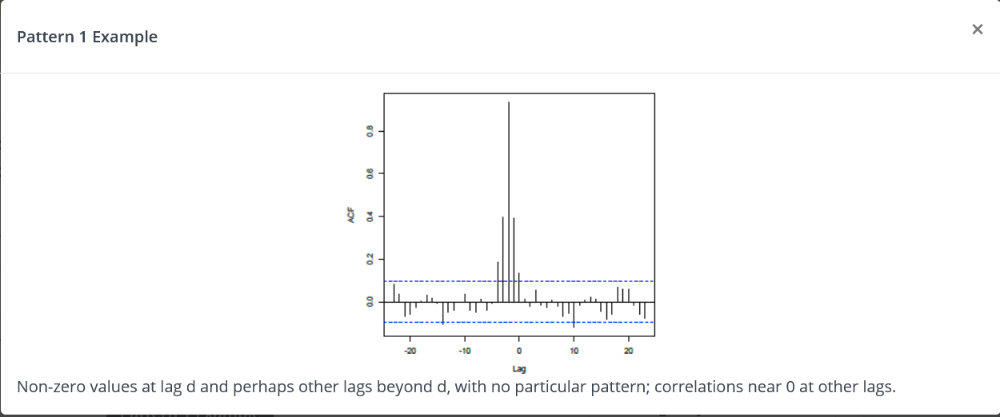

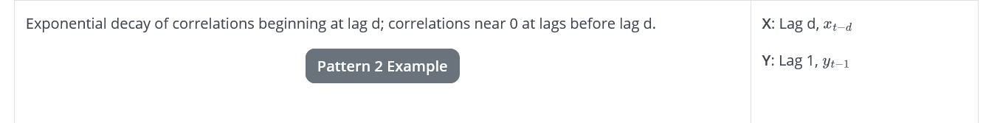

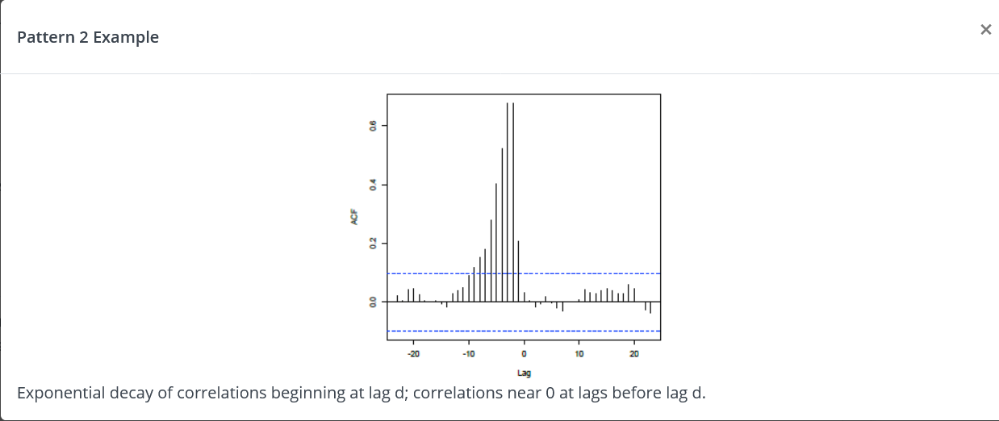

...

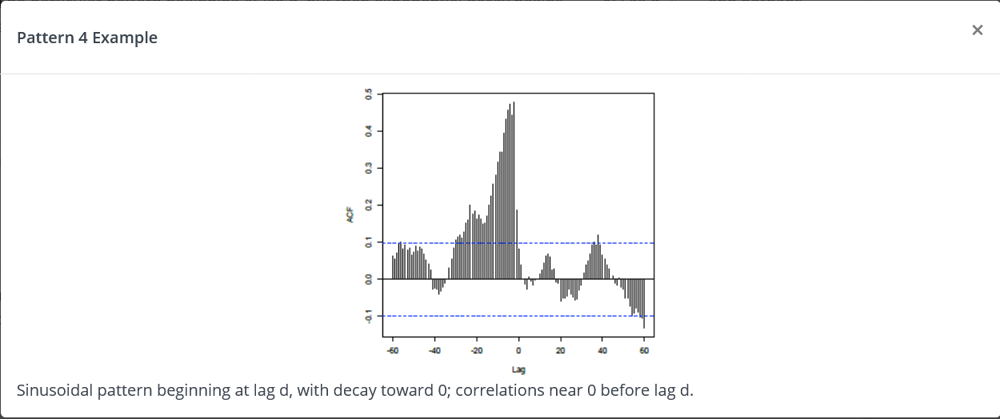

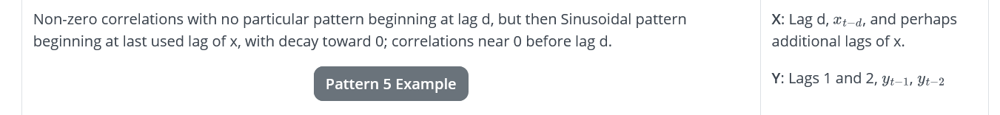

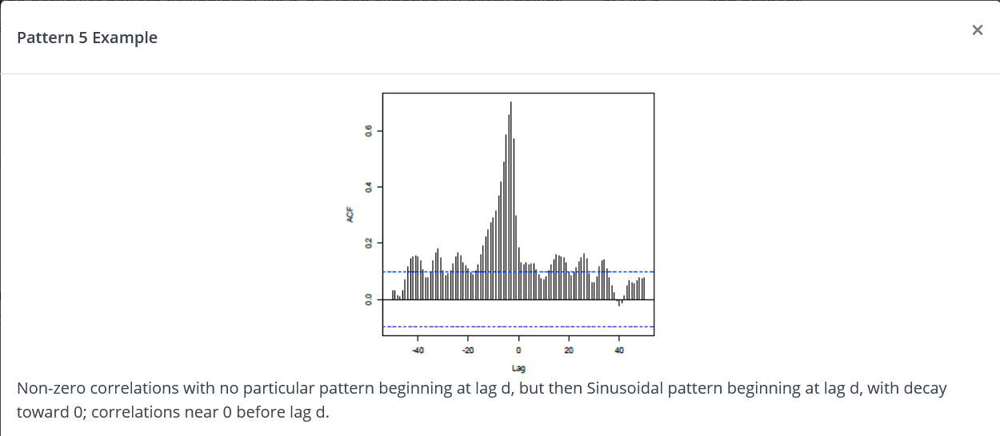

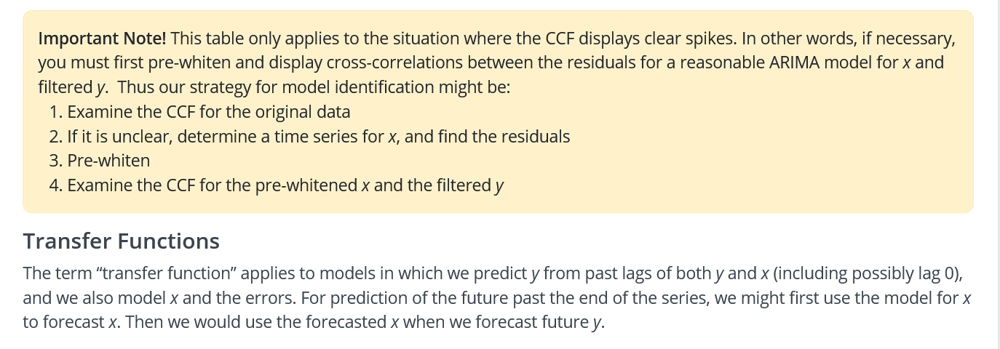

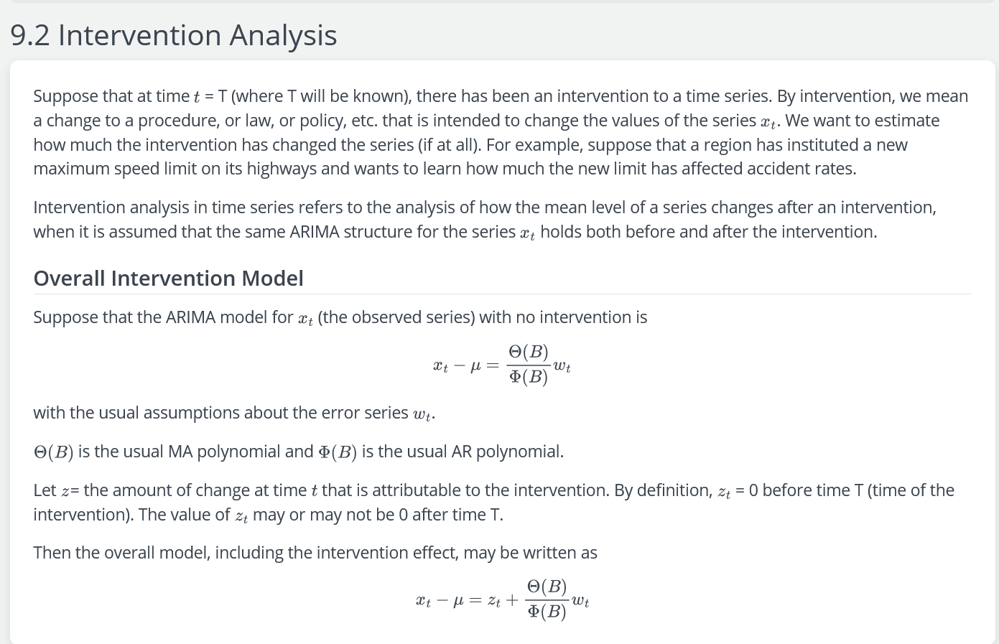

https://pyflux.readthedocs.io/en/latest/arimax.html

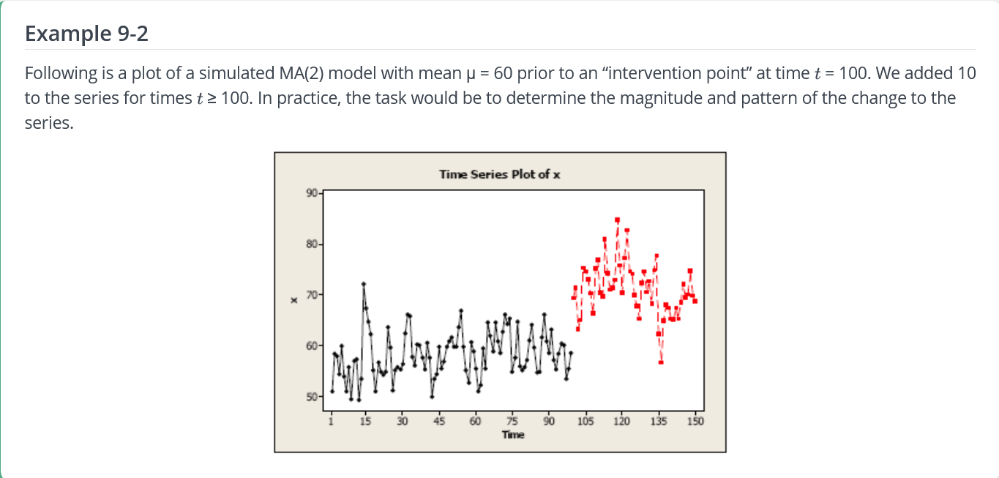

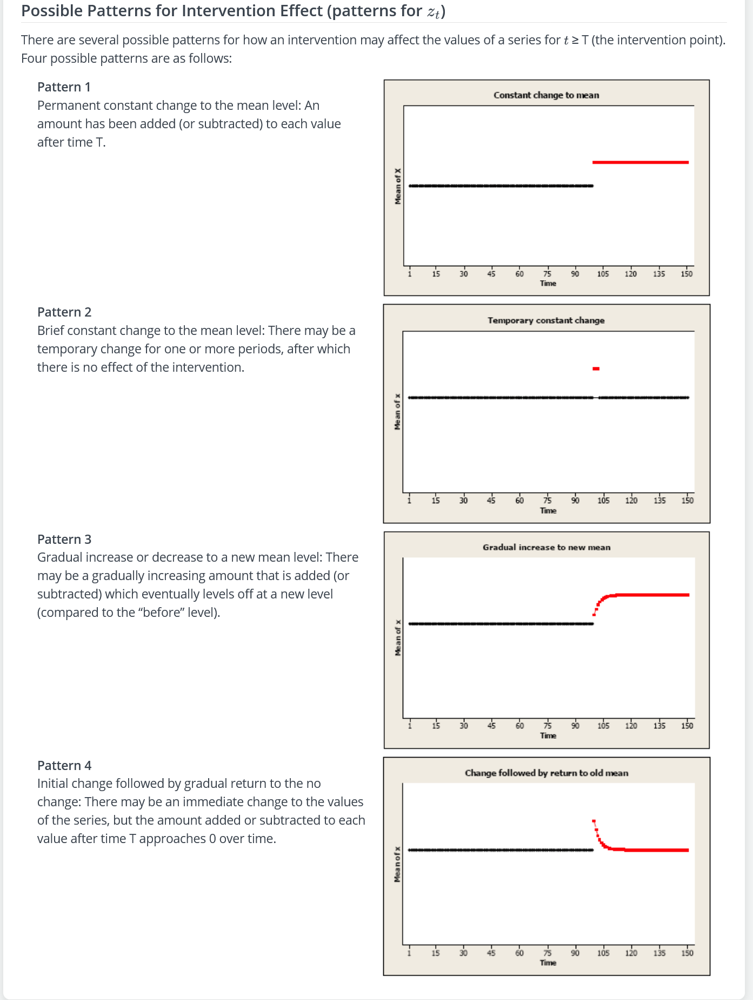

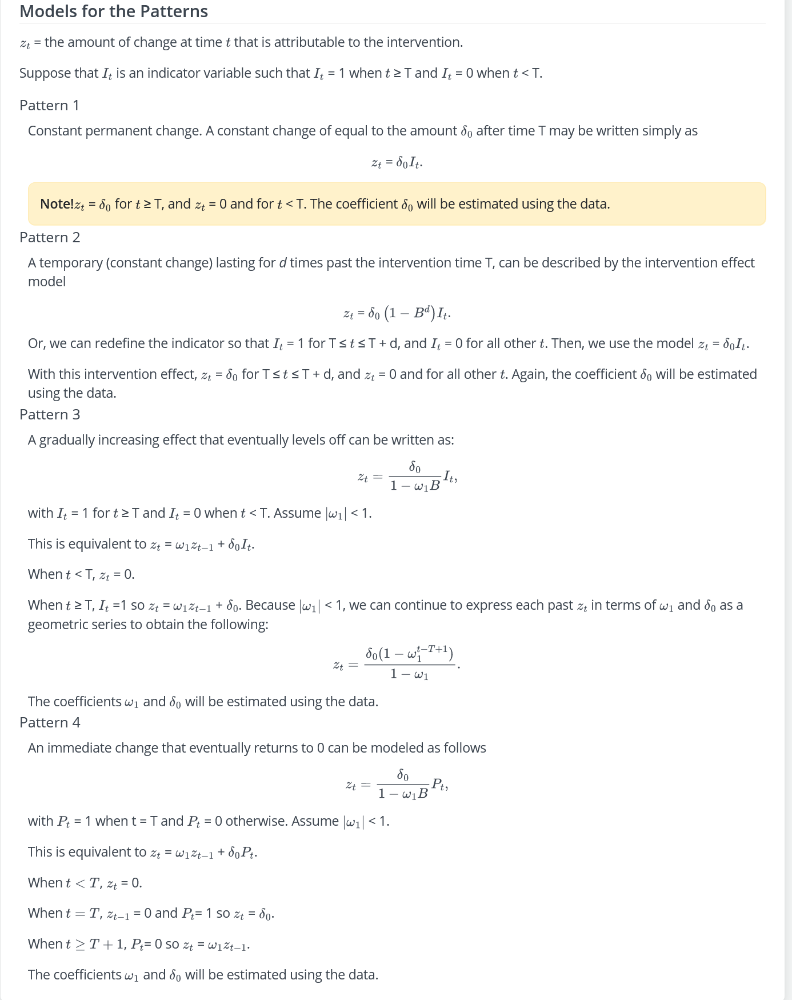

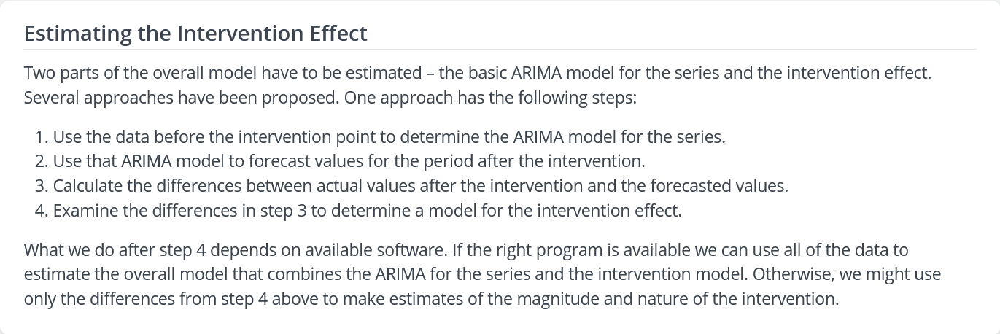

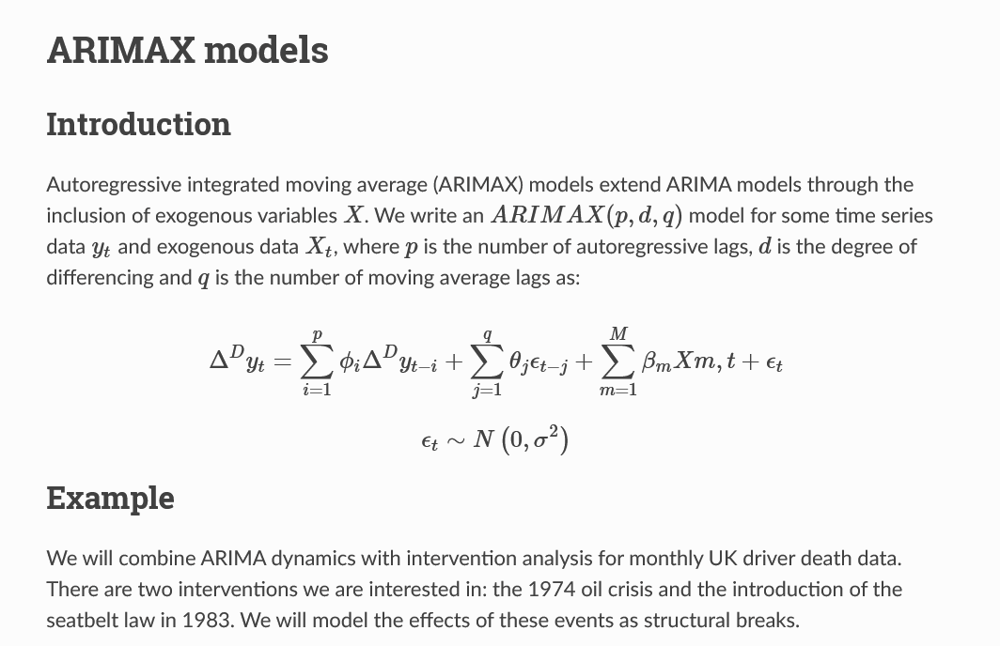

In [270]:
!pip install git+https://github.com/RJT1990/pyflux

  Cloning https://github.com/RJT1990/pyflux to c:\users\estad\appdata\local\temp\pip-req-build-ix9iifps

  Running command git clone -q https://github.com/RJT1990/pyflux 'C:\Users\estad\AppData\Local\Temp\pip-req-build-ix9iifps'
  ERROR: Command errored out with exit status 1:
   command: 'C:\Users\estad\anaconda3\python.exe' -u -c 'import io, os, sys, setuptools, tokenize; sys.argv[0] = '"'"'C:\\Users\\estad\\AppData\\Local\\Temp\\pip-req-build-ix9iifps\\setup.py'"'"'; __file__='"'"'C:\\Users\\estad\\AppData\\Local\\Temp\\pip-req-build-ix9iifps\\setup.py'"'"';f = getattr(tokenize, '"'"'open'"'"', open)(__file__) if os.path.exists(__file__) else io.StringIO('"'"'from setuptools import setup; setup()'"'"');code = f.read().replace('"'"'\r\n'"'"', '"'"'\n'"'"');f.close();exec(compile(code, __file__, '"'"'exec'"'"'))' bdist_wheel -d 'C:\Users\estad\AppData\Local\Temp\pip-wheel-ae305r4k'
       cwd: C:\Users\estad\AppData\Local\Temp\pip-req-build-ix9iifps\
  Complete output (154 lines):
  Cythonizing sources
  pyflux
  pyflux\arma\arma_recursions.pyx has not changed
  pyflux\arma\nn_architectu


  Resolved https://github.com/RJT1990/pyflux to commit 297f2afc2095acd97c12e827dd500e8ea5da0c0f
  Running setup.py clean for pyflux
Failed to build pyflux
    Running setup.py install for pyflux: started
    Running setup.py install for pyflux: finished with status 'error'


In [271]:
import numpy as np
import pandas as pd
import pyflux as pf
from datetime import datetime
import matplotlib.pyplot as plt
%matplotlib inline

ModuleNotFoundError: No module named 'pyflux'

In [272]:
data = pd.read_csv("https://vincentarelbundock.github.io/Rdatasets/csv/MASS/drivers.csv")
data

,Unnamed: 0,time,value
0,1,1969.000000,1687
1,2,1969.083333,1508
2,3,1969.166667,1507
3,4,1969.250000,1385
4,5,1969.333333,1632
...,...,...,...
187,188,1984.583333,1284
188,189,1984.666667,1444
189,190,1984.750000,1575
190,191,1984.833333,1737


In [274]:

data.index = data['time'];
data

,Unnamed: 0,time,value
time,,,
1969.000000,1,1969.000000,1687
1969.083333,2,1969.083333,1508
1969.166667,3,1969.166667,1507
1969.250000,4,1969.250000,1385
1969.333333,5,1969.333333,1632
...,...,...,...
1984.583333,188,1984.583333,1284
1984.666667,189,1984.666667,1444
1984.750000,190,1984.750000,1575


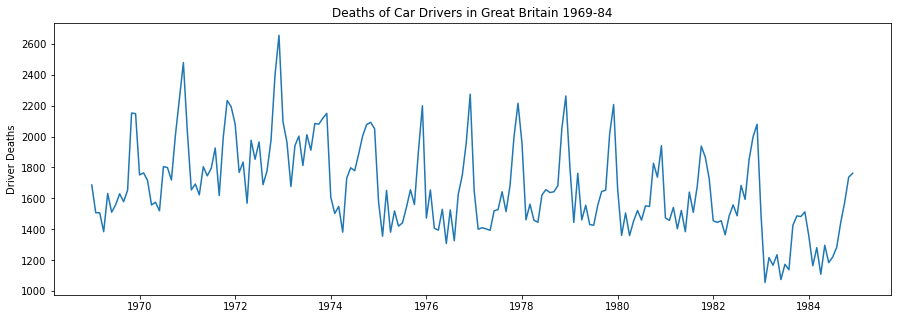

In [276]:

data.loc[(data['time']>=1983.05), 'seat_belt'] = 1;
data.loc[(data['time']<1983.05), 'seat_belt'] = 0;
data.loc[(data['time']>=1974.00), 'oil_crisis'] = 1;
data.loc[(data['time']<1974.00), 'oil_crisis'] = 0;
plt.figure(figsize=(15,5));
plt.plot(data.index,data['value']);
plt.ylabel('Driver Deaths');
plt.title('Deaths of Car Drivers in Great Britain 1969-84');
plt.plot();

In [277]:
data

,Unnamed: 0,time,value,seat_belt,oil_crisis
time,,,,,
1969.000000,1,1969.000000,1687,0.0,0.0
1969.083333,2,1969.083333,1508,0.0,0.0
1969.166667,3,1969.166667,1507,0.0,0.0
1969.250000,4,1969.250000,1385,0.0,0.0
1969.333333,5,1969.333333,1632,0.0,0.0
...,...,...,...,...,...
1984.583333,188,1984.583333,1284,1.0,1.0
1984.666667,189,1984.666667,1444,1.0,1.0
1984.750000,190,1984.750000,1575,1.0,1.0


In [282]:
my_order = (1, 1, 1)
modelo=sm.tsa.statespace.SARIMAX(np.asarray(data.value),exog=np.asarray(data.seat_belt), 
order=my_order)
results=modelo.fit()
print(results.summary
      

                               SARIMAX Results                                
Dep. Variable:                      y   No. Observations:                  192
Model:               SARIMAX(1, 1, 1)   Log Likelihood               -1283.652
Date:                Wed, 19 Jan 2022   AIC                           2575.303
Time:                        08:57:17   BIC                           2588.313
Sample:                             0   HQIC                          2580.573
                                - 192                                         
Covariance Type:                  opg                                         
                 coef    std err          z      P>|z|      [0.025      0.975]
------------------------------------------------------------------------------
x1          -435.8671    220.787     -1.974      0.048    -868.602      -3.133
ar.L1          0.6347      0.050     12.771      0.000       0.537       0.732
ma.L1         -0.9787      0.023    -41.939      0.0

In [283]:
exogenous_features = ['seat_belt','oil_crisis']

In [285]:
model = auto_arima(data.value, exogenous=data[exogenous_features], trace=True, error_action="ignore", suppress_warnings=True)
model.fit(data.value, exogenous=data[exogenous_features])

Performing stepwise search to minimize aic
 ARIMA(2,0,2)(0,0,0)[0] intercept   : AIC=inf, Time=0.38 sec
 ARIMA(0,0,0)(0,0,0)[0] intercept   : AIC=2655.829, Time=0.06 sec
 ARIMA(1,0,0)(0,0,0)[0] intercept   : AIC=2578.675, Time=0.13 sec
 ARIMA(0,0,1)(0,0,0)[0] intercept   : AIC=inf, Time=0.10 sec
 ARIMA(0,0,0)(0,0,0)[0]             : AIC=3228.276, Time=0.05 sec
 ARIMA(2,0,0)(0,0,0)[0] intercept   : AIC=2583.073, Time=0.25 sec
 ARIMA(1,0,1)(0,0,0)[0] intercept   : AIC=2579.624, Time=0.30 sec
 ARIMA(2,0,1)(0,0,0)[0] intercept   : AIC=inf, Time=0.29 sec
 ARIMA(1,0,0)(0,0,0)[0]             : AIC=inf, Time=0.13 sec

Best model:  ARIMA(1,0,0)(0,0,0)[0] intercept
Total fit time: 1.727 seconds


ARIMA(order=(1, 0, 0), scoring_args={}, suppress_warnings=True)

In [294]:

modelo=sm.tsa.statespace.SARIMAX(data.value,exog=data[exogenous_features], 
order=(1,1,1), seasonal_order=(1,1,1,12))
results=modelo.fit(disp=False, maxiter=250)
print(results.summary())

                                     SARIMAX Results                                      
Dep. Variable:                              value   No. Observations:                  192
Model:             SARIMAX(1, 1, 1)x(1, 1, 1, 12)   Log Likelihood               -1130.784
Date:                            Wed, 19 Jan 2022   AIC                           2275.569
Time:                                    16:26:15   BIC                           2297.881
Sample:                                         0   HQIC                          2284.616
                                            - 192                                         
Covariance Type:                              opg                                         
                 coef    std err          z      P>|z|      [0.025      0.975]
------------------------------------------------------------------------------
seat_belt   -329.4878    128.462     -2.565      0.010    -581.269     -77.706
oil_crisis  -212.1559     70.550   

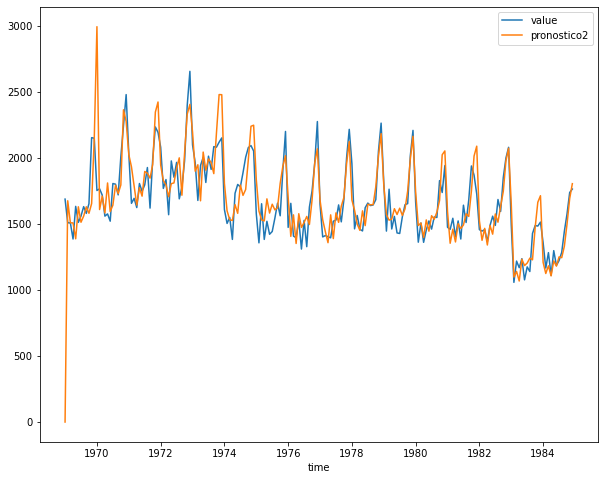

In [297]:
data['pronostico2'] = results.fittedvalues
plot = data[['value', 'pronostico2']][1:].plot(figsize=(10, 8)) 

In [341]:
mod = sm.tsa.statespace.SARIMAX(data.value,order=(1,1,1),seasonal_order=(1,1,1,12),exog = data[exogenous_features],
                                       enforce_stationarity=False, enforce_invertibility=False).fit()
print(mod.summary())

                                     SARIMAX Results                                      
Dep. Variable:                              value   No. Observations:                  192
Model:             SARIMAX(1, 1, 1)x(1, 1, 1, 12)   Log Likelihood               -1040.469
Date:                            Wed, 19 Jan 2022   AIC                           2094.939
Time:                                    17:47:38   BIC                           2116.680
Sample:                                         0   HQIC                          2103.764
                                            - 192                                         
Covariance Type:                              opg                                         
                 coef    std err          z      P>|z|      [0.025      0.975]
------------------------------------------------------------------------------
seat_belt   -308.4058    115.358     -2.673      0.008    -534.504     -82.308
oil_crisis  -214.5575     72.407   

In [356]:
pred = mod.get_prediction(23,exog =exogenous_features)
pred

In [357]:
pred.predicted_mean

time
1970.916667    2286.992870
1971.000000    1964.963957
1971.083333    1936.733670
1971.166667    1750.247782
1971.250000    1608.380789
                  ...     
1984.583333    1239.517177
1984.666667    1321.149551
1984.750000    1491.775631
1984.833333    1685.017410
1984.916667    1798.528693
Name: predicted_mean, Length: 169, dtype: float64

## ARIMAX

In [44]:
train = pd.read_csv('train.csv' ,parse_dates=['date'],index_col='date')#('../input/train.csv' ,parse_dates=['date'],index_col='date')
test = pd.read_csv('test.csv', parse_dates=['date'],index_col='date')#('../input/test.csv', parse_dates=['date'],index_col='date')
train

,store,item,sales
date,,,
2013-01-01,1,1,13
2013-01-02,1,1,11
2013-01-03,1,1,14
2013-01-04,1,1,13
2013-01-05,1,1,10
...,...,...,...
2017-12-27,10,50,63
2017-12-28,10,50,59
2017-12-29,10,50,74


In [45]:
test

,id,store,item
date,,,
2018-01-01,0,1,1
2018-01-02,1,1,1
2018-01-03,2,1,1
2018-01-04,3,1,1
2018-01-05,4,1,1
...,...,...,...
2018-03-27,44995,10,50
2018-03-28,44996,10,50
2018-03-29,44997,10,50


In [46]:
df = pd.concat([train,test],sort=True)
df.head()

,id,item,sales,store
date,,,,
2013-01-01,NaN,1,13.0,1
2013-01-02,NaN,1,11.0,1
2013-01-03,NaN,1,14.0,1
2013-01-04,NaN,1,13.0,1
2013-01-05,NaN,1,10.0,1


In [47]:
buf = df[(df.item==1)&(df.store==1)].copy()
buf

,id,item,sales,store
date,,,,
2013-01-01,NaN,1,13.0,1
2013-01-02,NaN,1,11.0,1
2013-01-03,NaN,1,14.0,1
2013-01-04,NaN,1,13.0,1
2013-01-05,NaN,1,10.0,1
...,...,...,...,...
2018-03-27,85.0,1,NaN,1
2018-03-28,86.0,1,NaN,1
2018-03-29,87.0,1,NaN,1


Let's see overview of the data.  
We can use seasonal_decompose method to separate into four graphs(Observed,Trend,Seasonal,Residual).  
What is seasonal_decompose method parameter 'freq'?
- freq = 365 : trend of year.  
- freq = 30 : trend of month.  
- freq = 7 : trend of week.  

We choose 'freq=365' ,because this data is long term.

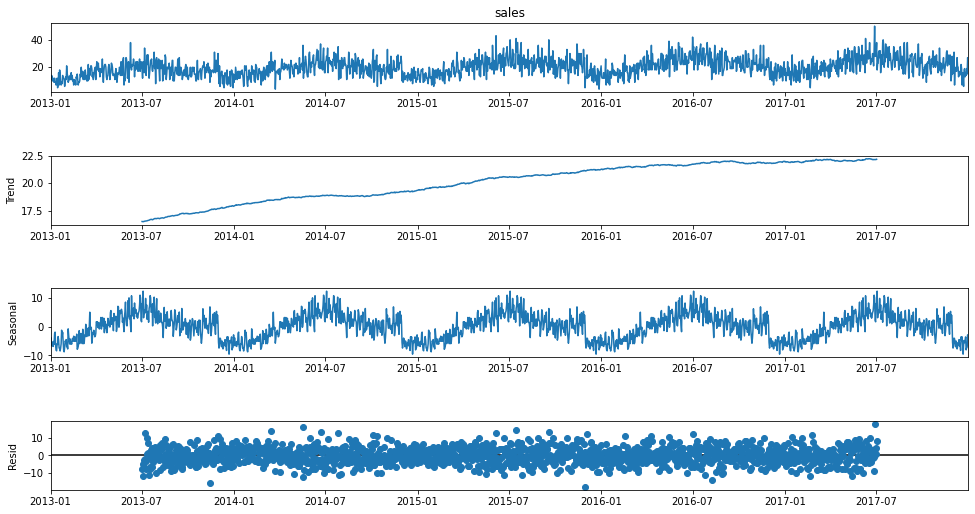

In [48]:
res = sm.tsa.seasonal_decompose(buf.sales.dropna(),freq=365)
fig = res.plot()
fig.set_figheight(8)
fig.set_figwidth(15)
plt.show()

In [49]:
buf.head()

,id,item,sales,store
date,,,,
2013-01-01,NaN,1,13.0,1
2013-01-02,NaN,1,11.0,1
2013-01-03,NaN,1,14.0,1
2013-01-04,NaN,1,13.0,1
2013-01-05,NaN,1,10.0,1


In [50]:
buf.tail()

,id,item,sales,store
date,,,,
2018-03-27,85.0,1,NaN,1
2018-03-28,86.0,1,NaN,1
2018-03-29,87.0,1,NaN,1
2018-03-30,88.0,1,NaN,1
2018-03-31,89.0,1,NaN,1


In [51]:
#train_test_split
tr_start,tr_end = '2014-01-01','2017-09-30'
te_start,te_end = '2017-10-01','2017-12-31'
tra = buf['sales'][tr_start:tr_end].dropna()
tes = buf['sales'][te_start:te_end].dropna()

In [52]:
tra

date
2014-01-01     9.0
2014-01-02    14.0
2014-01-03    11.0
2014-01-04    20.0
2014-01-05    17.0
              ... 
2017-09-26    18.0
2017-09-27    27.0
2017-09-28    23.0
2017-09-29    28.0
2017-09-30    30.0
Name: sales, Length: 1369, dtype: float64

In [53]:
tes

date
2017-10-01    21.0
2017-10-02    12.0
2017-10-03    18.0
2017-10-04    15.0
2017-10-05    20.0
              ... 
2017-12-27    14.0
2017-12-28    19.0
2017-12-29    15.0
2017-12-30    27.0
2017-12-31    23.0
Name: sales, Length: 92, dtype: float64

In [54]:
#ADF-test(Original-time-series)
res = sm.tsa.adfuller(buf['sales'].dropna(),regression='ct')
print('p-value:{}'.format(res[1]))

p-value:0.07610688992415186


In [55]:
#ADF-test(differenced-time-series)
res = sm.tsa.adfuller(buf['sales'].diff().dropna(),regression='c')
print('p-value:{}'.format(res[1]))

p-value:1.2109276320434823e-23


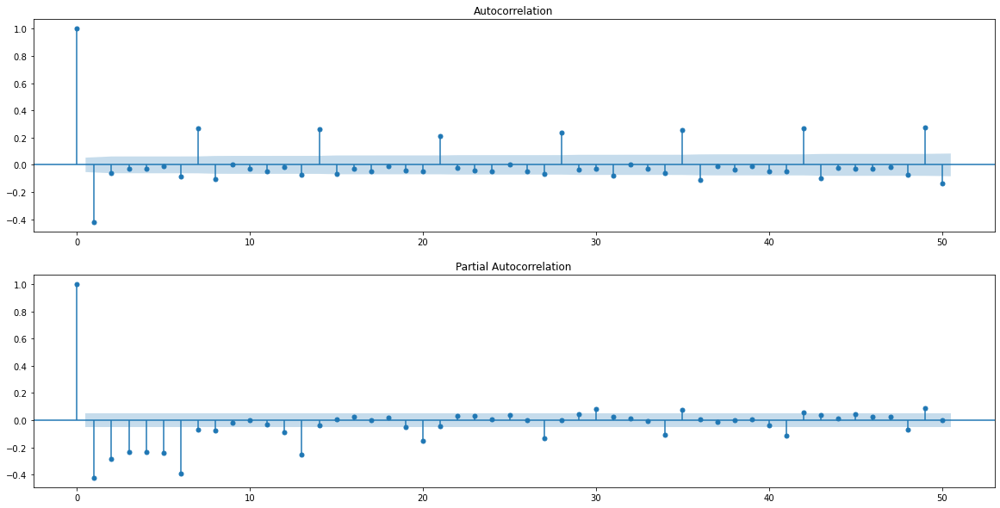

In [56]:
#we use tra.diff()(differenced data), because this time series is unit root process.
fig,ax = plt.subplots(2,1,figsize=(20,10))
fig = sm.graphics.tsa.plot_acf(tra.diff().dropna(), lags=50, ax=ax[0])
fig = sm.graphics.tsa.plot_pacf(tra.diff().dropna(), lags=50, ax=ax[1])
plt.show()

resDiff = sm.tsa.arma_order_select_ic(tra, max_ar=7, max_ma=7, ic='aic', trend='c')
print('ARMA(p,q) =',resDiff['aic_min_order'],'is the best.')

In [57]:
arima = sm.tsa.statespace.SARIMAX(tra,order=(7,1,7),freq='D',seasonal_order=(0,0,0,0),
                                 enforce_stationarity=False, enforce_invertibility=False,).fit()
arima.summary()
#We can use SARIMAX model as ARIMAX when seasonal_order is (0,0,0,0) .

<class 'statsmodels.iolib.summary.Summary'>
"""
                               SARIMAX Results                                
==============================================================================
Dep. Variable:                  sales   No. Observations:                 1369
Model:               SARIMAX(7, 1, 7)   Log Likelihood               -4068.978
Date:                Wed, 19 Jan 2022   AIC                           8167.956
Time:                        18:44:36   BIC                           8246.185
Sample:                    01-01-2014   HQIC                          8197.242
                         - 09-30-2017                                         
Covariance Type:                  opg                                         
==============================================================================
                 coef    std err          z      P>|z|      [0.025      0.975]
------------------------------------------------------------------------------
ar.L1         -0.8901      0.037    -24.043      0.000      -0.963      -0.818
ar.L2         -0.8953      0.036    -24.738      0.000      -0.966      -0.824
ar.L3         -0.8909      0.036    -24.432      0.000      -0.962      -0.819
ar.L4         -0.8868      0.037    -24.174      0.000      -0.959      -0.815
ar.L5         -0.8949      0.035    -25.359      0.000      -0.964      -0.826
ar.L6         -0.8868      0.037    -24.089      0.000      -0.959      -0.815
ar.L7          0.1009      0.035      2.867      0.004       0.032       0.170
ma.L1          0.0431      0.026      1.641      0.101      -0.008       0.095
ma.L2          0.0941      0.058      1.620      0.105      -0.020       0.208
ma.L3          0.0343      0.040      0.853      0.394      -0.044       0.113
ma.L4          0.0550      0.039      1.403      0.161      -0.022       0.132
ma.L5          0.1046      0.055      1.887      0.059      -0.004       0.213
ma.L6          0.0729      0.027      2.719      0.007       0.020       0.125
ma.L7         -0.8514      0.054    -15.790      0.000      -0.957      -0.746
sigma2        24.7731      1.768     14.014      0.000      21.309      28.238
===================================================================================
Ljung-Box (L1) (Q):                   2.50   Jarque-Bera (JB):                 9.72
Prob(Q):                              0.11   Prob(JB):                         0.01
Heteroskedasticity (H):               1.35   Skew:                             0.14
Prob(H) (two-sided):                  0.00   Kurtosis:                         3.31
===================================================================================

Warnings:
[1] Covariance matrix calculated using the outer product of gradients (complex-step).
"""

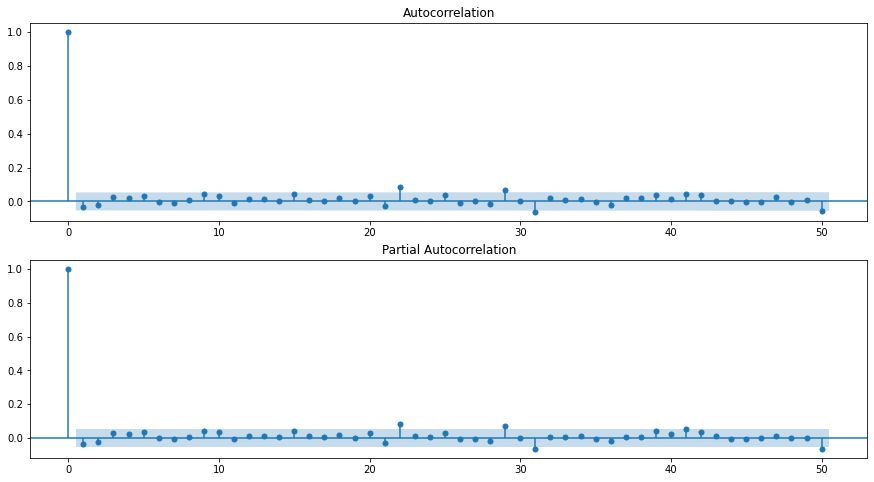

In [58]:
res = arima.resid
fig,ax = plt.subplots(2,1,figsize=(15,8))
fig = sm.graphics.tsa.plot_acf(res, lags=50, ax=ax[0])
fig = sm.graphics.tsa.plot_pacf(res, lags=50, ax=ax[1])
plt.show()

In [59]:
from sklearn.metrics import mean_squared_error
pred = arima.predict(tr_end,te_end)[1:]
print('ARIMA model MSE:{}'.format(mean_squared_error(tes,pred)))

ARIMA model MSE:45.42872514974147


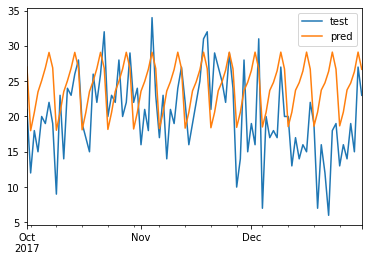

In [60]:
pd.DataFrame({'test':tes,'pred':pred}).plot();plt.show()

Let's try to make some features.
- month
- dayofweek
- sales_shifted_364(1year_shift)
- sales_shifted_728(2year_shift)

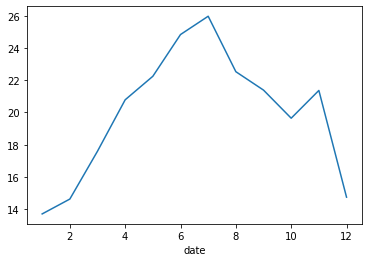

In [61]:
buf.groupby(buf.index.month).sales.mean().plot();plt.show()

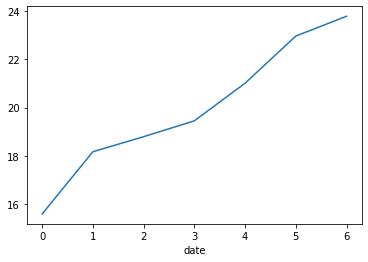

In [62]:
buf.groupby(buf.index.weekday).sales.mean().plot();plt.show()

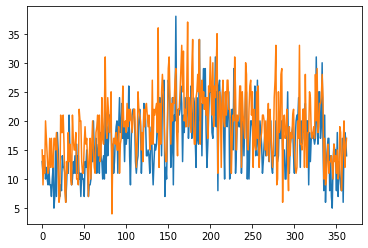

In [63]:
plt.plot(buf[0:363].sales.dropna().values)
plt.plot(buf[364:727].sales.dropna().values);plt.show()

In [64]:
buf

,id,item,sales,store
date,,,,
2013-01-01,NaN,1,13.0,1
2013-01-02,NaN,1,11.0,1
2013-01-03,NaN,1,14.0,1
2013-01-04,NaN,1,13.0,1
2013-01-05,NaN,1,10.0,1
...,...,...,...,...
2018-03-27,85.0,1,NaN,1
2018-03-28,86.0,1,NaN,1
2018-03-29,87.0,1,NaN,1


In [65]:
buf = df[(df.item==1)&(df.store==1)].copy()#reset buf
#month one hot encoding
buf['month'] = buf.index.month
month_dummies = pd.get_dummies(buf['month'])
month_dummies.columns = ['month-'+ str(m) for m in range(1,13)]
buf = pd.concat([buf, month_dummies], axis=1).drop(['month'],axis=1)
#dayofweek one hot encoding
buf['dayofweek'] = buf.index.weekday
week_dummies = pd.get_dummies(buf['dayofweek'])
week_dummies.columns = ['dayofweek-'+ str(w) for w in range(0,7)]
buf = pd.concat([buf, week_dummies], axis=1).drop(['dayofweek'],axis=1)
#Satday,Sunday
buf['weekend'] = (buf.index.dayofweek>4).astype(int)#Satday,Sunday
#Sunday
#buf['sunday'] = (buf.index.dayofweek==6).astype(int)#Satday,Sunday

In [66]:
buf

,id,item,sales,store,month-1,month-2,month-3,month-4,month-5,month-6,...,month-11,month-12,dayofweek-0,dayofweek-1,dayofweek-2,dayofweek-3,dayofweek-4,dayofweek-5,dayofweek-6,weekend
date,,,,,,,,,,,,,,,,,,,,,
2013-01-01,NaN,1,13.0,1,1,0,0,0,0,0,...,0,0,0,1,0,0,0,0,0,0
2013-01-02,NaN,1,11.0,1,1,0,0,0,0,0,...,0,0,0,0,1,0,0,0,0,0
2013-01-03,NaN,1,14.0,1,1,0,0,0,0,0,...,0,0,0,0,0,1,0,0,0,0
2013-01-04,NaN,1,13.0,1,1,0,0,0,0,0,...,0,0,0,0,0,0,1,0,0,0
2013-01-05,NaN,1,10.0,1,1,0,0,0,0,0,...,0,0,0,0,0,0,0,1,0,1
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2018-03-27,85.0,1,NaN,1,0,0,1,0,0,0,...,0,0,0,1,0,0,0,0,0,0
2018-03-28,86.0,1,NaN,1,0,0,1,0,0,0,...,0,0,0,0,1,0,0,0,0,0
2018-03-29,87.0,1,NaN,1,0,0,1,0,0,0,...,0,0,0,0,0,1,0,0,0,0


In [67]:
#shifted data
#buf['sales_shifted_91'] = buf.sales.shift(91)
buf['sales_shifted_728'] = buf.sales.shift(728)
buf['sales_shifted_364'] = buf.sales.shift(364)
buf

,id,item,sales,store,month-1,month-2,month-3,month-4,month-5,month-6,...,dayofweek-0,dayofweek-1,dayofweek-2,dayofweek-3,dayofweek-4,dayofweek-5,dayofweek-6,weekend,sales_shifted_728,sales_shifted_364
date,,,,,,,,,,,,,,,,,,,,,
2013-01-01,NaN,1,13.0,1,1,0,0,0,0,0,...,0,1,0,0,0,0,0,0,NaN,NaN
2013-01-02,NaN,1,11.0,1,1,0,0,0,0,0,...,0,0,1,0,0,0,0,0,NaN,NaN
2013-01-03,NaN,1,14.0,1,1,0,0,0,0,0,...,0,0,0,1,0,0,0,0,NaN,NaN
2013-01-04,NaN,1,13.0,1,1,0,0,0,0,0,...,0,0,0,0,1,0,0,0,NaN,NaN
2013-01-05,NaN,1,10.0,1,1,0,0,0,0,0,...,0,0,0,0,0,1,0,1,NaN,NaN
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2018-03-27,85.0,1,NaN,1,0,0,1,0,0,0,...,0,1,0,0,0,0,0,0,22.0,13.0
2018-03-28,86.0,1,NaN,1,0,0,1,0,0,0,...,0,0,1,0,0,0,0,0,14.0,12.0
2018-03-29,87.0,1,NaN,1,0,0,1,0,0,0,...,0,0,0,1,0,0,0,0,17.0,22.0


In [68]:
tr_start,tr_end = '2015-01-01','2017-09-30'
te_start,te_end = '2017-10-01','2017-12-31'
tra = buf['sales'][tr_start:tr_end].dropna()
tes = buf['sales'][te_start:te_end].dropna()
exog_train = buf.drop(['id','store','item','sales'],axis = 1)[tr_start:tr_end].dropna()
exog_test = buf.drop(['id','store','item','sales'],axis = 1)[te_start:te_end].dropna()

In [69]:
exog_train

,month-1,month-2,month-3,month-4,month-5,month-6,month-7,month-8,month-9,month-10,...,dayofweek-0,dayofweek-1,dayofweek-2,dayofweek-3,dayofweek-4,dayofweek-5,dayofweek-6,weekend,sales_shifted_728,sales_shifted_364
date,,,,,,,,,,,,,,,,,,,,,
2015-01-01,1,0,0,0,0,0,0,0,0,0,...,0,0,0,1,0,0,0,0,14.0,14.0
2015-01-02,1,0,0,0,0,0,0,0,0,0,...,0,0,0,0,1,0,0,0,13.0,11.0
2015-01-03,1,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,1,0,1,10.0,20.0
2015-01-04,1,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,1,1,12.0,17.0
2015-01-05,1,0,0,0,0,0,0,0,0,0,...,1,0,0,0,0,0,0,0,10.0,14.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2017-09-26,0,0,0,0,0,0,0,0,1,0,...,0,1,0,0,0,0,0,0,19.0,18.0
2017-09-27,0,0,0,0,0,0,0,0,1,0,...,0,0,1,0,0,0,0,0,15.0,27.0
2017-09-28,0,0,0,0,0,0,0,0,1,0,...,0,0,0,1,0,0,0,0,25.0,28.0


In [70]:
exog_test

,month-1,month-2,month-3,month-4,month-5,month-6,month-7,month-8,month-9,month-10,...,dayofweek-0,dayofweek-1,dayofweek-2,dayofweek-3,dayofweek-4,dayofweek-5,dayofweek-6,weekend,sales_shifted_728,sales_shifted_364
date,,,,,,,,,,,,,,,,,,,,,
2017-10-01,0,0,0,0,0,0,0,0,0,1,...,0,0,0,0,0,0,1,1,22.0,26.0
2017-10-02,0,0,0,0,0,0,0,0,0,1,...,1,0,0,0,0,0,0,0,13.0,20.0
2017-10-03,0,0,0,0,0,0,0,0,0,1,...,0,1,0,0,0,0,0,0,14.0,28.0
2017-10-04,0,0,0,0,0,0,0,0,0,1,...,0,0,1,0,0,0,0,0,19.0,17.0
2017-10-05,0,0,0,0,0,0,0,0,0,1,...,0,0,0,1,0,0,0,0,21.0,22.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2017-12-27,0,0,0,0,0,0,0,0,0,0,...,0,0,1,0,0,0,0,0,15.0,16.0
2017-12-28,0,0,0,0,0,0,0,0,0,0,...,0,0,0,1,0,0,0,0,18.0,21.0
2017-12-29,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,1,0,0,0,21.0,24.0


In [71]:
#outlier etc...
buf['outlier_flag']=0
buf.loc[buf.index == '2017-06-28','outlier_flag']=1
buf

,id,item,sales,store,month-1,month-2,month-3,month-4,month-5,month-6,...,dayofweek-1,dayofweek-2,dayofweek-3,dayofweek-4,dayofweek-5,dayofweek-6,weekend,sales_shifted_728,sales_shifted_364,outlier_flag
date,,,,,,,,,,,,,,,,,,,,,
2013-01-01,NaN,1,13.0,1,1,0,0,0,0,0,...,1,0,0,0,0,0,0,NaN,NaN,0
2013-01-02,NaN,1,11.0,1,1,0,0,0,0,0,...,0,1,0,0,0,0,0,NaN,NaN,0
2013-01-03,NaN,1,14.0,1,1,0,0,0,0,0,...,0,0,1,0,0,0,0,NaN,NaN,0
2013-01-04,NaN,1,13.0,1,1,0,0,0,0,0,...,0,0,0,1,0,0,0,NaN,NaN,0
2013-01-05,NaN,1,10.0,1,1,0,0,0,0,0,...,0,0,0,0,1,0,1,NaN,NaN,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2018-03-27,85.0,1,NaN,1,0,0,1,0,0,0,...,1,0,0,0,0,0,0,22.0,13.0,0
2018-03-28,86.0,1,NaN,1,0,0,1,0,0,0,...,0,1,0,0,0,0,0,14.0,12.0,0
2018-03-29,87.0,1,NaN,1,0,0,1,0,0,0,...,0,0,1,0,0,0,0,17.0,22.0,0


In [72]:
tr_start,tr_end = '2015-01-01','2017-09-30'
te_start,te_end = '2017-10-01','2017-12-31'
tra = buf['sales'][tr_start:tr_end].dropna()
tes = buf['sales'][te_start:te_end].dropna()
exog_train = buf.drop(['id','store','item','sales'],axis = 1)[tr_start:tr_end].dropna()
exog_test = buf.drop(['id','store','item','sales'],axis = 1)[te_start:te_end].dropna()


In [73]:
exog_train

,month-1,month-2,month-3,month-4,month-5,month-6,month-7,month-8,month-9,month-10,...,dayofweek-1,dayofweek-2,dayofweek-3,dayofweek-4,dayofweek-5,dayofweek-6,weekend,sales_shifted_728,sales_shifted_364,outlier_flag
date,,,,,,,,,,,,,,,,,,,,,
2015-01-01,1,0,0,0,0,0,0,0,0,0,...,0,0,1,0,0,0,0,14.0,14.0,0
2015-01-02,1,0,0,0,0,0,0,0,0,0,...,0,0,0,1,0,0,0,13.0,11.0,0
2015-01-03,1,0,0,0,0,0,0,0,0,0,...,0,0,0,0,1,0,1,10.0,20.0,0
2015-01-04,1,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,1,1,12.0,17.0,0
2015-01-05,1,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,10.0,14.0,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2017-09-26,0,0,0,0,0,0,0,0,1,0,...,1,0,0,0,0,0,0,19.0,18.0,0
2017-09-27,0,0,0,0,0,0,0,0,1,0,...,0,1,0,0,0,0,0,15.0,27.0,0
2017-09-28,0,0,0,0,0,0,0,0,1,0,...,0,0,1,0,0,0,0,25.0,28.0,0


In [74]:
exog_test

,month-1,month-2,month-3,month-4,month-5,month-6,month-7,month-8,month-9,month-10,...,dayofweek-1,dayofweek-2,dayofweek-3,dayofweek-4,dayofweek-5,dayofweek-6,weekend,sales_shifted_728,sales_shifted_364,outlier_flag
date,,,,,,,,,,,,,,,,,,,,,
2017-10-01,0,0,0,0,0,0,0,0,0,1,...,0,0,0,0,0,1,1,22.0,26.0,0
2017-10-02,0,0,0,0,0,0,0,0,0,1,...,0,0,0,0,0,0,0,13.0,20.0,0
2017-10-03,0,0,0,0,0,0,0,0,0,1,...,1,0,0,0,0,0,0,14.0,28.0,0
2017-10-04,0,0,0,0,0,0,0,0,0,1,...,0,1,0,0,0,0,0,19.0,17.0,0
2017-10-05,0,0,0,0,0,0,0,0,0,1,...,0,0,1,0,0,0,0,21.0,22.0,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2017-12-27,0,0,0,0,0,0,0,0,0,0,...,0,1,0,0,0,0,0,15.0,16.0,0
2017-12-28,0,0,0,0,0,0,0,0,0,0,...,0,0,1,0,0,0,0,18.0,21.0,0
2017-12-29,0,0,0,0,0,0,0,0,0,0,...,0,0,0,1,0,0,0,21.0,24.0,0


In [75]:
buf

,id,item,sales,store,month-1,month-2,month-3,month-4,month-5,month-6,...,dayofweek-1,dayofweek-2,dayofweek-3,dayofweek-4,dayofweek-5,dayofweek-6,weekend,sales_shifted_728,sales_shifted_364,outlier_flag
date,,,,,,,,,,,,,,,,,,,,,
2013-01-01,NaN,1,13.0,1,1,0,0,0,0,0,...,1,0,0,0,0,0,0,NaN,NaN,0
2013-01-02,NaN,1,11.0,1,1,0,0,0,0,0,...,0,1,0,0,0,0,0,NaN,NaN,0
2013-01-03,NaN,1,14.0,1,1,0,0,0,0,0,...,0,0,1,0,0,0,0,NaN,NaN,0
2013-01-04,NaN,1,13.0,1,1,0,0,0,0,0,...,0,0,0,1,0,0,0,NaN,NaN,0
2013-01-05,NaN,1,10.0,1,1,0,0,0,0,0,...,0,0,0,0,1,0,1,NaN,NaN,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2018-03-27,85.0,1,NaN,1,0,0,1,0,0,0,...,1,0,0,0,0,0,0,22.0,13.0,0
2018-03-28,86.0,1,NaN,1,0,0,1,0,0,0,...,0,1,0,0,0,0,0,14.0,12.0,0
2018-03-29,87.0,1,NaN,1,0,0,1,0,0,0,...,0,0,1,0,0,0,0,17.0,22.0,0


In [76]:
tr_end

'2017-09-30'

In [77]:
target_exog = buf[te_start:].drop(['id','store','item','sales'],axis = 1)#exog for predict.

In [86]:
#fitting
mod = sm.tsa.statespace.SARIMAX(tra,order=(7,1,7),seasonal_order=(0,0,0,0),exog = exog_train,freq='D',
                                       enforce_stationarity=False, enforce_invertibility=False).fit()


pred = mod.get_prediction(tr_end,'2018-03-31',exog =target_exog)#pd.concat([exog_test,target_exog]))

pred

In [106]:
prediction4 = mod.get_prediction(
    start=1000, end=2000, dynamic=True, full_results=True, exog=exog_train[100:]).summary_frame()
prediction4

ValueError: Provided exogenous values are not of the appropriate shape. Required (997, 23), got (904, 23).

# EJEMPLO 2 SARIMAX

In [319]:
dataset= pd.read_csv('aapl.csv')
dataset

,Date,Open,High,Low,Close,Adj Close,Volume
0,2008-10-01,3.997143,4.012857,3.835357,3.897143,3.341274,1296484000
1,2008-10-02,3.857500,3.885357,3.571429,3.575000,3.065080,1609364400
2,2008-10-03,3.714286,3.803571,3.380357,3.466786,2.972301,2294398400
3,2008-10-06,3.284286,3.527857,3.126429,3.505000,3.005065,2107417200
4,2008-10-07,3.588571,3.625000,3.176786,3.184286,2.730096,1878772000
...,...,...,...,...,...,...,...
2763,2019-09-24,55.257500,55.622501,54.297501,54.419998,53.462963,124763200
2764,2019-09-25,54.637501,55.375000,54.285000,55.257500,54.285736,87613600
2765,2019-09-26,55.000000,55.235001,54.707500,54.972500,54.005753,75334000
2766,2019-09-27,55.134998,55.240002,54.320000,54.705002,53.742950,101408000


In [320]:
dataset['Mean'] = (dataset['Low'] + dataset['High'])/2
dataset.head(2)

,Date,Open,High,Low,Close,Adj Close,Volume,Mean
0,2008-10-01,3.997143,4.012857,3.835357,3.897143,3.341274,1296484000,3.924107
1,2008-10-02,3.857500,3.885357,3.571429,3.575000,3.065080,1609364400,3.728393


In [321]:
dataset.shape

(2768, 8)

We need to predict the stock prices today based on the data from yesterday. Predicting stock prices for Oct 2, 2008, should be based on Oct 1, 2008 data.

We need to restructure the data set by adding a target column ‘Actual’, which will the stock prices for the next day.

If we need to take data from 2 days previous for prediction, then adjust steps to -2

In [322]:
steps=-1
dataset_for_prediction= dataset.copy()
dataset_for_prediction['Actual']=dataset_for_prediction['Mean'].shift(steps)
dataset_for_prediction.head(5)

,Date,Open,High,Low,Close,Adj Close,Volume,Mean,Actual
0,2008-10-01,3.997143,4.012857,3.835357,3.897143,3.341274,1296484000,3.924107,3.728393
1,2008-10-02,3.857500,3.885357,3.571429,3.575000,3.065080,1609364400,3.728393,3.591964
2,2008-10-03,3.714286,3.803571,3.380357,3.466786,2.972301,2294398400,3.591964,3.327143
3,2008-10-06,3.284286,3.527857,3.126429,3.505000,3.005065,2107417200,3.327143,3.400893
4,2008-10-07,3.588571,3.625000,3.176786,3.184286,2.730096,1878772000,3.400893,3.250179


In [323]:
dataset_for_prediction.shape

(2768, 9)

In [324]:
dataset_for_prediction=dataset_for_prediction.dropna()

In [325]:
dataset_for_prediction.shape

(2767, 9)

Creating Date as the index of the DataFrame

For the Time series data set, it is imperative to set the date time as the index for the dataset.

We know that a date column is an object, and we need to convert it to datetime64 using pandas to_datetime()

I am not setting the freq of the index and leaving it None but set the index to the right frequency if you have the frequency.

In [326]:
dataset_for_prediction['Date'] =pd.to_datetime(dataset_for_prediction['Date'])
dataset_for_prediction.index= dataset_for_prediction['Date']
dataset_for_prediction

,Date,Open,High,Low,Close,Adj Close,Volume,Mean,Actual
Date,,,,,,,,,
2008-10-01,2008-10-01,3.997143,4.012857,3.835357,3.897143,3.341274,1296484000,3.924107,3.728393
2008-10-02,2008-10-02,3.857500,3.885357,3.571429,3.575000,3.065080,1609364400,3.728393,3.591964
2008-10-03,2008-10-03,3.714286,3.803571,3.380357,3.466786,2.972301,2294398400,3.591964,3.327143
2008-10-06,2008-10-06,3.284286,3.527857,3.126429,3.505000,3.005065,2107417200,3.327143,3.400893
2008-10-07,2008-10-07,3.588571,3.625000,3.176786,3.184286,2.730096,1878772000,3.400893,3.250179
...,...,...,...,...,...,...,...,...,...
2019-09-23,2019-09-23,54.737499,54.959999,54.412498,54.680000,53.718391,76662000,54.686249,54.960001
2019-09-24,2019-09-24,55.257500,55.622501,54.297501,54.419998,53.462963,124763200,54.960001,54.830000
2019-09-25,2019-09-25,54.637501,55.375000,54.285000,55.257500,54.285736,87613600,54.830000,54.971250


Text(0.5, 1.0, ' Tyson Opening Stock Value')

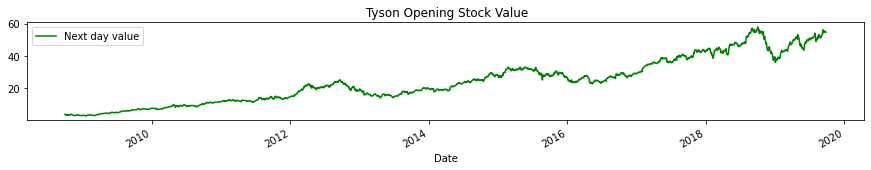

In [327]:
dataset_for_prediction['Mean'].plot(color='green', figsize=(15,2))
plt.legend(['Next day value',  'Mean' ])
plt.title(' Tyson Opening Stock Value')

Text(0.5, 1.0, ' Apple Stock Volume')

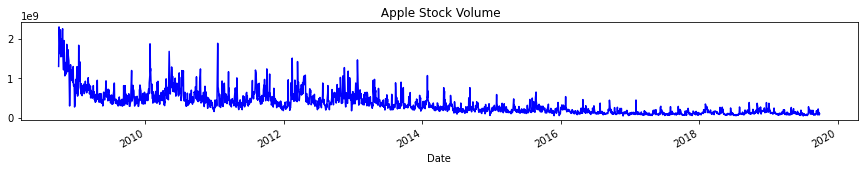

In [328]:
dataset_for_prediction['Volume'].plot(color='blue', figsize=(15,2))
plt.title(' Apple Stock Volume')

Normalizing the input and target features

Since the stock prices and volume are on a different scale, we need to normalize the data. We use MinMaxScaler; it will scale the data to a fixed range between 0 to 1

Scaling the input features- Low, High, Open, Close, Volume, Adjusted Close, and Mean

In [329]:
from sklearn.preprocessing import MinMaxScaler
sc_in = MinMaxScaler(feature_range=(0, 1))

scaled_input = sc_in.fit_transform(dataset_for_prediction[['Low', 'High','Open', 'Close', 'Volume', 'Adj Close', 'Mean']])

scaled_input =pd.DataFrame(scaled_input)
X= scaled_input
X

,0,1,2,3,4,5,6
0,0.019075,0.019558,0.021177,0.019996,0.556275,0.017620,0.019318
1,0.014246,0.017258,0.018632,0.014163,0.695398,0.012480,0.015763
2,0.010750,0.015783,0.016021,0.012203,1.000000,0.010753,0.013284
3,0.006104,0.010810,0.008183,0.012895,0.916858,0.011363,0.008474
4,0.007025,0.012562,0.013730,0.007088,0.815191,0.006246,0.009813
...,...,...,...,...,...,...,...
2762,0.944513,0.938536,0.946090,0.939565,0.013879,0.955188,0.941503
2763,0.942408,0.950486,0.955568,0.934857,0.035268,0.950434,0.946476
2764,0.942180,0.946022,0.944267,0.950022,0.018749,0.965746,0.944114
2765,0.949910,0.943496,0.950875,0.944862,0.013289,0.960536,0.946681


In [330]:
X.index = dataset_for_prediction.index
X.head()

,0,1,2,3,4,5,6
Date,,,,,,,
2008-10-01,0.019075,0.019558,0.021177,0.019996,0.556275,0.017620,0.019318
2008-10-02,0.014246,0.017258,0.018632,0.014163,0.695398,0.012480,0.015763
2008-10-03,0.010750,0.015783,0.016021,0.012203,1.000000,0.010753,0.013284
2008-10-06,0.006104,0.010810,0.008183,0.012895,0.916858,0.011363,0.008474
2008-10-07,0.007025,0.012562,0.013730,0.007088,0.815191,0.006246,0.009813


Scaling the output features -Actual. We are using a different instance of MinMaxScaler here. This will allow us to perform an inverse transform of the predicted stock prices later easily

In [331]:
sc_out = MinMaxScaler(feature_range=(0, 1))

scaler_output = sc_out.fit_transform(dataset_for_prediction[['Actual']])

scaler_output =pd.DataFrame(scaler_output)

y=scaler_output.copy()
y

,0
0,0.015763
1,0.013284
2,0.008474
3,0.009813
4,0.007075
...,...
2762,0.946476
2763,0.944114
2764,0.946681
2765,0.943206


In [332]:
X.rename(columns={0:'Low', 1:'High', 2:'Open', 3:'Close', 4:'Volume', 5:'Adj Close', 6:'Mean'}, inplace=True)
X.head(2)

,Low,High,Open,Close,Volume,Adj Close,Mean
Date,,,,,,,
2008-10-01,0.019075,0.019558,0.021177,0.019996,0.556275,0.01762,0.019318
2008-10-02,0.014246,0.017258,0.018632,0.014163,0.695398,0.01248,0.015763


In [333]:
y.rename(columns={0:'Stock Price next day'}, inplace= True)
y.index=dataset_for_prediction.index
y.head(2)

,Stock Price next day
Date,
2008-10-01,0.015763
2008-10-02,0.013284


In [334]:
train_size=int(len(dataset) *0.7)


test_size = (int(len(dataset)) - train_size )




train_X, train_y = X[:train_size].dropna(), y[:train_size].dropna()
test_X, test_y = X[train_size:].dropna(), y[train_size:].dropna()

print(train_size)

print(test_size)

1937
831


In [335]:
train_X

,Low,High,Open,Close,Volume,Adj Close,Mean
Date,,,,,,,
2008-10-01,0.019075,0.019558,0.021177,0.019996,0.556275,0.017620,0.019318
2008-10-02,0.014246,0.017258,0.018632,0.014163,0.695398,0.012480,0.015763
2008-10-03,0.010750,0.015783,0.016021,0.012203,1.000000,0.010753,0.013284
2008-10-06,0.006104,0.010810,0.008183,0.012895,0.916858,0.011363,0.008474
2008-10-07,0.007025,0.012562,0.013730,0.007088,0.815191,0.006246,0.009813
...,...,...,...,...,...,...,...
2016-06-06,0.395129,0.406644,0.394865,0.395922,0.021220,0.382868,0.400928
2016-06-07,0.401579,0.397535,0.400607,0.397733,0.019649,0.384602,0.399543
2016-06-08,0.400298,0.396137,0.399559,0.397325,0.016872,0.384212,0.398203


In [336]:
train_y

,Stock Price next day
Date,
2008-10-01,0.015763
2008-10-02,0.013284
2008-10-03,0.008474
2008-10-06,0.009813
2008-10-07,0.007075
...,...
2016-06-06,0.399543
2016-06-07,0.398203
2016-06-08,0.398680


In [337]:
test_X

,Low,High,Open,Close,Volume,Adj Close,Mean
Date,,,,,,,
2016-06-13,0.393070,0.394153,0.398055,0.390082,0.047415,0.377278,0.393616
2016-06-14,0.391469,0.391267,0.391812,0.390625,0.036586,0.377798,0.391368
2016-06-15,0.392750,0.390951,0.394090,0.389177,0.032163,0.376411,0.391844
2016-06-16,0.388359,0.387975,0.387847,0.391033,0.035510,0.378188,0.388166
2016-06-17,0.384837,0.383015,0.388622,0.380983,0.088301,0.368567,0.383919
...,...,...,...,...,...,...,...
2019-09-23,0.944513,0.938536,0.946090,0.939565,0.013879,0.955188,0.941503
2019-09-24,0.942408,0.950486,0.955568,0.934857,0.035268,0.950434,0.946476
2019-09-25,0.942180,0.946022,0.944267,0.950022,0.018749,0.965746,0.944114


In [338]:
test_y

,Stock Price next day
Date,
2016-06-13,0.391368
2016-06-14,0.391844
2016-06-15,0.388166
2016-06-16,0.383919
2016-06-17,0.383124
...,...
2019-09-23,0.946476
2019-09-24,0.944114
2019-09-25,0.946681


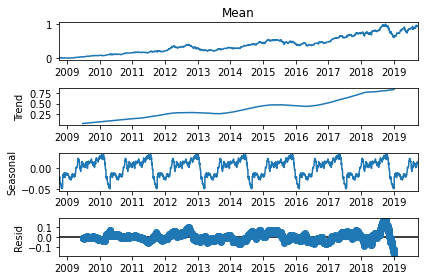

In [339]:
import statsmodels.api as sm
seas_d=sm.tsa.seasonal_decompose(X['Mean'],model='add',freq=365);

fig=seas_d.plot()
fig.set_figheight(4)
plt.show()

Check for Data Stationarity using Augmented Dickey-Fuller(ADF) test.

If we make the data stationary, then the model can make predictions based on the fact that mean and variance will remain the same in the future. A stationarized series is easier to predict

To check if the data is stationary, we will use the Augmented Dickey-Fuller test. It is the most popular statistical method to find if the series is stationary or not. It is also called as Unit Root Test.

We have written a function that will check the p-value from the ADF test results. If the value of p <0.05, then the data is stationary, the data is not stationary. We can make the data stationary by methods like differencing

In [340]:
from statsmodels.tsa.stattools import adfuller

def test_adf(series, title=''):
    dfout={}
    dftest=sm.tsa.adfuller(series.dropna(), autolag='AIC', regression='ct')
    for key,val in dftest[4].items():
        dfout[f'critical value ({key})']=val
    if dftest[1]<=0.05:
        print("Strong evidence against Null Hypothesis")
        print("Reject Null Hypothesis - Data is Stationary")
        print("Data is Stationary", title)
    else:
        print("Strong evidence for  Null Hypothesis")
        print("Accept Null Hypothesis - Data is not Stationary")
        print("Data is NOT Stationary for", title)

In [341]:
y_test=y['Stock Price next day'][:train_size].dropna()
test_adf(y_test, " Stock Price")

Strong evidence for  Null Hypothesis
Accept Null Hypothesis - Data is not Stationary
Data is NOT Stationary for  Stock Price


In [342]:
y_test

Date
2008-10-01    0.015763
2008-10-02    0.013284
2008-10-03    0.008474
2008-10-06    0.009813
2008-10-07    0.007075
                ...   
2016-06-06    0.399543
2016-06-07    0.398203
2016-06-08    0.398680
2016-06-09    0.397272
2016-06-10    0.393616
Name: Stock Price next day, Length: 1937, dtype: float64

In [343]:
test_adf(y_test.diff(), 'Stock Price next day')

Strong evidence against Null Hypothesis
Reject Null Hypothesis - Data is Stationary
Data is Stationary Stock Price next day


In [344]:
y_test.diff()

Date
2008-10-01         NaN
2008-10-02   -0.002478
2008-10-03   -0.004811
2008-10-06    0.001340
2008-10-07   -0.002738
                ...   
2016-06-06   -0.001385
2016-06-07   -0.001340
2016-06-08    0.000477
2016-06-09   -0.001408
2016-06-10   -0.003656
Name: Stock Price next day, Length: 1937, dtype: float64

Building the Model

Let’s apply ARIMA and SARIMAX to our data and see which one works better. For both ARIMA and SARIMA or SARIMAX, we need to know the AR and MA terms to correct any autocorrelation in the differenced series.

The systematic way to do this is to use autocorrelation function (ACF) and partial autocorrelation (PACF) plots of the differenced series.

ACF plot: is a bar chart of the coefficients of correlation between a time series and its lags. It helps determine the value of p or the AR term.

PACF plot: a plot of the partial correlation coefficients between the series and lags of itself. Helps determine the value of q or the MA term

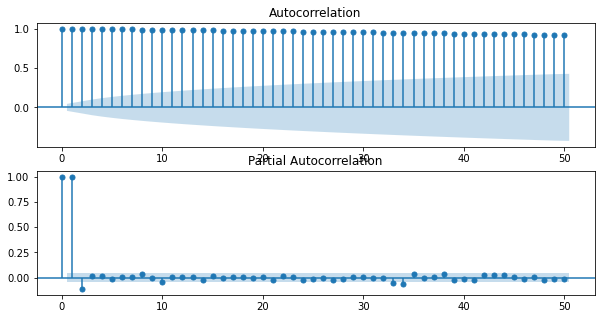

In [345]:
fig,ax= plt.subplots(2,1, figsize=(10,5))
fig=sm.tsa.graphics.plot_acf(y_test, lags=50, ax=ax[0])
fig=sm.tsa.graphics.plot_pacf(y_test, lags=50, ax=ax[1])
plt.show()

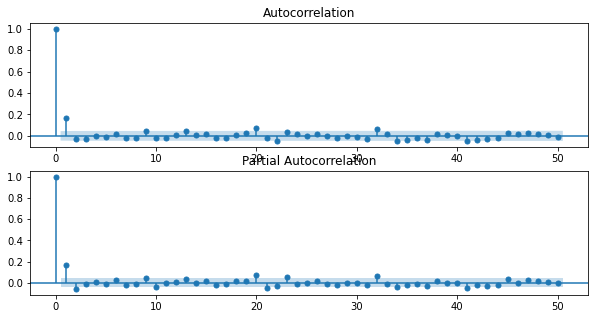

In [346]:
fig,ax= plt.subplots(2,1, figsize=(10,5))
fig=sm.tsa.graphics.plot_acf(y_test.diff()[1:], lags=50, ax=ax[0])
fig=sm.tsa.graphics.plot_pacf(y_test.diff()[1:], lags=50, ax=ax[1])
plt.show()

We see that the PACF plot has a significant spike at lag 1 and lag 2, meaning that all the higher-order autocorrelations are effectively explained by the lag-1 and lag 2 autocorrelations.

We will use pyramid auto Arima to perform a stepwise search for AR and MA term that gives the lowest value of AIC.

In [347]:
from pmdarima.arima import auto_arima

step_wise=auto_arima(train_y, 
 exogenous= train_X,
 start_p=1, start_q=1, 
 max_p=7, max_q=7, 
 d=1, max_d=7,
 trace=True, 
 error_action='ignore', 
 suppress_warnings=True, 
 stepwise=True)

step_wise

Performing stepwise search to minimize aic
 ARIMA(1,1,1)(0,0,0)[0] intercept   : AIC=-15584.603, Time=2.41 sec
 ARIMA(0,1,0)(0,0,0)[0] intercept   : AIC=-15557.801, Time=0.47 sec
 ARIMA(1,1,0)(0,0,0)[0] intercept   : AIC=-15572.034, Time=1.76 sec
 ARIMA(0,1,1)(0,0,0)[0] intercept   : AIC=-15640.544, Time=2.45 sec
 ARIMA(0,1,0)(0,0,0)[0]             : AIC=-15557.479, Time=1.17 sec
 ARIMA(0,1,2)(0,0,0)[0] intercept   : AIC=-15569.580, Time=1.80 sec
 ARIMA(1,1,2)(0,0,0)[0] intercept   : AIC=-15666.226, Time=2.93 sec
 ARIMA(2,1,2)(0,0,0)[0] intercept   : AIC=-15559.331, Time=1.20 sec
 ARIMA(1,1,3)(0,0,0)[0] intercept   : AIC=-15559.498, Time=0.90 sec
 ARIMA(0,1,3)(0,0,0)[0] intercept   : AIC=-15567.748, Time=1.89 sec
 ARIMA(2,1,1)(0,0,0)[0] intercept   : AIC=-15612.118, Time=3.03 sec
 ARIMA(2,1,3)(0,0,0)[0] intercept   : AIC=-15547.800, Time=1.37 sec
 ARIMA(1,1,2)(0,0,0)[0]             : AIC=-15560.843, Time=1.87 sec

Best model:  ARIMA(1,1,2)(0,0,0)[0] intercept
Total fit time: 23.272 sec

ARIMA(order=(1, 1, 2), scoring_args={}, suppress_warnings=True)

In [348]:
train_X

,Low,High,Open,Close,Volume,Adj Close,Mean
Date,,,,,,,
2008-10-01,0.019075,0.019558,0.021177,0.019996,0.556275,0.017620,0.019318
2008-10-02,0.014246,0.017258,0.018632,0.014163,0.695398,0.012480,0.015763
2008-10-03,0.010750,0.015783,0.016021,0.012203,1.000000,0.010753,0.013284
2008-10-06,0.006104,0.010810,0.008183,0.012895,0.916858,0.011363,0.008474
2008-10-07,0.007025,0.012562,0.013730,0.007088,0.815191,0.006246,0.009813
...,...,...,...,...,...,...,...
2016-06-06,0.395129,0.406644,0.394865,0.395922,0.021220,0.382868,0.400928
2016-06-07,0.401579,0.397535,0.400607,0.397733,0.019649,0.384602,0.399543
2016-06-08,0.400298,0.396137,0.399559,0.397325,0.016872,0.384212,0.398203


In [349]:
train_y

,Stock Price next day
Date,
2008-10-01,0.015763
2008-10-02,0.013284
2008-10-03,0.008474
2008-10-06,0.009813
2008-10-07,0.007075
...,...
2016-06-06,0.399543
2016-06-07,0.398203
2016-06-08,0.398680


In [350]:
test_X

,Low,High,Open,Close,Volume,Adj Close,Mean
Date,,,,,,,
2016-06-13,0.393070,0.394153,0.398055,0.390082,0.047415,0.377278,0.393616
2016-06-14,0.391469,0.391267,0.391812,0.390625,0.036586,0.377798,0.391368
2016-06-15,0.392750,0.390951,0.394090,0.389177,0.032163,0.376411,0.391844
2016-06-16,0.388359,0.387975,0.387847,0.391033,0.035510,0.378188,0.388166
2016-06-17,0.384837,0.383015,0.388622,0.380983,0.088301,0.368567,0.383919
...,...,...,...,...,...,...,...
2019-09-23,0.944513,0.938536,0.946090,0.939565,0.013879,0.955188,0.941503
2019-09-24,0.942408,0.950486,0.955568,0.934857,0.035268,0.950434,0.946476
2019-09-25,0.942180,0.946022,0.944267,0.950022,0.018749,0.965746,0.944114


In [351]:
test_y

,Stock Price next day
Date,
2016-06-13,0.391368
2016-06-14,0.391844
2016-06-15,0.388166
2016-06-16,0.383919
2016-06-17,0.383124
...,...
2019-09-23,0.946476
2019-09-24,0.944114
2019-09-25,0.946681


The auto_arima function fits the best ARIMA model to the time series data. This is done based on the parameters that you provide based on information criterion like AIC. The function performs a stepwise search over possible model & seasonal orders within the constraints provided. It selects the parameters that minimize the given metric like AIC(Akaike Information Criterion).

Explaining the parameters for auto_arima

exogenous: An optional 2-d array of exogenous variables. If provided, these variables are used as additional features in the regression operation. If an ARIMA is fit on exogenous features, it must be provided exogenous features for making predictions.

Seasonal: Whether to fit a seasonal ARIMA. By default, it is set to True. If we enable the seasonal parameter, we need to provide the P,D, and Q parameters.

m: Refers to the period for seasonal differencing, number of periods in each season.

d: auto_arima works by conducting differencing tests, and this is a parameter used for determining the order of differencing

start_p, max_p, start_q, max_q: We fit the model based on these defined ranges

trend: Trend of the time series. “c” for constant trend and “t” for linear trend and when we have both we can specify “ct”

error_action: default behavior is to “warn”, In our case, we are ignoring the error

trace: will print status on the fits

stepwise: specifies if we want to use a stepwise algorithm. The stepwise algorithm is significantly faster than fitting all hyper-parameter combinations and is less likely to over-fit the model.

In [352]:
step_wise.summary()

<class 'statsmodels.iolib.summary.Summary'>
"""
                               SARIMAX Results                                
==============================================================================
Dep. Variable:                      y   No. Observations:                 1937
Model:               SARIMAX(1, 1, 2)   Log Likelihood                7845.113
Date:                Thu, 20 Jan 2022   AIC                         -15666.226
Time:                        09:14:20   BIC                         -15599.406
Sample:                             0   HQIC                        -15641.651
                               - 1937                                         
Covariance Type:                  opg                                         
==============================================================================
                 coef    std err          z      P>|z|      [0.025      0.975]
------------------------------------------------------------------------------
intercept   3.659e-05   4.51e-05      0.812      0.417   -5.18e-05       0.000
Low            0.0439      0.028      1.559      0.119      -0.011       0.099
High          -0.0293      0.029     -0.995      0.320      -0.087       0.028
Open          -0.1344      0.032     -4.190      0.000      -0.197      -0.072
Close          0.8903      0.249      3.573      0.000       0.402       1.379
Volume         0.0031      0.001      2.105      0.035       0.000       0.006
Adj Close      0.0151      0.260      0.058      0.954      -0.495       0.525
Mean           0.0070      0.022      0.315      0.753      -0.037       0.051
ar.L1         -0.4608      0.345     -1.335      0.182      -1.137       0.216
ma.L1         -0.2257      0.350     -0.645      0.519      -0.912       0.460
ma.L2         -0.3682      0.236     -1.560      0.119      -0.831       0.094
sigma2       1.76e-05   2.11e-07     83.251      0.000    1.72e-05     1.8e-05
===================================================================================
Ljung-Box (L1) (Q):                   4.33   Jarque-Bera (JB):             18377.48
Prob(Q):                              0.04   Prob(JB):                         0.00
Heteroskedasticity (H):               7.54   Skew:                            -0.47
Prob(H) (two-sided):                  0.00   Kurtosis:                        18.06
===================================================================================

Warnings:
[1] Covariance matrix calculated using the outer product of gradients (complex-step).
[2] Covariance matrix is singular or near-singular, with condition number 3.17e+17. Standard errors may be unstable.
"""

The model suggested by auto_arima is SARIMAX, and the value for p,d,q is 0,1,1, respectively.
Train the model

As suggested by auto_arima, we will use SARIMAX to train our data. SARIMAX has the ability to work on datasets with missing values.

In [353]:
from statsmodels.tsa.statespace.sarimax import SARIMAX

model= SARIMAX(train_y, 
 exog=train_X,
 order=(0,1,1),
 enforce_invertibility=False, enforce_stationarity=False)

model

We now train the model by giving the target variable and the exog variable, the input features. We specify the order for p,d,q
Fit the model

we now fit the model

In [354]:
results= model.fit()

In [355]:
print(results.summary())

                                SARIMAX Results                                 
Dep. Variable:     Stock Price next day   No. Observations:                 1937
Model:                 SARIMAX(0, 1, 1)   Log Likelihood                7848.369
Date:                  Thu, 20 Jan 2022   AIC                         -15678.739
Time:                          09:14:42   BIC                         -15628.633
Sample:                               0   HQIC                        -15660.310
                                 - 1937                                         
Covariance Type:                    opg                                         
                 coef    std err          z      P>|z|      [0.025      0.975]
------------------------------------------------------------------------------
Low            0.0398      0.029      1.389      0.165      -0.016       0.096
High           0.0188      0.024      0.789      0.430      -0.028       0.066
Open          -0.1014      0.032    

### Predict or forecast the results

To predict, we can predict() or forecast() methods of SARIMAX on the object returned by fitting the data.

Below we use predict() and provide the start and end, along with the exog variable based on which the predictions will be made.

In [189]:
train_size

1937

In [190]:
test_size

831

In [281]:
831-2

829

In [191]:
steps

-1

In [204]:
train_size+test_size+(steps)-1

2766

In [206]:
2766 - 1937

829

In [280]:
test_size+(steps)-1

829

In [282]:
test_X

,Low,High,Open,Close,Volume,Adj Close,Mean
Date,,,,,,,
2016-06-13,0.393070,0.394153,0.398055,0.390082,0.047415,0.377278,0.393616
2016-06-14,0.391469,0.391267,0.391812,0.390625,0.036586,0.377798,0.391368
2016-06-15,0.392750,0.390951,0.394090,0.389177,0.032163,0.376411,0.391844
2016-06-16,0.388359,0.387975,0.387847,0.391033,0.035510,0.378188,0.388166
2016-06-17,0.384837,0.383015,0.388622,0.380983,0.088301,0.368567,0.383919
...,...,...,...,...,...,...,...
2019-09-23,0.944513,0.938536,0.946090,0.939565,0.013879,0.955188,0.941503
2019-09-24,0.942408,0.950486,0.955568,0.934857,0.035268,0.950434,0.946476
2019-09-25,0.942180,0.946022,0.944267,0.950022,0.018749,0.965746,0.944114


In [192]:
predictions= results.predict(start =train_size, end=train_size+test_size+(steps)-1,exog=test_X)
predictions

1937    0.389862
1938    0.390782
1939    0.389191
1940    0.391292
1941    0.381424
          ...   
2762    0.914556
2763    0.909436
2764    0.924998
2765    0.919648
2766    0.914391
Name: predicted_mean, Length: 830, dtype: float64

We can also use forecast() and provide steps and exog parameters. Steps is an integer value that specifies the number of steps to forecast from the end of the sample.

In [357]:
test_size-1

830

In [359]:
test_X.shape

(830, 7)

In [356]:
forecast_1= results.forecast(steps=test_size-1, exog=test_X)
forecast_1

1937    0.389862
1938    0.390782
1939    0.389191
1940    0.391292
1941    0.381424
          ...   
2762    0.914556
2763    0.909436
2764    0.924998
2765    0.919648
2766    0.914391
Name: predicted_mean, Length: 830, dtype: float64

In [209]:
test_y

,Stock Price next day
Date,
2016-06-13,0.391368
2016-06-14,0.391844
2016-06-15,0.388166
2016-06-16,0.383919
2016-06-17,0.383124
...,...
2019-09-23,0.946476
2019-09-24,0.944114
2019-09-25,0.946681


In [210]:


act= pd.DataFrame(scaler_output.iloc[train_size:, 0])
act.rename(columns={0:'Stock Price next day'}, inplace=True)
act.index= test_y.index

In [214]:
predictions=pd.DataFrame(predictions)
predictions.reset_index(drop=True, inplace=True)
predictions.index=test_X.index
predictions['Actual'] = act['Stock Price next day']
predictions.rename(columns={0:'Pred'}, inplace=True)
predictions

,predicted_mean,Actual
Date,,
2016-06-13,0.389862,0.391368
2016-06-14,0.390782,0.391844
2016-06-15,0.389191,0.388166
2016-06-16,0.391292,0.383919
2016-06-17,0.381424,0.383124
...,...,...
2019-09-23,0.914556,0.946476
2019-09-24,0.909436,0.944114
2019-09-25,0.924998,0.946681


<AxesSubplot:xlabel='Date'>

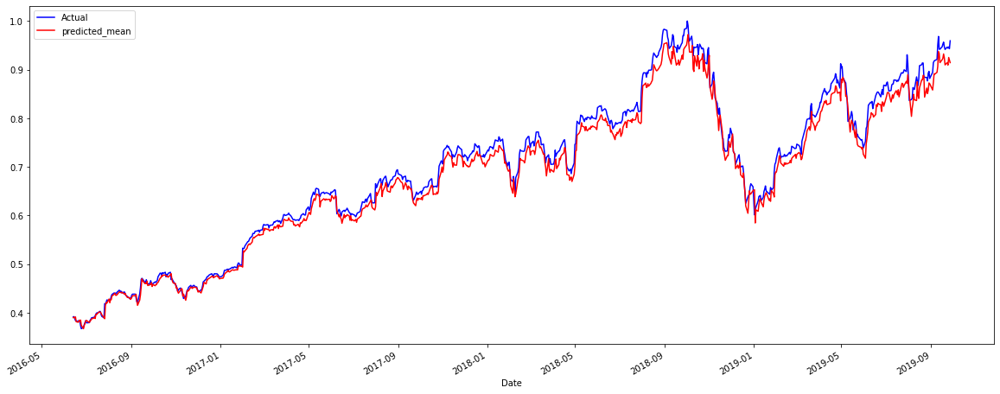

In [217]:
predictions['Actual'].plot(figsize=(20,8), legend=True, color='blue')
predictions['predicted_mean'].plot(legend=True, color='red', figsize=(20,8))

In [253]:
test_size

831

In [254]:
from statsmodels.tools.eval_measures import rmse
error=rmse(predictions['predicted_mean'], predictions['Actual'])
error

0.01958145671339632

In [364]:
exog_test10 =test_X.iloc[:30,]
exog_test10.reset_index(drop=True,inplace=True)
exog_test10

,Low,High,Open,Close,Volume,Adj Close,Mean
0,0.393070,0.394153,0.398055,0.390082,0.047415,0.377278,0.393616
1,0.391469,0.391267,0.391812,0.390625,0.036586,0.377798,0.391368
2,0.392750,0.390951,0.394090,0.389177,0.032163,0.376411,0.391844
3,0.388359,0.387975,0.387847,0.391033,0.035510,0.378188,0.388166
4,0.384837,0.383015,0.388622,0.380983,0.088301,0.368567,0.383919
5,0.383601,0.382654,0.385796,0.379942,0.040997,0.367570,0.383124
6,0.382000,0.381662,0.380966,0.383609,0.043015,0.371081,0.381830
7,0.385065,0.384097,0.386935,0.381979,0.031761,0.369521,0.384578
8,0.384608,0.381391,0.385523,0.384469,0.037134,0.371904,0.382988
9,0.372714,0.374041,0.371715,0.372246,0.113741,0.360203,0.373382


In [366]:
forecast_10= results.forecast(steps=30, exog=exog_test10)
forecast_10

1937    0.389862
1938    0.390782
1939    0.389191
1940    0.391292
1941    0.381424
1942    0.380395
1943    0.384310
1944    0.382326
1945    0.384781
1946    0.373878
1947    0.367111
1948    0.374130
1949    0.377642
1950    0.383008
1951    0.384065
1952    0.379820
1953    0.382587
1954    0.384256
1955    0.387320
1956    0.388748
1957    0.390583
1958    0.388012
1959    0.396835
1960    0.396348
1961    0.401239
1962    0.401069
1963    0.401450
1964    0.399201
1965    0.395604
1966    0.389999
Name: predicted_mean, dtype: float64

In [367]:
trainPredict = sc_out.inverse_transform(predictions[['predicted_mean']])
testPredict = sc_out.inverse_transform(predictions[['Actual']])
trainPredict

array([[24.3208644 ],
       [24.37150064],
       [24.28394599],
       [24.39958822],
       [23.85638447],
       [23.79975992],
       [24.01527727],
       [23.9060807 ],
       [24.04121232],
       [23.44103098],
       [23.06851881],
       [23.45491491],
       [23.64824065],
       [23.94361711],
       [24.00180117],
       [23.76809097],
       [23.92042491],
       [24.01226551],
       [24.18092828],
       [24.25956859],
       [24.36054311],
       [24.21903268],
       [24.70469662],
       [24.67788786],
       [24.94711141],
       [24.93779036],
       [24.95872147],
       [24.83492855],
       [24.63693729],
       [24.32839485],
       [24.19729396],
       [25.67384913],
       [26.02107013],
       [25.96201833],
       [26.42686178],
       [25.99954985],
       [26.35273368],
       [26.36556271],
       [26.7673237 ],
       [26.96283415],
       [27.0660697 ],
       [26.85432574],
       [26.84547989],
       [26.91511269],
       [27.23512924],
       [27

In [368]:
testPredict

array([[24.4037505],
       [24.4300005],
       [24.2275   ],
       [23.9937505],
       [23.95     ],
       [23.87875  ],
       [24.03     ],
       [23.9425   ],
       [23.4137505],
       [23.0687505],
       [23.2250005],
       [23.5225   ],
       [23.75875  ],
       [23.975    ],
       [23.7325   ],
       [23.753751 ],
       [24.0150005],
       [24.1175005],
       [24.2975005],
       [24.3525   ],
       [24.3137495],
       [24.5387495],
       [24.7250005],
       [24.8412495],
       [24.9174995],
       [25.0249995],
       [25.0162495],
       [24.70125  ],
       [24.4699995],
       [24.29875  ],
       [25.8875   ],
       [25.9087495],
       [26.0287505],
       [26.3200005],
       [26.25875  ],
       [26.326249 ],
       [26.41     ],
       [26.72875  ],
       [26.941251 ],
       [27.118751 ],
       [27.0825005],
       [27.0975   ],
       [27.0275005],
       [27.2025   ],
       [27.4300005],
       [27.21375  ],
       [27.3274995],
       [27.25

In [369]:
os.getcwd()

'C:\\Users\\estad\\OneDrive\\Escritorio\\MAGISTER UDD\\MACHINE LEARNING\\RED LSTM\\CUANTILE REGRESION\\time series'

# EJEMPLO FINAL

In [287]:
import requests
from io import BytesIO

In [290]:
# Dataset
friedman2 = requests.get('https://www.stata-press.com/data/r12/friedman2.dta').content
data = pd.read_stata(BytesIO(friedman2))
data.index = data.time
data.index.freq = "QS-OCT"

# Variables
endog = data.loc['1959':'1981', 'consump']
exog = sm.add_constant(data.loc['1959':'1981', 'm2'])

In [291]:
data

,m2,time,m1,consump,pc92
time,,,,,
1946-01-01,NaN,1946-01-01,NaN,134.899994,NaN
1946-04-01,NaN,1946-04-01,NaN,140.100006,NaN
1946-07-01,NaN,1946-07-01,NaN,148.899994,NaN
1946-10-01,NaN,1946-10-01,NaN,153.199997,NaN
1947-01-01,NaN,1947-01-01,NaN,156.600006,912.099976
...,...,...,...,...,...
1997-07-01,3979.270020,1997-07-01,1063.550049,5540.299805,4947.000000
1997-10-01,4046.389893,1997-10-01,1076.040039,5593.200195,4981.000000
1998-01-01,4133.879883,1998-01-01,1081.109985,5676.500000,5055.100098


In [292]:
endog

time
1959-01-01     310.399994
1959-04-01     316.399994
1959-07-01     321.700012
1959-10-01     323.799988
1960-01-01     327.299988
                 ...     
1980-10-01    1836.800049
1981-01-01    1890.300049
1981-04-01    1923.500000
1981-07-01    1967.400024
1981-10-01    1983.900024
Freq: QS-OCT, Name: consump, Length: 92, dtype: float32

In [293]:
exog

,const,m2
time,,
1959-01-01,1.0,289.149994
1959-04-01,1.0,294.049988
1959-07-01,1.0,296.730011
1959-10-01,1.0,297.799988
1960-01-01,1.0,299.350006
...,...,...
1980-10-01,1.0,1601.099976
1981-01-01,1.0,1638.000000
1981-04-01,1.0,1670.550049


In [294]:
# Fit the model
mod = sm.tsa.statespace.SARIMAX(endog, exog, order=(1,0,1))
res = mod.fit(disp=False)
print(res.summary())

                               SARIMAX Results                                
Dep. Variable:                consump   No. Observations:                   92
Model:               SARIMAX(1, 0, 1)   Log Likelihood                -340.508
Date:                Thu, 20 Jan 2022   AIC                            691.015
Time:                        00:29:39   BIC                            703.624
Sample:                    01-01-1959   HQIC                           696.105
                         - 10-01-1981                                         
Covariance Type:                  opg                                         
                 coef    std err          z      P>|z|      [0.025      0.975]
------------------------------------------------------------------------------
const        -36.0608     56.644     -0.637      0.524    -147.081      74.959
m2             1.1220      0.036     30.824      0.000       1.051       1.193
ar.L1          0.9348      0.041     22.717      0.0

In [295]:
# Dataset
raw = pd.read_stata(BytesIO(friedman2))
raw.index = raw.time
raw.index.freq = "QS-OCT"
data = raw.loc[:'1981']

# Variables
endog = data.loc['1959':, 'consump']
exog = sm.add_constant(data.loc['1959':, 'm2'])
nobs = endog.shape[0]

# Fit the model
mod = sm.tsa.statespace.SARIMAX(endog.loc[:'1978-01-01'], exog=exog.loc[:'1978-01-01'], order=(1,0,1))
fit_res = mod.fit(disp=False, maxiter=250)
print(fit_res.summary())

                               SARIMAX Results                                
Dep. Variable:                consump   No. Observations:                   77
Model:               SARIMAX(1, 0, 1)   Log Likelihood                -243.316
Date:                Thu, 20 Jan 2022   AIC                            496.633
Time:                        00:33:54   BIC                            508.352
Sample:                    01-01-1959   HQIC                           501.320
                         - 01-01-1978                                         
Covariance Type:                  opg                                         
                 coef    std err          z      P>|z|      [0.025      0.975]
------------------------------------------------------------------------------
const          0.6758     18.490      0.037      0.971     -35.563      36.915
m2             1.0379      0.021     50.333      0.000       0.997       1.078
ar.L1          0.8775      0.059     14.859      0.0

In [296]:
endog

time
1959-01-01     310.399994
1959-04-01     316.399994
1959-07-01     321.700012
1959-10-01     323.799988
1960-01-01     327.299988
                 ...     
1980-10-01    1836.800049
1981-01-01    1890.300049
1981-04-01    1923.500000
1981-07-01    1967.400024
1981-10-01    1983.900024
Freq: QS-OCT, Name: consump, Length: 92, dtype: float32

In [297]:
exog

,const,m2
time,,
1959-01-01,1.0,289.149994
1959-04-01,1.0,294.049988
1959-07-01,1.0,296.730011
1959-10-01,1.0,297.799988
1960-01-01,1.0,299.350006
...,...,...
1980-10-01,1.0,1601.099976
1981-01-01,1.0,1638.000000
1981-04-01,1.0,1670.550049


In [298]:
nobs

92

In [299]:
endog.loc[:'1978-01-01']

time
1959-01-01     310.399994
1959-04-01     316.399994
1959-07-01     321.700012
1959-10-01     323.799988
1960-01-01     327.299988
                 ...     
1977-01-01    1230.699951
1977-04-01    1259.099976
1977-07-01    1290.300049
1977-10-01    1328.099976
1978-01-01    1358.300049
Freq: QS-OCT, Name: consump, Length: 77, dtype: float32

In [300]:
exog.loc[:'1978-01-01']

,const,m2
time,,
1959-01-01,1.0,289.149994
1959-04-01,1.0,294.049988
1959-07-01,1.0,296.730011
1959-10-01,1.0,297.799988
1960-01-01,1.0,299.350006
...,...,...
1977-01-01,1.0,1188.800049
1977-04-01,1.0,1217.670044
1977-07-01,1.0,1246.900024


In [302]:
mod = sm.tsa.statespace.SARIMAX(endog, exog=exog, order=(1,0,1))
res = mod.filter(fit_res.params)
res


In [306]:
# In-sample one-step-ahead predictions
predict = res.get_prediction().summary_frame()
#predict_ci = predict.conf_int().summary_frame()
predict

consump,mean,mean_se,mean_ci_lower,mean_ci_upper
time,,,,
1959-01-01,300.779168,14.679542,272.007795,329.550541
1959-04-01,314.699554,5.811519,303.309185,326.089923
1959-07-01,318.333587,5.643381,307.272762,329.394411
1959-10-01,322.140335,5.631130,311.103522,333.177147
1960-01-01,324.148672,5.630194,313.113696,335.183649
...,...,...,...,...
1980-10-01,1792.129893,5.630116,1781.095069,1803.164717
1981-01-01,1866.121147,5.630116,1855.086323,1877.155971
1981-04-01,1907.567062,5.630116,1896.532239,1918.601886


In [307]:
# Dynamic predictions
predict_dy = res.get_prediction(dynamic='1978-01-01').summary_frame()

predict_dy

consump,mean,mean_se,mean_ci_lower,mean_ci_upper
time,,,,
1959-01-01,300.779168,14.679542,272.007795,329.550541
1959-04-01,314.699554,5.811519,303.309185,326.089923
1959-07-01,318.333587,5.643381,307.272762,329.394411
1959-10-01,322.140335,5.631130,311.103522,333.177147
1960-01-01,324.148672,5.630194,313.113696,335.183649
...,...,...,...,...
1980-10-01,1664.811511,14.321634,1636.741624,1692.881398
1981-01-01,1702.817397,14.404713,1674.584678,1731.050117
1981-04-01,1736.344279,14.468365,1707.986804,1764.701754


In [311]:
predict_dy = res.get_prediction(90, dynamic='1978-01-01').summary_frame()

predict_dy


consump,mean,mean_se,mean_ci_lower,mean_ci_upper
time,,,,
1981-07-01,1775.382451,14.517192,1746.929278,1803.835625
1981-10-01,1824.806191,14.554681,1796.279541,1853.332841


In [371]:
!pip install arch

https://towardsdatascience.com/prophet-vs-deepar-forecasting-food-demand-2fdebfb8d282

https://programmerclick.com/article/91261408890/

https://machinelearningmastery.com/multivariate-time-series-forecasting-lstms-keras/

https://machinelearningmastery.com/develop-arch-and-garch-models-for-time-series-forecasting-in-python/

In [372]:
from arch import arch_model

## MODELOS ARCH Y GARCH ...

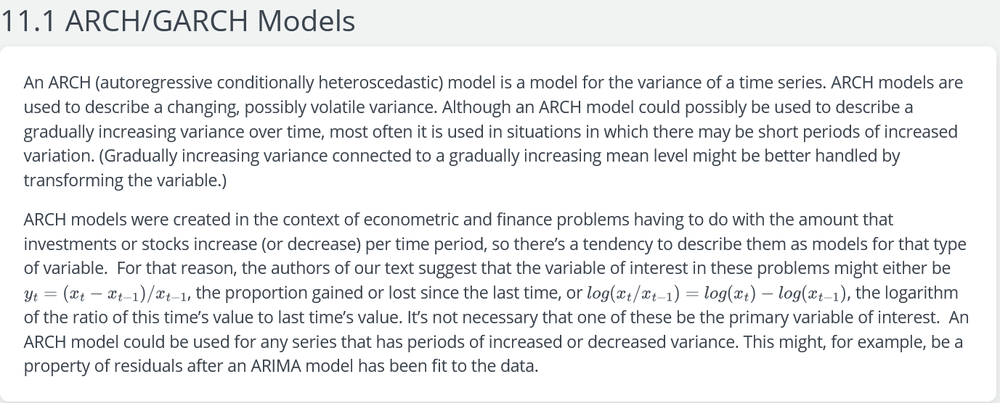

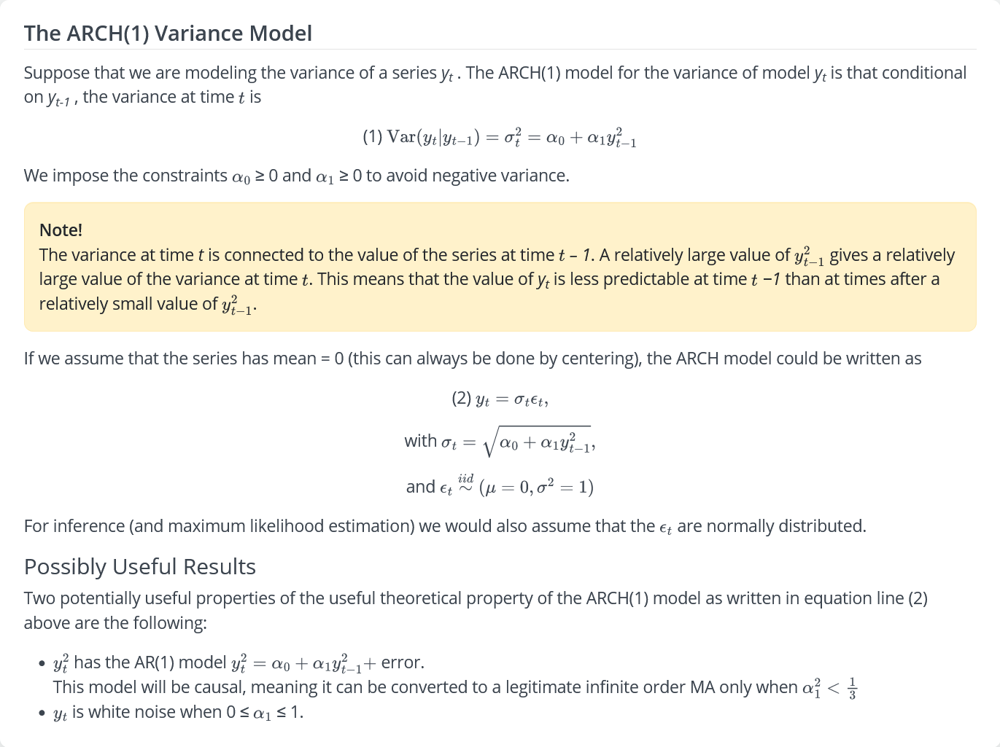

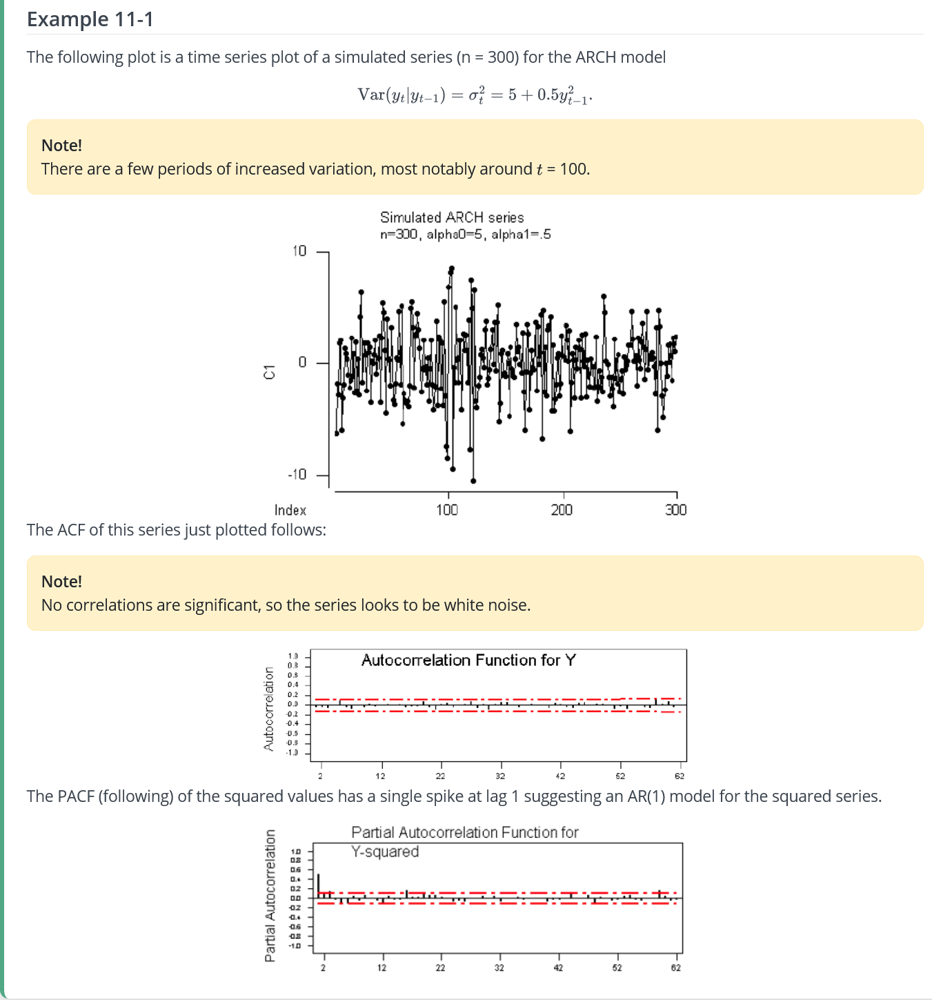

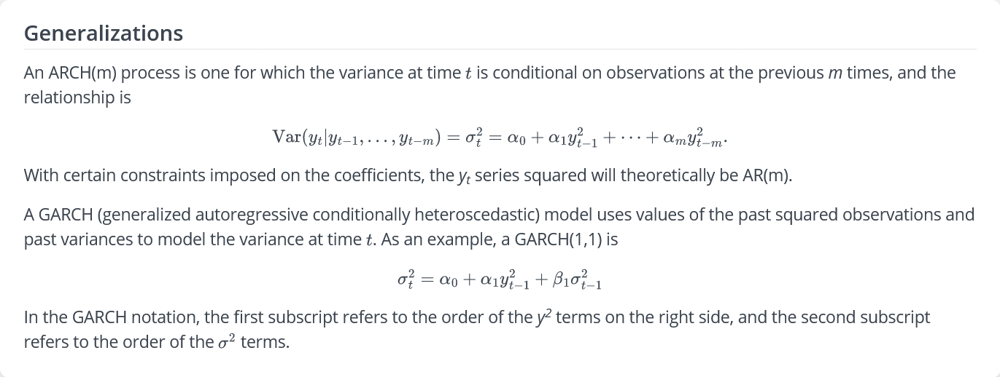

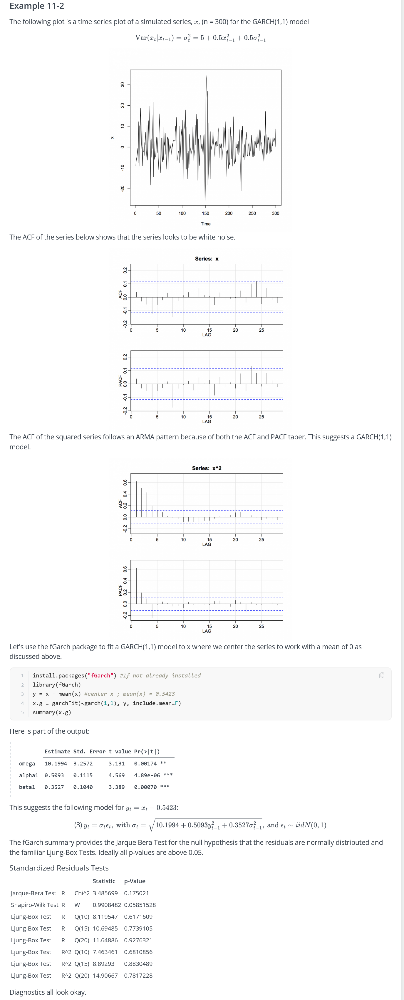

https://www.machinelearningplus.com/time-series/vector-autoregression-examples-python/

# Vector Autoregression (VAR) – Comprehensive Guide with Examples in Python

Vector Autoregression (VAR) is a forecasting algorithm that can be used when two or more time series influence each other. That is, the relationship between the time series involved is bi-directional. In this post, we will see the concepts, intuition behind VAR models and see a comprehensive and correct method to train and forecast VAR models in python using `statsmodels`.  

Content

    Introduction
    Intuition behind VAR Model Formula
    Building a VAR model in Python
    Import the datasets
    Visualize the Time Series
    Testing Causation using Granger’s Causality Test
    Cointegration Test
    Split the Series into Training and Testing Data
    Check for Stationarity and Make the Time Series Stationary
    How to Select the Order (P) of VAR model
    Train the VAR Model of Selected Order(p)
    Check for Serial Correlation of Residuals (Errors) using Durbin Watson Statistic
    How to Forecast VAR model using statsmodels
    Train the VAR Model of Selected Order(p)
    Invert the transformation to get the real forecast
    Plot of Forecast vs Actuals
    Evaluate the Forecasts
    Conclusion

## 1. Introduction

First, what is Vector Autoregression (VAR) and when to use it? Vector Autoregression (VAR) is a multivariate forecasting algorithm that is used when two or more time series influence each other. That means, the basic requirements in order to use VAR are:

    You need at least two time series (variables)
    The time series should influence each other.

Alright. So why is it called ‘Autoregressive’? It is considered as an Autoregressive model because, each variable (Time Series) is modeled as a function of the past values, that is the predictors are nothing but the lags (time delayed value) of the series. Ok, so how is VAR different from other Autoregressive models like AR, ARMA or ARIMA? The primary difference is those models are uni-directional, where, the predictors influence the Y and not vice-versa. Whereas, Vector Auto Regression (VAR) is bi-directional. That is, the variables influence each other. We will go more in detail in the next section. In this article you will gain a clear understanding of:

    Intuition behind VAR Model formula
    How to check the bi-directional relationship using Granger Causality
    Procedure to building a VAR model in Python
    How to determine the right order of VAR model
    Interpreting the results of VAR model
    How to generate forecasts to original scale of time series

## 2. Intuition behind VAR Model Formula

If you remember in Autoregression models, the time series is modeled as a linear combination of it’s own lags. That is, the past values of the series are used to forecast the current and future. A typical AR(p) model equation looks something like this: 

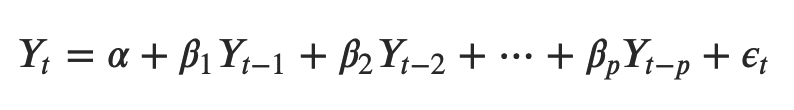

is the intercept, a constant and β1, β2 till βp are the coefficients of the lags of Y till order p. Order ‘p’ means, up to p-lags of Y is used and they are the predictors in the equation. The ε_{t} is the error, which is considered as white noise. Alright. So, how does a VAR model’s formula look like? **In the VAR model, each variable is modeled as a linear combination of past values of itself and the past values of other variables in the system. Since you have multiple time series that influence each other, it is modeled as a system of equations with one equation per variable (time series).** 


That is, if you have 5 time series that influence each other, we will have a system of 5 equations. Well, how is the equation exactly framed? ***Let’s suppose, you have two variables (Time series) Y1 and Y2, and you need to forecast the values of these variables at time (t). To calculate Y1(t), VAR will use the past values of both Y1 as well as Y2. Likewise, to compute Y2(t), the past values of both Y1 and Y2 be used. For example, the system of equations for a VAR(1) model with two time series (variables `Y1` and `Y2`) is as follows:***

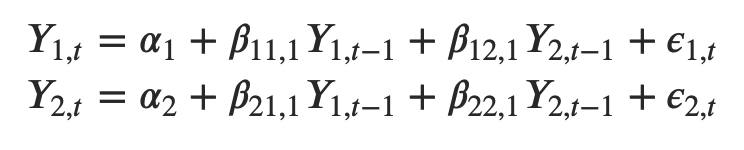

Where, Y{1,t-1} and Y{2,t-1} are the first lag of time series Y1 and Y2 respectively. The above equation is referred to as a VAR(1) model, because, each equation is of order 1, that is, it contains up to one lag of each of the predictors (Y1 and Y2). Since the Y terms in the equations are interrelated, the Y’s are considered as endogenous variables, rather than as exogenous predictors. Likewise, the second order VAR(2) model for two variables would include up to two lags for each variable (Y1 and Y2). 

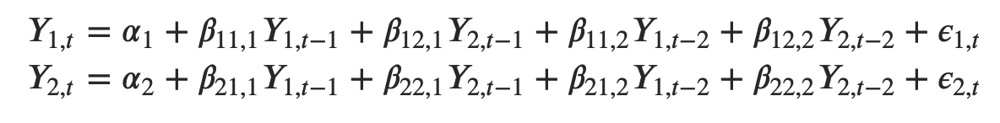

Can you imagine what a second order VAR(2) model with three variables (Y1, Y2 and Y3) would look like? 

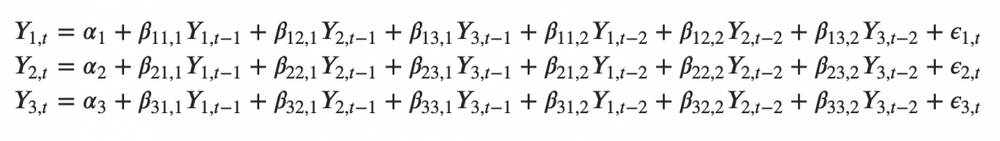

# 3. Building a VAR model in Python

The procedure to build a VAR model involves the following steps:

    Analyze the time series characteristics
    Test for causation amongst the time series
    Test for stationarity
    Transform the series to make it stationary, if needed
    Find optimal order (p)
    Prepare training and test datasets
    Train the model
    Roll back the transformations, if any.
    Evaluate the model using test set
    Forecast to future

In [7]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
%matplotlib inline

# Import Statsmodels
from statsmodels.tsa.api import VAR
from statsmodels.tsa.stattools import adfuller
from statsmodels.tools.eval_measures import rmse, aic
from statsmodels.tsa.stattools import grangercausalitytests

# 4. Import the datasets

For this article let’s use the time series used in Yash P Mehra’s 1994 article: “Wage Growth and the Inflation Process: An Empirical Approach”. This dataset has the following 8 quarterly time series:

1. rgnp  : Real GNP.
2. pgnp  : Potential real GNP.
3. ulc   : Unit labor cost.
4. gdfco : Fixed weight deflator for personal consumption expenditure excluding food and energy.
5. gdf   : Fixed weight GNP deflator.
6. gdfim : Fixed weight import deflator.
7. gdfcf : Fixed weight deflator for food in personal consumption expenditure.
8. gdfce : Fixed weight deflator for energy in personal consumption expenditure.

In [4]:
filepath = 'https://raw.githubusercontent.com/selva86/datasets/master/Raotbl6.csv'
df = pd.read_csv(filepath, parse_dates=['date'], index_col='date')
print(df.shape)  # (123, 8)
df.head()

(123, 8)


,rgnp,pgnp,ulc,gdfco,gdf,gdfim,gdfcf,gdfce
date,,,,,,,,
1959-01-01,1606.4,1608.3,47.5,36.9,37.4,26.9,32.3,23.1
1959-04-01,1637.0,1622.2,47.5,37.4,37.5,27.0,32.2,23.4
1959-07-01,1629.5,1636.2,48.7,37.6,37.6,27.1,32.4,23.4
1959-10-01,1643.4,1650.3,48.8,37.7,37.8,27.1,32.5,23.8
1960-01-01,1671.6,1664.6,49.1,37.8,37.8,27.2,32.4,23.8


In [5]:
df.tail()

,rgnp,pgnp,ulc,gdfco,gdf,gdfim,gdfcf,gdfce
date,,,,,,,,
1988-07-01,4042.7,3971.9,179.6,131.5,124.9,106.2,123.5,92.8
1988-10-01,4069.4,3995.8,181.3,133.3,126.2,107.3,124.9,92.9
1989-01-01,4106.8,4019.9,184.1,134.8,127.7,109.5,126.6,94.0
1989-04-01,4132.5,4044.1,186.1,134.8,129.3,111.1,129.0,100.6
1989-07-01,4162.9,4068.4,187.4,137.2,130.2,109.8,129.9,98.2


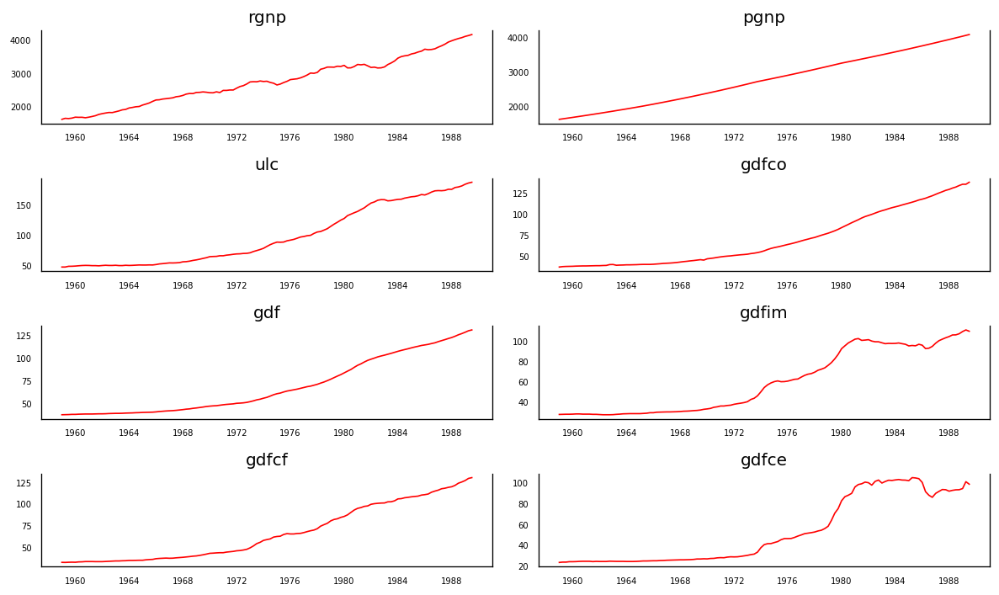

In [6]:
# Plot
fig, axes = plt.subplots(nrows=4, ncols=2, dpi=120, figsize=(10,6))
for i, ax in enumerate(axes.flatten()):
    data = df[df.columns[i]]
    ax.plot(data, color='red', linewidth=1)
    # Decorations
    ax.set_title(df.columns[i])
    ax.xaxis.set_ticks_position('none')
    ax.yaxis.set_ticks_position('none')
    ax.spines["top"].set_alpha(0)
    ax.tick_params(labelsize=6)

plt.tight_layout();

Each of the series have a fairly similar trend patterns over the years except for gdfce and gdfim, where a different pattern is noticed starting in 1980. Alright, next step in the analysis is to check for causality amongst these series. The Granger’s Causality test and the Cointegration test can help us with that.

### 6. Testing Causation using Granger’s Causality Test

The basis behind Vector AutoRegression is that each of the time series in the system influences each other. That is, you can predict the series with past values of itself along with other series in the system. Using Granger’s Causality Test, it’s possible to test this relationship before even building the model. So what does Granger’s Causality really test? **Granger’s causality tests the null hypothesis that the coefficients of past values in the regression equation is zero. In simpler terms, the past values of time series (X) do not cause the other series (Y).** So, if the p-value obtained from the test is lesser than the significance level of 0.05, then, you can safely reject the null hypothesis. The below code implements the Granger’s Causality test for all possible combinations of the time series in a given dataframe and stores the p-values of each combination in the output matrix.

In [8]:
from statsmodels.tsa.stattools import grangercausalitytests
maxlag=12
test = 'ssr_chi2test'


def grangers_causation_matrix(data, variables, test='ssr_chi2test', verbose=False):    
    """Check Granger Causality of all possible combinations of the Time series.
    The rows are the response variable, columns are predictors. The values in the table 
    are the P-Values. P-Values lesser than the significance level (0.05), implies 
    the Null Hypothesis that the coefficients of the corresponding past values is 
    zero, that is, the X does not cause Y can be rejected.

    data      : pandas dataframe containing the time series variables
    variables : list containing names of the time series variables.
    """
    
    df = pd.DataFrame(np.zeros((len(variables), len(variables))), columns=variables, index=variables)
    for c in df.columns:
        for r in df.index:
            test_result = grangercausalitytests(data[[r, c]], maxlag=maxlag, verbose=False)
            p_values = [round(test_result[i+1][0][test][1],4) for i in range(maxlag)]
            if verbose: print(f'Y = {r}, X = {c}, P Values = {p_values}')
            min_p_value = np.min(p_values)
            df.loc[r, c] = min_p_value
    df.columns = [var + '_x' for var in variables]
    df.index = [var + '_y' for var in variables]
    return df



grangers_causation_matrix(df, variables = df.columns)    
    
    

,rgnp_x,pgnp_x,ulc_x,gdfco_x,gdf_x,gdfim_x,gdfcf_x,gdfce_x
rgnp_y,1.0000,0.0003,0.0001,0.0212,0.0014,0.0620,0.0001,0.0071
pgnp_y,0.0000,1.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000
ulc_y,0.0000,0.0000,1.0000,0.0002,0.0000,0.0000,0.0000,0.0041
gdfco_y,0.0000,0.0000,0.0000,1.0000,0.0000,0.0000,0.0000,0.0000
gdf_y,0.0000,0.0000,0.0000,0.0000,1.0000,0.0000,0.0000,0.0000
gdfim_y,0.0011,0.0067,0.0014,0.0083,0.0011,1.0000,0.0004,0.0000
gdfcf_y,0.0000,0.0000,0.0008,0.0008,0.0000,0.0038,1.0000,0.0009
gdfce_y,0.0025,0.0485,0.0000,0.0002,0.0000,0.0000,0.0000,1.0000


## So how to read the above output? 


The row are the Response (Y) and the columns are the predictor series (X). For example, if you take the value 0.0003 in (row 1, column 2), it refers to the p-value of pgnp_x causing rgnp_y. Whereas, the 0.000 in (row 2, column 1) refers to the p-value of rgnp_y causing pgnp_x. So, how to interpret the p-values? If a given p-value is < significance level (0.05), then, the corresponding X series (column) causes the Y (row). For example, P-Value of 0.0003 at (row 1, column 2) represents the p-value of the Grangers Causality test for pgnp_x causing rgnp_y, which is less that the significance level of 0.05. So, you can reject the null hypothesis and conclude pgnp_x causes rgnp_y. Looking at the P-Values in the above table, you can pretty much observe that all the variables (time series) in the system are interchangeably causing each other. This makes this system of multi time series a good candidate for using VAR models to forecast. Next, let’s do the Cointegration test.

In [38]:
from statsmodels.tsa.vector_ar.vecm import coint_johansen

def cointegration_test(df, alpha=0.05): 
    """Perform Johanson's Cointegration Test and Report Summary"""
    out = coint_johansen(df,-1,5)
    d = {'0.90':0, '0.95':1, '0.99':2}
    traces = out.lr1
    cvts = out.cvt[:, d[str(1-alpha)]]
    

    def adjust(val, length= 6): return str(val).ljust(length)

    # Summary
    print('Name   ::  Test Stat > C(95%)    =>   Signif  \n', '--'*20)
    for col, trace, cvt in zip(df.columns, traces, cvts):
        print(adjust(col), ':: ', adjust(round(trace,2), 9), ">", adjust(cvt, 8), ' =>  ' , trace > cvt)

cointegration_test(df)

Name   ::  Test Stat > C(95%)    =>   Signif  
 ----------------------------------------
rgnp   ::  248.0     > 143.6691  =>   True
pgnp   ::  183.12    > 111.7797  =>   True
ulc    ::  130.01    > 83.9383   =>   True
gdfco  ::  85.28     > 60.0627   =>   True
gdf    ::  55.05     > 40.1749   =>   True
gdfim  ::  31.59     > 24.2761   =>   True
gdfcf  ::  14.06     > 12.3212   =>   True
gdfce  ::  0.45      > 4.1296    =>   False


In [36]:
adjust(col)

'rgnp  '

## 8. Split the Series into Training and Testing Data

Splitting the dataset into training and test data. The VAR model will be fitted on df_train and then used to forecast the next 4 observations. These forecasts will be compared against the actuals present in test data. To do the comparisons, we will use multiple forecast accuracy metrics, as seen later in this article.

In [9]:
nobs = 4
df_train, df_test = df[0:-nobs], df[-nobs:]

# Check size
print(df_train.shape)  # (119, 8)
print(df_test.shape)  # (4, 8)

(119, 8)
(4, 8)


In [10]:
df_train

,rgnp,pgnp,ulc,gdfco,gdf,gdfim,gdfcf,gdfce
date,,,,,,,,
1959-01-01,1606.4,1608.3,47.5,36.9,37.4,26.9,32.3,23.1
1959-04-01,1637.0,1622.2,47.5,37.4,37.5,27.0,32.2,23.4
1959-07-01,1629.5,1636.2,48.7,37.6,37.6,27.1,32.4,23.4
1959-10-01,1643.4,1650.3,48.8,37.7,37.8,27.1,32.5,23.8
1960-01-01,1671.6,1664.6,49.1,37.8,37.8,27.2,32.4,23.8
...,...,...,...,...,...,...,...,...
1987-07-01,3872.8,3877.7,173.9,126.0,119.6,101.9,117.7,93.1
1987-10-01,3935.6,3901.0,175.8,127.6,120.8,103.3,118.7,92.9
1988-01-01,3974.8,3924.5,175.7,128.7,121.9,104.5,119.4,91.5


## 9. Check for Stationarity and Make the Time Series Stationary

Since the VAR model requires the time series you want to forecast to be stationary, it is customary to check all the time series in the system for stationarity. Just to refresh, a stationary time series is one whose characteristics like mean and variance does not change over time. So, how to test for stationarity? There is a suite of tests called unit-root tests. The popular ones are: 1. Augmented Dickey-Fuller Test (ADF Test) 2. KPSS test 3. Philip-Perron test Let’s use the ADF test for our purpose. By the way, if a series is found to be non-stationary, you make it stationary by differencing the series once and repeat the test again until it becomes stationary. Since, differencing reduces the length of the series by 1 and since all the time series has to be of the same length, you need to difference all the series in the system if you choose to difference at all. Got it? Let’s implement the ADF Test. First, we implement a nice function (`adfuller_test()`) that writes out the results of the ADF test for any given time series and implement this function on each series one-by-one.

In [11]:
def adfuller_test(series, signif=0.05, name='', verbose=False):
    """Perform ADFuller to test for Stationarity of given series and print report"""
    r = adfuller(series, autolag='AIC')
    output = {'test_statistic':round(r[0], 4), 'pvalue':round(r[1], 4), 'n_lags':round(r[2], 4), 'n_obs':r[3]}
    p_value = output['pvalue'] 
    def adjust(val, length= 6): return str(val).ljust(length)

    # Print Summary
    print(f'    Augmented Dickey-Fuller Test on "{name}"', "\n   ", '-'*47)
    print(f' Null Hypothesis: Data has unit root. Non-Stationary.')
    print(f' Significance Level    = {signif}')
    print(f' Test Statistic        = {output["test_statistic"]}')
    print(f' No. Lags Chosen       = {output["n_lags"]}')

    for key,val in r[4].items():
        print(f' Critical value {adjust(key)} = {round(val, 3)}')

    if p_value <= signif:
        print(f" => P-Value = {p_value}. Rejecting Null Hypothesis.")
        print(f" => Series is Stationary.")
    else:
        print(f" => P-Value = {p_value}. Weak evidence to reject the Null Hypothesis.")
        print(f" => Series is Non-Stationary.")  

In [12]:
# ADF Test on each column
for name, column in df_train.iteritems():
    adfuller_test(column, name=column.name)
    print('\n')

    Augmented Dickey-Fuller Test on "rgnp" 
    -----------------------------------------------
 Null Hypothesis: Data has unit root. Non-Stationary.
 Significance Level    = 0.05
 Test Statistic        = 0.5428
 No. Lags Chosen       = 2
 Critical value 1%     = -3.488
 Critical value 5%     = -2.887
 Critical value 10%    = -2.58
 => P-Value = 0.9861. Weak evidence to reject the Null Hypothesis.
 => Series is Non-Stationary.


    Augmented Dickey-Fuller Test on "pgnp" 
    -----------------------------------------------
 Null Hypothesis: Data has unit root. Non-Stationary.
 Significance Level    = 0.05
 Test Statistic        = 1.1556
 No. Lags Chosen       = 1
 Critical value 1%     = -3.488
 Critical value 5%     = -2.887
 Critical value 10%    = -2.58
 => P-Value = 0.9957. Weak evidence to reject the Null Hypothesis.
 => Series is Non-Stationary.


    Augmented Dickey-Fuller Test on "ulc" 
    -----------------------------------------------
 Null Hypothesis: Data has unit root. N

**The ADF test confirms none of the time series is stationary. Let’s difference all of them once and check again.**

In [13]:
# 1st difference
df_differenced = df_train.diff().dropna()

In [14]:
df_differenced

,rgnp,pgnp,ulc,gdfco,gdf,gdfim,gdfcf,gdfce
date,,,,,,,,
1959-04-01,30.6,13.9,0.0,0.5,0.1,0.1,-0.1,0.3
1959-07-01,-7.5,14.0,1.2,0.2,0.1,0.1,0.2,0.0
1959-10-01,13.9,14.1,0.1,0.1,0.2,0.0,0.1,0.4
1960-01-01,28.2,14.3,0.3,0.1,0.0,0.1,-0.1,0.0
1960-04-01,-4.8,14.4,0.5,0.2,0.2,0.2,0.4,0.1
...,...,...,...,...,...,...,...,...
1987-07-01,49.3,23.2,0.5,1.5,1.1,1.5,0.6,1.8
1987-10-01,62.8,23.3,1.9,1.6,1.2,1.4,1.0,-0.2
1988-01-01,39.2,23.5,-0.1,1.1,1.1,1.2,0.7,-1.4


In [15]:
# ADF Test on each column of 2nd Differences Dataframe
for name, column in df_differenced.iteritems():
    adfuller_test(column, name=column.name)
    print('\n')

    Augmented Dickey-Fuller Test on "rgnp" 
    -----------------------------------------------
 Null Hypothesis: Data has unit root. Non-Stationary.
 Significance Level    = 0.05
 Test Statistic        = -5.3448
 No. Lags Chosen       = 1
 Critical value 1%     = -3.488
 Critical value 5%     = -2.887
 Critical value 10%    = -2.58
 => P-Value = 0.0. Rejecting Null Hypothesis.
 => Series is Stationary.


    Augmented Dickey-Fuller Test on "pgnp" 
    -----------------------------------------------
 Null Hypothesis: Data has unit root. Non-Stationary.
 Significance Level    = 0.05
 Test Statistic        = -1.8282
 No. Lags Chosen       = 0
 Critical value 1%     = -3.488
 Critical value 5%     = -2.887
 Critical value 10%    = -2.58
 => P-Value = 0.3666. Weak evidence to reject the Null Hypothesis.
 => Series is Non-Stationary.


    Augmented Dickey-Fuller Test on "ulc" 
    -----------------------------------------------
 Null Hypothesis: Data has unit root. Non-Stationary.
 Signifi

All the series are now stationary. Let’s prepare the training and test datasets.

## 10. How to Select the Order (P) of VAR model

To select the right order of the VAR model, we iteratively fit increasing orders of VAR model and pick the order that gives a model with least AIC. Though the usual practice is to look at the AIC, you can also check other best fit comparison estimates of BIC, FPE and HQIC.

In [16]:
model = VAR(df_differenced)
for i in [1,2,3,4,5,6,7,8,9]:
    result = model.fit(i)
    print('Lag Order =', i)
    print('AIC : ', result.aic)
    print('BIC : ', result.bic)
    print('FPE : ', result.fpe)
    print('HQIC: ', result.hqic, '\n')

Lag Order = 1
AIC :  -3.220380647272541
BIC :  -1.5205813027816144
FPE :  0.040037272772744395
HQIC:  -2.530283080534516 

Lag Order = 2
AIC :  -3.0433775603057014
BIC :  0.18496956030176026
FPE :  0.048491297903114364
HQIC:  -1.7328530419082693 

Lag Order = 3
AIC :  -3.2262678205670956
BIC :  1.5475271852820347
FPE :  0.04200919853669982
HQIC:  -1.2886082444373423 

Lag Order = 4
AIC :  -3.261128950156463
BIC :  3.07533061454658
FPE :  0.043943944730229605
HQIC:  -0.689515145122459 

Lag Order = 5
AIC :  -3.16362283195585
BIC :  4.753042694925988
FPE :  0.05576322375952392
HQIC:  0.0488776228212533 

Lag Order = 6
AIC :  -3.1666879709766143
BIC :  6.348058078556214
FPE :  0.06991109872992864
HQIC:  0.6937470219190356 

Lag Order = 7
AIC :  -3.137561051903109
BIC :  7.993481937271882
FPE :  0.10290615676677914
HQIC:  1.3779740849938218 

Lag Order = 8
AIC :  -3.6854633304527518
BIC :  9.080443853293218
FPE :  0.1027947587921845
HQIC:  1.4924575544598095 

Lag Order = 9
AIC :  -4.70644

C:\Users\estad\anaconda3\lib\site-packages\statsmodels\tsa\base\tsa_model.py:524: ValueWarning: No frequency information was provided, so inferred frequency QS-OCT will be used.
  warnings.warn('No frequency information was'


In the above output, the AIC drops to lowest at lag 4, then increases at lag 5 and then continuously drops further. Let’s go with the lag 4 model. An alternate method to choose the order(p) of the VAR models is to use the model.select_order(maxlags) method. The selected order(p) is the order that gives the lowest ‘AIC’, ‘BIC’, ‘FPE’ and ‘HQIC’ scores.

In [17]:
x = model.select_order(maxlags=12)
x.summary()

,AIC,BIC,FPE,HQIC
0,2.710,2.911,15.03,2.791
1,-2.482,-0.6727*,0.08386,-1.749
2,-2.266,1.151,0.1061,-0.8807
3,-2.472,2.554,0.09078,-0.4349
4,-2.544,4.089,0.09320,0.1446
5,-2.468,5.774,0.1191,0.8728
6,-2.540,7.310,0.1447,1.452
7,-2.638,8.820,0.1966,2.006
8,-3.324,9.741,0.1807,1.971
9,-4.538,10.14,0.1314,1.409


## AJUSTANDO MODELO VAR(P)

## 11. Train the VAR Model of Selected Order(p)

In [28]:
model_fitted = model.fit(1)
model_fitted.summary()

  Summary of Regression Results   
Model:                         VAR
Method:                        OLS
Date:           Tue, 25, Jan, 2022
Time:                     12:56:08
--------------------------------------------------------------------
No. of Equations:         8.00000    BIC:                   -1.52058
Nobs:                     117.000    HQIC:                  -2.53028
Log likelihood:          -1067.73    FPE:                  0.0400373
AIC:                     -3.22038    Det(Omega_mle):       0.0221303
--------------------------------------------------------------------
Results for equation rgnp
              coefficient       std. error           t-stat            prob
---------------------------------------------------------------------------
const          -12.522604        21.333478           -0.587           0.557
L1.rgnp          0.097038         0.122964            0.789           0.430
L1.pgnp          1.865900         1.225669            1.522           0.128
L1.ul

## 12. Check for Serial Correlation of Residuals (Errors) using Durbin Watson Statistic

Serial correlation of residuals is used to check if there is any leftover pattern in the residuals (errors). What does this mean to us? If there is any correlation left in the residuals, then, there is some pattern in the time series that is still left to be explained by the model. In that case, the typical course of action is to either increase the order of the model or induce more predictors into the system or look for a different algorithm to model the time series. So, checking for serial correlation is to ensure that the model is sufficiently able to explain the variances and patterns in the time series. Alright, coming back to topic. A common way of checking for serial correlation of errors can be measured using the Durbin Watson’s Statistic. 

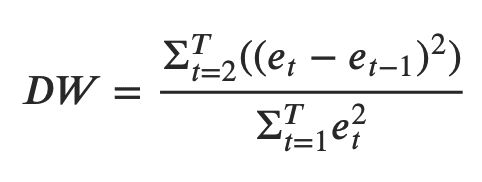


**The value of this statistic can vary between 0 and 4. The closer it is to the value 2, then there is no significant serial correlation. The closer to 0, there is a positive serial correlation, and the closer it is to 4 implies negative serial correlation.**

In [39]:
from statsmodels.stats.stattools import durbin_watson

def adjust(val, length= 6): return str(val).ljust(length)

out = durbin_watson(model_fitted.resid)

for col, val in zip(df.columns, out):
    print(adjust(col), ':', round(val, 2))

rgnp   : 2.13
pgnp   : 2.12
ulc    : 2.12
gdfco  : 2.24
gdf    : 2.42
gdfim  : 2.02
gdfcf  : 1.93
gdfce  : 2.03


The serial correlation seems quite alright. Let’s proceed with the forecast.

## 13. How to Forecast VAR model using statsmodels

In order to forecast, the VAR model expects up to the lag order number of observations from the past data. This is because, the terms in the VAR model are essentially the lags of the various time series in the dataset, so you need to provide it as many of the previous values as indicated by the lag order used by the model

In [40]:
# Get the lag order
lag_order = model_fitted.k_ar
print(lag_order)  #> 1

# Input data for forecasting
forecast_input = df_differenced.values[-lag_order:]
forecast_input

1


array([[32. , 23.8,  0.9,  1.2,  1.6,  0.1,  2.5,  0.5]])

In [42]:
df_differenced

,rgnp,pgnp,ulc,gdfco,gdf,gdfim,gdfcf,gdfce
date,,,,,,,,
1959-04-01,30.6,13.9,0.0,0.5,0.1,0.1,-0.1,0.3
1959-07-01,-7.5,14.0,1.2,0.2,0.1,0.1,0.2,0.0
1959-10-01,13.9,14.1,0.1,0.1,0.2,0.0,0.1,0.4
1960-01-01,28.2,14.3,0.3,0.1,0.0,0.1,-0.1,0.0
1960-04-01,-4.8,14.4,0.5,0.2,0.2,0.2,0.4,0.1
...,...,...,...,...,...,...,...,...
1987-07-01,49.3,23.2,0.5,1.5,1.1,1.5,0.6,1.8
1987-10-01,62.8,23.3,1.9,1.6,1.2,1.4,1.0,-0.2
1988-01-01,39.2,23.5,-0.1,1.1,1.1,1.2,0.7,-1.4


In [52]:
# Forecast
fc = model_fitted.forecast(y=forecast_input, steps=nobs)
df_forecast = pd.DataFrame(fc, index=df.index[-nobs:], columns=df.columns + '_2d')
df_forecast

,rgnp_2d,pgnp_2d,ulc_2d,gdfco_2d,gdf_2d,gdfim_2d,gdfcf_2d,gdfce_2d
date,,,,,,,,
1988-10-01,36.683032,24.055734,2.006836,1.492767,1.428117,0.635718,1.607669,1.454369
1989-01-01,27.018330,24.083306,2.137355,1.452140,1.385771,1.049578,1.342260,1.372760
1989-04-01,22.648298,24.051744,2.149920,1.471779,1.377020,1.260504,1.403496,1.327784
1989-07-01,22.255691,24.005361,2.117042,1.481074,1.382618,1.387520,1.442015,1.339680


The forecasts are generated but it is on the scale of the training data used by the model. So, to bring it back up to its original scale, you need to de-difference it as many times you had differenced the original input data. In this case it is two times.

### 14. Invert the transformation to get the real forecast

In [53]:
def invert_transformation(df_train, df_forecast, second_diff=False):
    """Revert back the differencing to get the forecast to original scale."""
    df_fc = df_forecast.copy()
    columns = df_train.columns
    for col in columns:        
        # Roll back 2nd Diff
        if second_diff:
            df_fc[str(col)+'_1d'] = (df_train[col].iloc[-1]-df_train[col].iloc[-2]) + df_fc[str(col)+'_2d'].cumsum()
        # Roll back 1st Diff
        df_fc[str(col)+'_forecast'] = df_train[col].iloc[-1] + df_fc[str(col)+'_1d'].cumsum()
    return df_fc

In [54]:
df_results = invert_transformation(df_train, df_forecast, second_diff=True)        
df_results.loc[:, ['rgnp_forecast', 'pgnp_forecast', 'ulc_forecast', 'gdfco_forecast',
                   'gdf_forecast', 'gdfim_forecast', 'gdfcf_forecast', 'gdfce_forecast']]



,rgnp_forecast,pgnp_forecast,ulc_forecast,gdfco_forecast,gdf_forecast,gdfim_forecast,gdfcf_forecast,gdfce_forecast
date,,,,,,,,
1988-10-01,4111.383032,4019.755734,182.506836,134.192767,127.928117,106.935718,127.607669,94.754369
1989-01-01,4207.084394,4091.694774,187.551028,138.337674,132.342005,108.721014,133.057597,98.081498
1989-04-01,4325.434054,4187.685558,194.745140,143.954360,138.132912,111.766815,139.911022,102.736412
1989-07-01,4466.039406,4307.681703,204.056293,151.052120,145.306438,116.200136,148.206462,108.731006


## 15. Plot of Forecast vs Actuals

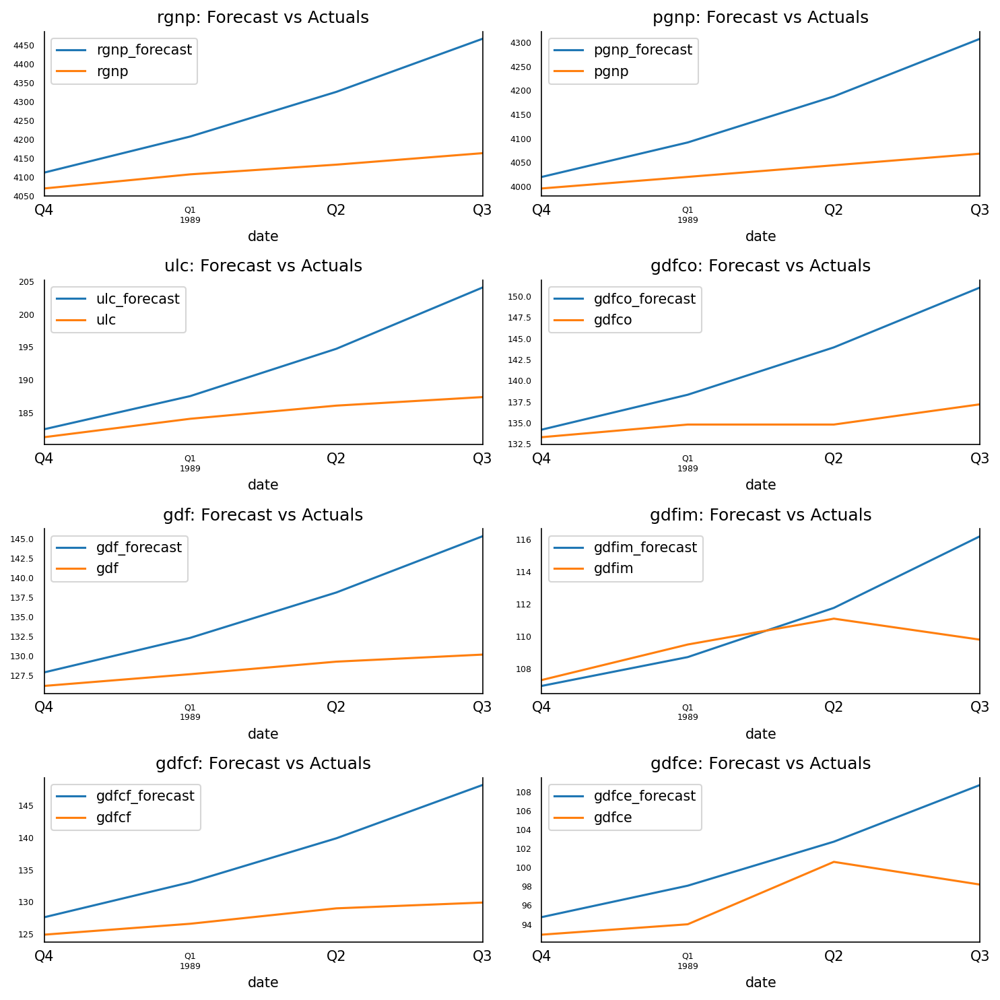

In [55]:
fig, axes = plt.subplots(nrows=int(len(df.columns)/2), ncols=2, dpi=150, figsize=(10,10))
for i, (col,ax) in enumerate(zip(df.columns, axes.flatten())):
    df_results[col+'_forecast'].plot(legend=True, ax=ax).autoscale(axis='x',tight=True)
    df_test[col][-nobs:].plot(legend=True, ax=ax);
    ax.set_title(col + ": Forecast vs Actuals")
    ax.xaxis.set_ticks_position('none')
    ax.yaxis.set_ticks_position('none')
    ax.spines["top"].set_alpha(0)
    ax.tick_params(labelsize=6)

plt.tight_layout();

## 16. Evaluate the Forecasts

To evaluate the forecasts, let’s compute a comprehensive set of metrics, namely, the MAPE, ME, MAE, MPE, RMSE, corr and minmax.

In [56]:
from statsmodels.tsa.stattools import acf
def forecast_accuracy(forecast, actual):
    mape = np.mean(np.abs(forecast - actual)/np.abs(actual))  # MAPE
    me = np.mean(forecast - actual)             # ME
    mae = np.mean(np.abs(forecast - actual))    # MAE
    mpe = np.mean((forecast - actual)/actual)   # MPE
    rmse = np.mean((forecast - actual)**2)**.5  # RMSE
    corr = np.corrcoef(forecast, actual)[0,1]   # corr
    mins = np.amin(np.hstack([forecast[:,None], 
                              actual[:,None]]), axis=1)
    maxs = np.amax(np.hstack([forecast[:,None], 
                              actual[:,None]]), axis=1)
    minmax = 1 - np.mean(mins/maxs)             # minmax
    return({'mape':mape, 'me':me, 'mae': mae, 
            'mpe': mpe, 'rmse':rmse, 'corr':corr, 'minmax':minmax})

print('Forecast Accuracy of: rgnp')
accuracy_prod = forecast_accuracy(df_results['rgnp_forecast'].values, df_test['rgnp'])
for k, v in accuracy_prod.items():
    print(adjust(k), ': ', round(v,4))

print('\nForecast Accuracy of: pgnp')
accuracy_prod = forecast_accuracy(df_results['pgnp_forecast'].values, df_test['pgnp'])
for k, v in accuracy_prod.items():
    print(adjust(k), ': ', round(v,4))

print('\nForecast Accuracy of: ulc')
accuracy_prod = forecast_accuracy(df_results['ulc_forecast'].values, df_test['ulc'])
for k, v in accuracy_prod.items():
    print(adjust(k), ': ', round(v,4))

print('\nForecast Accuracy of: gdfco')
accuracy_prod = forecast_accuracy(df_results['gdfco_forecast'].values, df_test['gdfco'])
for k, v in accuracy_prod.items():
    print(adjust(k), ': ', round(v,4))

print('\nForecast Accuracy of: gdf')
accuracy_prod = forecast_accuracy(df_results['gdf_forecast'].values, df_test['gdf'])
for k, v in accuracy_prod.items():
    print(adjust(k), ': ', round(v,4))

print('\nForecast Accuracy of: gdfim')
accuracy_prod = forecast_accuracy(df_results['gdfim_forecast'].values, df_test['gdfim'])
for k, v in accuracy_prod.items():
    print(adjust(k), ': ', round(v,4))

print('\nForecast Accuracy of: gdfcf')
accuracy_prod = forecast_accuracy(df_results['gdfcf_forecast'].values, df_test['gdfcf'])
for k, v in accuracy_prod.items():
    print(adjust(k), ': ', round(v,4))

print('\nForecast Accuracy of: gdfce')
accuracy_prod = forecast_accuracy(df_results['gdfce_forecast'].values, df_test['gdfce'])
for k, v in accuracy_prod.items():
    print(adjust(k), ': ', round(v,4))

Forecast Accuracy of: rgnp
mape   :  0.0386
me     :  159.5852
mae    :  159.5852
mpe    :  0.0386
rmse   :  187.7076
corr   :  0.9894
minmax :  0.0366

Forecast Accuracy of: pgnp
mape   :  0.0295
me     :  119.6544
mae    :  119.6544
mpe    :  0.0295
rmse   :  144.5691
corr   :  0.994
minmax :  0.0283

Forecast Accuracy of: ulc
mape   :  0.0402
me     :  7.4898
mae    :  7.4898
mpe    :  0.0402
rmse   :  9.5595
corr   :  0.9566
minmax :  0.0378

Forecast Accuracy of: gdfco
mape   :  0.0505
me     :  6.8592
mae    :  6.8592
mpe    :  0.0505
rmse   :  8.4999
corr   :  0.9487
minmax :  0.0469

Forecast Accuracy of: gdf
mape   :  0.0586
me     :  7.5774
mae    :  7.5774
mpe    :  0.0586
rmse   :  9.0934
corr   :  0.9775
minmax :  0.0541

Forecast Accuracy of: gdfim
mape   :  0.0187
me     :  1.4809
mae    :  2.0526
mpe    :  0.0134
rmse   :  3.246
corr   :  0.6098
minmax :  0.0179

Forecast Accuracy of: gdfcf
mape   :  0.0745
me     :  9.5957
mae    :  9.5957
mpe    :  0.0745
rmse   :  11

C:\Users\estad\AppData\Local\Temp/ipykernel_12228/3502259533.py:10: FutureWarning: Support for multi-dimensional indexing (e.g. `obj[:, None]`) is deprecated and will be removed in a future version.  Convert to a numpy array before indexing instead.
  actual[:,None]]), axis=1)
C:\Users\estad\AppData\Local\Temp/ipykernel_12228/3502259533.py:12: FutureWarning: Support for multi-dimensional indexing (e.g. `obj[:, None]`) is deprecated and will be removed in a future version.  Convert to a numpy array before indexing instead.
  actual[:,None]]), axis=1)


## DISTRIBUCION DE PROBABILIDADES 

In [92]:
import pandas as pd
import numpy as np
import seaborn as sns

# Gráficos
# ==============================================================================
import matplotlib.pyplot as plt
from matplotlib import style

# Ajuste de distribuciones
# ==============================================================================
from scipy import stats
import inspect
from statsmodels.distributions.empirical_distribution import ECDF

# Configuración matplotlib
# ==============================================================================
#plt.rcParams['image.cmap'] = "bwr"
#plt.rcParams['figure.dpi'] = "100"
plt.rcParams['savefig.bbox'] = "tight"
style.use('ggplot') or plt.style.use('ggplot')

# Configuración warnings
# ==============================================================================
import warnings
warnings.filterwarnings('ignore')

In [93]:
data = pd.read_csv('daily-minimum-temperatures-in-me.csv')
data['Date'] = pd.to_datetime(data['Date'], infer_datetime_format=True)
data

,Date,Daily minimum temperatures
0,1981-01-01,20.7
1,1981-01-02,17.9
2,1981-01-03,18.8
3,1981-01-04,14.6
4,1981-01-05,15.8
...,...,...
3645,1990-12-27,14
3646,1990-12-28,13.6
3647,1990-12-29,13.5
3648,1990-12-30,15.7


In [94]:
data.dtypes

Date                          datetime64[ns]
Daily minimum temperatures            object
dtype: object

In [95]:
data['Daily minimum temperatures'] = pd.to_numeric(data['Daily minimum temperatures'], errors='coerce')
data

,Date,Daily minimum temperatures
0,1981-01-01,20.7
1,1981-01-02,17.9
2,1981-01-03,18.8
3,1981-01-04,14.6
4,1981-01-05,15.8
...,...,...
3645,1990-12-27,14.0
3646,1990-12-28,13.6
3647,1990-12-29,13.5
3648,1990-12-30,15.7


In [96]:
data.dtypes

Date                          datetime64[ns]
Daily minimum temperatures           float64
dtype: object

In [97]:
data[data['Daily minimum temperatures'].isna()]

,Date,Daily minimum temperatures
565,1982-07-20,NaN
566,1982-07-21,NaN
1290,1984-07-14,NaN


In [98]:
data = data[~(data['Daily minimum temperatures'].isna())]
data

,Date,Daily minimum temperatures
0,1981-01-01,20.7
1,1981-01-02,17.9
2,1981-01-03,18.8
3,1981-01-04,14.6
4,1981-01-05,15.8
...,...,...
3645,1990-12-27,14.0
3646,1990-12-28,13.6
3647,1990-12-29,13.5
3648,1990-12-30,15.7


In [99]:
data[data['Daily minimum temperatures'].isna()]

,Date,Daily minimum temperatures


(array([ 50., 181., 564., 862., 830., 670., 347., 102.,  32.,   9.]),
 array([ 0.  ,  2.63,  5.26,  7.89, 10.52, 13.15, 15.78, 18.41, 21.04,
        23.67, 26.3 ]),
 <BarContainer object of 10 artists>)

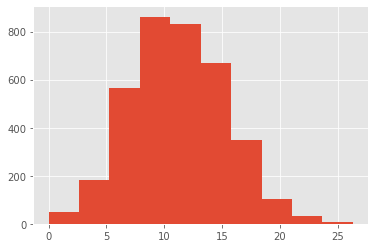

In [100]:
import seaborn as sns

z = data['Daily minimum temperatures'].values

plt.hist(z, bins=10)


<AxesSubplot:>

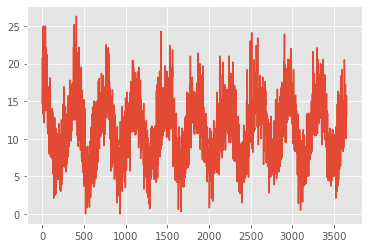

In [101]:
data['Daily minimum temperatures'].plot()

In [102]:
data['Daily minimum temperatures'].describe()

count    3647.000000
mean       11.186647
std         4.061671
min         0.000000
25%         8.300000
50%        11.000000
75%        14.000000
max        26.300000
Name: Daily minimum temperatures, dtype: float64

In [103]:
4/11

0.36363636363636365

In [149]:
deciles =[0]


for i in range(10):
    
    deciles.append(data['Daily minimum temperatures'].quantile(i/10))

deciles.append(1)
deciles

[0, 0.0, 6.1, 7.6, 8.9, 10.0, 11.0, 12.2, 13.3, 14.7, 16.3, 1]

In [136]:
data['interv'] = pd.cut(data['Daily minimum temperatures'], bins=10)
data

,Date,Daily minimum temperatures,interv
0,1981-01-01,20.7,"(18.41, 21.04]"
1,1981-01-02,17.9,"(15.78, 18.41]"
2,1981-01-03,18.8,"(18.41, 21.04]"
3,1981-01-04,14.6,"(13.15, 15.78]"
4,1981-01-05,15.8,"(15.78, 18.41]"
...,...,...,...
3645,1990-12-27,14.0,"(13.15, 15.78]"
3646,1990-12-28,13.6,"(13.15, 15.78]"
3647,1990-12-29,13.5,"(13.15, 15.78]"
3648,1990-12-30,15.7,"(13.15, 15.78]"


In [156]:
sd = data.interv.value_counts(normalize=True).reset_index()
sd2 = sd.sort_values('index', ascending=True)
sd2

,index,interv
7,"(-0.0263, 2.63]",0.013710
5,"(2.63, 5.26]",0.049630
3,"(5.26, 7.89]",0.154648
0,"(7.89, 10.52]",0.236359
1,"(10.52, 13.15]",0.227584
2,"(13.15, 15.78]",0.183713
4,"(15.78, 18.41]",0.095147
6,"(18.41, 21.04]",0.027968
8,"(21.04, 23.67]",0.008774
9,"(23.67, 26.3]",0.002468


In [157]:
sd2['cumsum'] = sd2['interv'].cumsum(axis=0)
sd2

,index,interv,cumsum
7,"(-0.0263, 2.63]",0.013710,0.013710
5,"(2.63, 5.26]",0.049630,0.063340
3,"(5.26, 7.89]",0.154648,0.217987
0,"(7.89, 10.52]",0.236359,0.454346
1,"(10.52, 13.15]",0.227584,0.681930
2,"(13.15, 15.78]",0.183713,0.865643
4,"(15.78, 18.41]",0.095147,0.960790
6,"(18.41, 21.04]",0.027968,0.988758
8,"(21.04, 23.67]",0.008774,0.997532
9,"(23.67, 26.3]",0.002468,1.000000


In [161]:
sd2.reset_index(drop=True, inplace=True)

In [165]:
sd2.set_index('index', inplace=True)

<AxesSubplot:xlabel='index'>

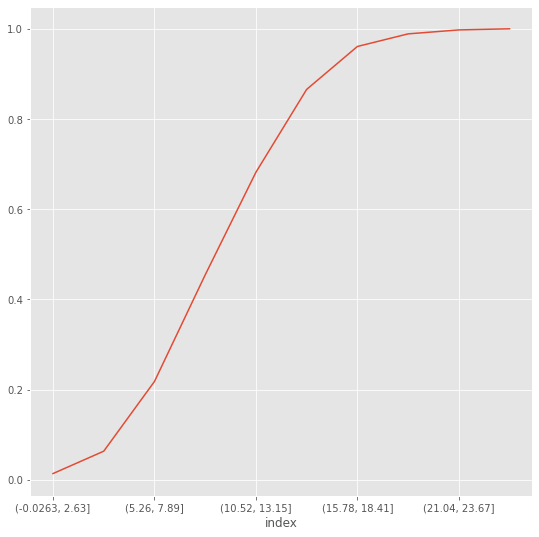

In [168]:
plt.figure(figsize=(9,9))
sd2['cumsum'].plot()

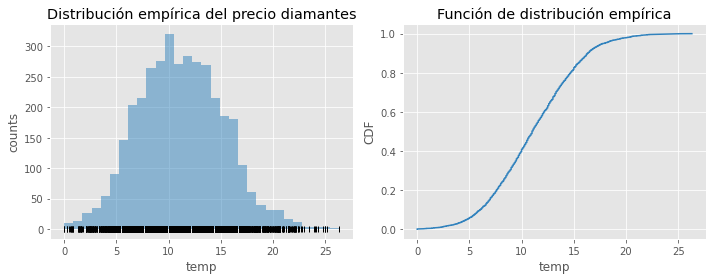

In [171]:
datos = data['Daily minimum temperatures'].values

# Gráficos distribución observada (empírica)
# ==============================================================================
fig, axs = plt.subplots(nrows=1, ncols=2, figsize=(10, 4))

# Histograma
axs[0].hist(x=datos, bins=30, color="#3182bd", alpha=0.5)
axs[0].plot(datos, np.full_like(datos, -0.01), '|k', markeredgewidth=1)
axs[0].set_title('Distribución empírica del precio diamantes')
axs[0].set_xlabel('temp')
axs[0].set_ylabel('counts')

# Función de Distribución Acumulada
# ecdf (empirical cumulative distribution function)
ecdf = ECDF(x=datos)
axs[1].plot(ecdf.x, ecdf.y, color="#3182bd")
axs[1].set_title('Función de distribución empírica')
axs[1].set_xlabel('temp')
axs[1].set_ylabel('CDF')

plt.tight_layout();



# Ajuste y selección de distribuciones con Python

## Introducción


Identificar el tipo de distribución que tiene a una variable es un paso fundamental en prácticamente todos los estudios que implican datos, desde los contrastes de hipótesis hasta la creación de modelos por aprendizaje estadístico y machine learning.

En Python existen varias librerías que permiten ajustar distribuciones. En este documento se muestran las funcionalidades del módulo scipy.stats, haciendo hincapié en cómo comparar múltiples distribuciones con el objetivo de identificar a cuál de ellas se ajustan mejor los datos. 

## Ajuste de una distribución


Ajustar una distribución paramétrica a partir de un conjunto de datos consiste en encontrar el valor de los parámetros con los que, con mayor probabilidad, dicha distribución puede haber generado los datos observados. Por ejemplo, la distribución normal tiene dos parámetros (media y varianza), una vez conocidos estos dos parámetros, se conoce toda la distribución.

Existen varios métodos que permiten encontrar los parámetros óptimos que mejor se ajustan a los datos, uno de los más utilizados, y el que implementa scipy.stats, es el método de Maximum Likelihood Estimation (MLE) (máxima verosimilitud). scipy.stats dispone de más de 90 distribuciones, puede encontrarse un listado de todas ellas en:

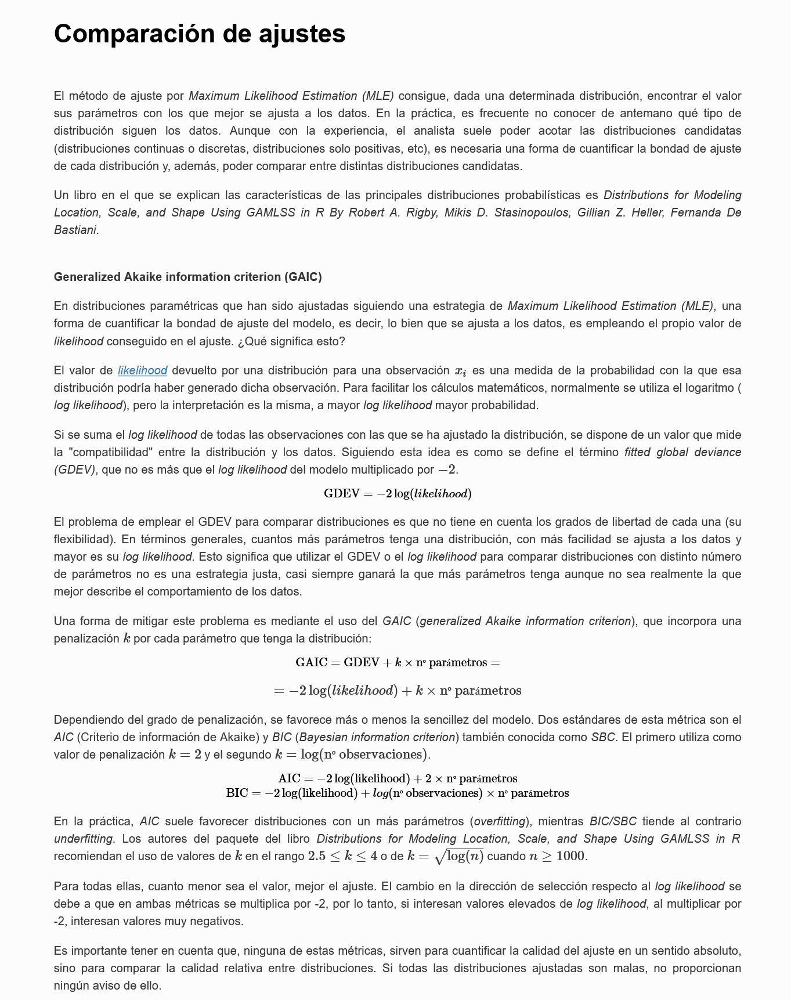

## Ejemplo 1


En este ejemplo se procede a ajustar dos distribuciones, normal y gamma, con el objetivo de modelizar la distribución del precio de venta de diamantes. Además de realizar los ajustes, se representan gráficamente los resultados y se calculan las métricas de bondad de ajuste AIC, BIC y Log-Likelihood con el objetivo de comparar e identificar el mejor que distribución se ajusta mejor. 

In [172]:
# Tratamiento de datos
# ==============================================================================
import pandas as pd
import numpy as np
import seaborn as sns

# Gráficos
# ==============================================================================
import matplotlib.pyplot as plt
from matplotlib import style

# Ajuste de distribuciones
# ==============================================================================
from scipy import stats
import inspect
from statsmodels.distributions.empirical_distribution import ECDF

# Configuración matplotlib
# ==============================================================================
#plt.rcParams['image.cmap'] = "bwr"
#plt.rcParams['figure.dpi'] = "100"
plt.rcParams['savefig.bbox'] = "tight"
style.use('ggplot') or plt.style.use('ggplot')

# Configuración warnings
# ==============================================================================
import warnings
warnings.filterwarnings('ignore')

### Datos


Para esta demostración se emplean como datos el precio de los diamantes disponible en data set diamonds de la librería seaborn, en concreto, la columna price.

In [173]:
# Datos
# ==============================================================================
datos = sns.load_dataset('diamonds')
datos = datos.loc[datos.cut == 'Fair', 'price']
datos

8         337
91       2757
97       2759
123      2762
124      2762
         ... 
53757    2724
53800    2732
53863    2743
53879    2745
53882    2747
Name: price, Length: 1610, dtype: int64

In [177]:
datos.reset_index()

,index,price
0,8,337
1,91,2757
2,97,2759
3,123,2762
4,124,2762
...,...,...
1605,53757,2724
1606,53800,2732
1607,53863,2743
1608,53879,2745




Dos de los primeros pasos a la hora de analizar una variable son: calcular los principales estadísticos descriptivos y representar las distribuciones observadas (empíricas).

Si los datos se almacenan en un Serie de Pandas, pueden obtenerse los principales estadísticos descriptivos con el método describe().


In [179]:
datos.describe().reset_index()

,index,price
0,count,1610.000000
1,mean,4358.757764
2,std,3560.386612
3,min,337.000000
4,25%,2050.250000
5,50%,3282.000000
6,75%,5205.500000
7,max,18574.000000


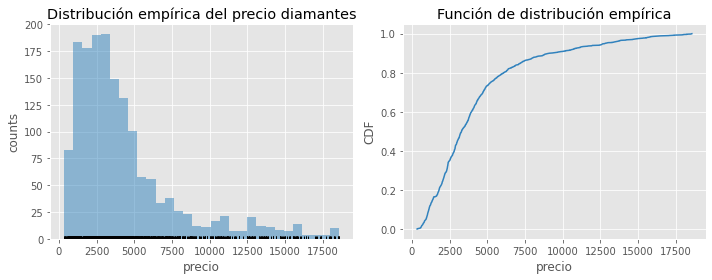

In [180]:
# Gráficos distribución observada (empírica)
# ==============================================================================
fig, axs = plt.subplots(nrows=1, ncols=2, figsize=(10, 4))

# Histograma
axs[0].hist(x=datos, bins=30, color="#3182bd", alpha=0.5)
axs[0].plot(datos, np.full_like(datos, -0.01), '|k', markeredgewidth=1)
axs[0].set_title('Distribución empírica del precio diamantes')
axs[0].set_xlabel('precio')
axs[0].set_ylabel('counts')

# Función de Distribución Acumulada
# ecdf (empirical cumulative distribution function)
ecdf = ECDF(x=datos)
axs[1].plot(ecdf.x, ecdf.y, color="#3182bd")
axs[1].set_title('Función de distribución empírica')
axs[1].set_xlabel('precio')
axs[1].set_ylabel('CDF')

plt.tight_layout();

---------------------
Resultados del ajuste
---------------------
Distribución:   norm
Dominio:        [-inf, inf]
Parámetros:     {'loc': 4358.757763975155, 'scale': 3559.2807303891086}
Log likelihood: -15449.966194325283
AIC:            30903.932388650566
BIC:            30914.700367566522


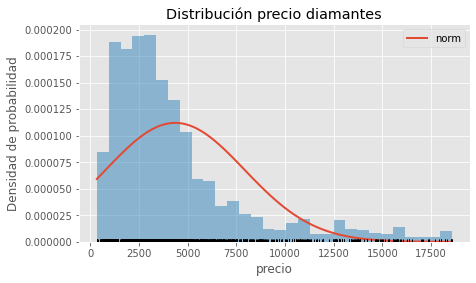

In [181]:
# Ajuste distribución normal
#===============================================================================
# 1) Se define el tipo de distribución
distribucion = stats.norm

# 2) Con el método fit() se obtienen los parámetros
parametros = distribucion.fit(data=datos)

# 3) Se crea un diccionario que incluya el nombre de cada parámetro
nombre_parametros = [p for p in inspect.signature(distribucion._pdf).parameters \
                     if not p=='x'] + ["loc","scale"]
parametros_dict = dict(zip(nombre_parametros, parametros))

# 3) Se calcula el log likelihood
log_likelihood = distribucion.logpdf(datos.to_numpy(), *parametros).sum()

# 4) Se calcula el AIC y el BIC
aic = -2 * log_likelihood + 2 * len(parametros)
bic = -2 * log_likelihood + np.log(datos.shape[0]) * len(parametros)

# 5) Gráfico
x_hat = np.linspace(min(datos), max(datos), num=100)
y_hat = distribucion.pdf(x_hat, *parametros)
fig, ax = plt.subplots(figsize=(7,4))
ax.plot(x_hat, y_hat, linewidth=2, label=distribucion.name)
ax.hist(x=datos, density=True, bins=30, color="#3182bd", alpha=0.5)
ax.plot(datos, np.full_like(datos, -0.01), '|k', markeredgewidth=1)
ax.set_title('Distribución precio diamantes')
ax.set_xlabel('precio')
ax.set_ylabel('Densidad de probabilidad')
ax.legend();

#6) Información del ajuste
print('---------------------')
print('Resultados del ajuste')
print('---------------------')
print(f"Distribución:   {distribucion.name}")
print(f"Dominio:        {[distribucion.a, distribucion.b]}")
print(f"Parámetros:     {parametros_dict}")
print(f"Log likelihood: {log_likelihood}")
print(f"AIC:            {aic}")
print(f"BIC:            {bic}")

**Se repite el proceso, pero esta vez con la distribución gamma.**

---------------------
Resultados del ajuste
---------------------
Distribución:   gamma
Dominio:        [0.0, inf]
Parámetros:     {'a': 14.399103124683087, 'loc': -6244.786483560789, 'scale': 726.3476320693849}
Log likelihood: -15235.639828174484
AIC:            30477.27965634897
BIC:            30493.431624722904


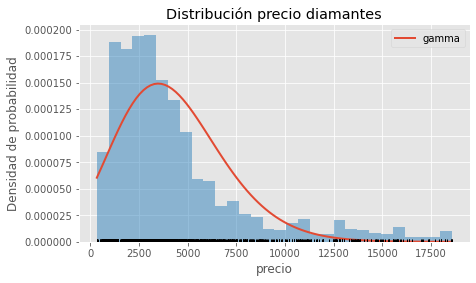

In [183]:
# Ajuste distribución gamma
#===============================================================================
# 1) Se define el tipo de distribución
distribucion = stats.gamma

# 2) Con el método fit() se obtienen los parámetros
parametros = distribucion.fit(data=datos)

# 3) Se crea un diccionario que incluya el nombre de cada parámetro
nombre_parametros = [p for p in inspect.signature(distribucion._pdf).parameters \
                     if not p=='x'] + ["loc","scale"]
parametros_dict = dict(zip(nombre_parametros, parametros))

# 3) Se calcula el log likelihood
log_likelihood = distribucion.logpdf(datos.to_numpy(), *parametros).sum()

# 4) Se calcula el AIC y el BIC
aic = -2 * log_likelihood + 2 * len(parametros)
bic = -2 * log_likelihood + np.log(datos.shape[0]) * len(parametros)

# 5) Gráfico
x_hat = np.linspace(min(datos), max(datos), num=100)
y_hat = distribucion.pdf(x_hat, *parametros)
fig, ax = plt.subplots(figsize=(7,4))
ax.plot(x_hat, y_hat, linewidth=2, label=distribucion.name)
ax.hist(x=datos, density=True, bins=30, color="#3182bd", alpha=0.5)
ax.plot(datos, np.full_like(datos, -0.01), '|k', markeredgewidth=1)
ax.set_title('Distribución precio diamantes')
ax.set_xlabel('precio')
ax.set_ylabel('Densidad de probabilidad')
ax.legend();

#6) Información del ajuste
print('---------------------')
print('Resultados del ajuste')
print('---------------------')
print(f"Distribución:   {distribucion.name}")
print(f"Dominio:        {[distribucion.a, distribucion.b]}")
print(f"Parámetros:     {parametros_dict}")
print(f"Log likelihood: {log_likelihood}")
print(f"AIC:            {aic}")
print(f"BIC:            {bic}")



Tanto la métrica AIC como la BIC coinciden en que la distribución gamma se ajusta mejor a los datos (valores de AIC y BIC más bajos). Esto se puede corroborar fácilmente con la inspección gráfica de los resultados.

En este caso, dado que los valores de precio solo pueden ser positivos y se tienen una notable cola derecha, la distribución gamma era una candidata mucho mejor que la normal. Sin embargo, hay otras posibles distribuciones, algunas de las cuales podrían ser mejores. En el siguiente ejemplo, se muestra cómo automatizar la búsqueda. 

---------------------
Resultados del ajuste
---------------------
Distribución:   beta
Dominio:        [0.0, 1.0]
Parámetros:     {'a': 0.9333196924514844, 'b': 3.2324610766086534, 'loc': 336.99999999999994, 'scale': 19393.31936068277}
Log likelihood: -15010.042587937374
AIC:            30028.08517587475
BIC:            30049.621133706663


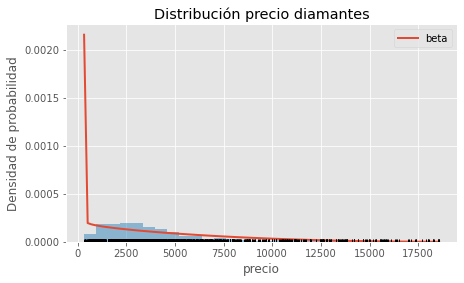

In [189]:

distribucion = stats.beta

# 2) Con el método fit() se obtienen los parámetros
parametros = distribucion.fit(data=datos)

# 3) Se crea un diccionario que incluya el nombre de cada parámetro
nombre_parametros = [p for p in inspect.signature(distribucion._pdf).parameters \
                     if not p=='x'] + ["loc","scale"]
parametros_dict = dict(zip(nombre_parametros, parametros))

# 3) Se calcula el log likelihood
log_likelihood = distribucion.logpdf(datos.to_numpy(), *parametros).sum()

# 4) Se calcula el AIC y el BIC
aic = -2 * log_likelihood + 2 * len(parametros)
bic = -2 * log_likelihood + np.log(datos.shape[0]) * len(parametros)

# 5) Gráfico
x_hat = np.linspace(min(datos), max(datos), num=100)
y_hat = distribucion.pdf(x_hat, *parametros)
fig, ax = plt.subplots(figsize=(7,4))
ax.plot(x_hat, y_hat, linewidth=2, label=distribucion.name)
ax.hist(x=datos, density=True, bins=30, color="#3182bd", alpha=0.5)
ax.plot(datos, np.full_like(datos, -0.01), '|k', markeredgewidth=1)
ax.set_title('Distribución precio diamantes')
ax.set_xlabel('precio')
ax.set_ylabel('Densidad de probabilidad')
ax.legend();

#6) Información del ajuste
print('---------------------')
print('Resultados del ajuste')
print('---------------------')
print(f"Distribución:   {distribucion.name}")
print(f"Dominio:        {[distribucion.a, distribucion.b]}")
print(f"Parámetros:     {parametros_dict}")
print(f"Log likelihood: {log_likelihood}")
print(f"AIC:            {aic}")
print(f"BIC:            {bic}")

In [57]:
import os
os.chdir('C:/Users/Jorgeds2021azure/Desktop/Docencia posgrado/Analisis de Datos 
2021/datasets')
import pandas as pd
import numpy as np
df=pd.read_csv('data_forecast.csv',sep=';')
df.columns=['ds','y','precio']
from statsmodels.graphics.tsaplots import plot_acf
from statsmodels.graphics.tsaplots import plot_pacf
"""
plot_acf(df.y,lags=179)
plot_pacf(df.y,lags=89)
"""
my_order = (1, 1, 1)
my_seasonal_order = (1, 1, 1, 12)
import statsmodels.api as sm
modelo=sm.tsa.statespace.SARIMAX(np.asarray(df.y),exog=np.asarray(df.precio), 
order=my_order,seasonal_order=my_seasonal_order)
results=modelo.fit()
print(results.summary())

SyntaxError: EOL while scanning string literal (Temp/ipykernel_12228/2794855052.py, line 2)

In [278]:
# Dataset
friedman2 = requests.get('https://www.stata-press.com/data/r12/friedman2.dta').content
data = pd.read_stata(BytesIO(friedman2))
data.index = data.time
data.index.freq = "QS-OCT"

# Variables
endog = data.loc['1959':'1981', 'consump']
exog = sm.add_constant(data.loc['1959':'1981', 'm2'])

# Fit the model
mod = sm.tsa.statespace.SARIMAX(endog, exog, order=(1,0,1))
res = mod.fit(disp=False)
print(res.summary())

NameError: name 'requests' is not defined

# FACEBOOK PROPHET PREDICTION

In [35]:
from datetime import datetime
from datetime import timedelta
import datetime as dt
from fbprophet import Prophet 
from os.path import isfile, join
from statsmodels.tools.eval_measures import rmse

In [36]:
df2 =df.copy()

df2=df[['page_loads']]
df2

,page_loads
Date,
2014-09-14,2146
2014-09-15,3621
2014-09-16,3698
2014-09-17,3667
2014-09-18,3316
...,...
2020-08-15,2221
2020-08-16,2724
2020-08-17,3456


In [37]:
df3 = df2.reset_index()
df3

,Date,page_loads
0,2014-09-14,2146
1,2014-09-15,3621
2,2014-09-16,3698
3,2014-09-17,3667
4,2014-09-18,3316
...,...,...
2162,2020-08-15,2221
2163,2020-08-16,2724
2164,2020-08-17,3456
2165,2020-08-18,3581


In [38]:
df3= df3.rename(columns={'Date':'ds', 'page_loads':'y'})
df3

,ds,y
0,2014-09-14,2146
1,2014-09-15,3621
2,2014-09-16,3698
3,2014-09-17,3667
4,2014-09-18,3316
...,...,...
2162,2020-08-15,2221
2163,2020-08-16,2724
2164,2020-08-17,3456
2165,2020-08-18,3581


In [ ]:
m = Prophet(daily_seasonality=False)
m.fit(df3)
m

In [ ]:
future = m.make_future_dataframe(periods=7)
forecast1 = m.predict(future)